# A Framework for Leveraging LLMs for Scene Analysis and Cognitive Processing

In [1]:
import os
HOME = os.getcwd()

os.chdir(HOME)
print(HOME)

/Users/berkayerkal/Documents/GitHub/human_patterns_exploration


In [2]:
from src.utils.sam_utils import download_model_weight, download_model_config

INSTALL = False
if INSTALL:
    download_model_weight("sam2.1_hiera_large.pt")
    download_model_config("sam2.1_hiera_l.yaml")
    !pip install sam2


In [3]:
import os
import pandas as pd
from src.core.FixationTask import FixationTask
from src.core.Participant import Participant
from src.core.ImageData import ImageData
from src.core.Mask import Mask
from src.models.MaskGenerator import SAM2

from src.prompts.gaze_prompts import *

In [4]:
import time

t0 = time.time(); import torch;        print("torch:", time.time()-t0)
t0 = time.time(); import sam2;         print("sam2:", time.time()-t0)
t0 = time.time(); import scipy;        print("scipy:", time.time()-t0)
t0 = time.time(); import src.core.FixationTask; print("FixationTask:", time.time()-t0)

torch: 6.699562072753906e-05
sam2: 0.00015997886657714844
scipy: 4.982948303222656e-05
FixationTask: 4.9114227294921875e-05


In [5]:
font_color =  "yellow"          
COLOR_CODE_1 = "fixation_scarletred_meddark"
COLOR_CODE_2 = "aluminium"
COLOR_CODE_3 = "yellow"

In [6]:

DATA_DIR = os.path.join(".", "data", "experiments")
IMAGE_DIR = os.path.join(".", "data", "images")
RESULTS_DIR = os.path.join(".", "outputs")

SAM_CONFIG = os.path.join(".", "configs", "sam2.1", "sam2.1_hiera_l.yaml")
SAM_MODEL =  os.path.join(".", "checkpoints", "sam2.1_hiera_large.pt")

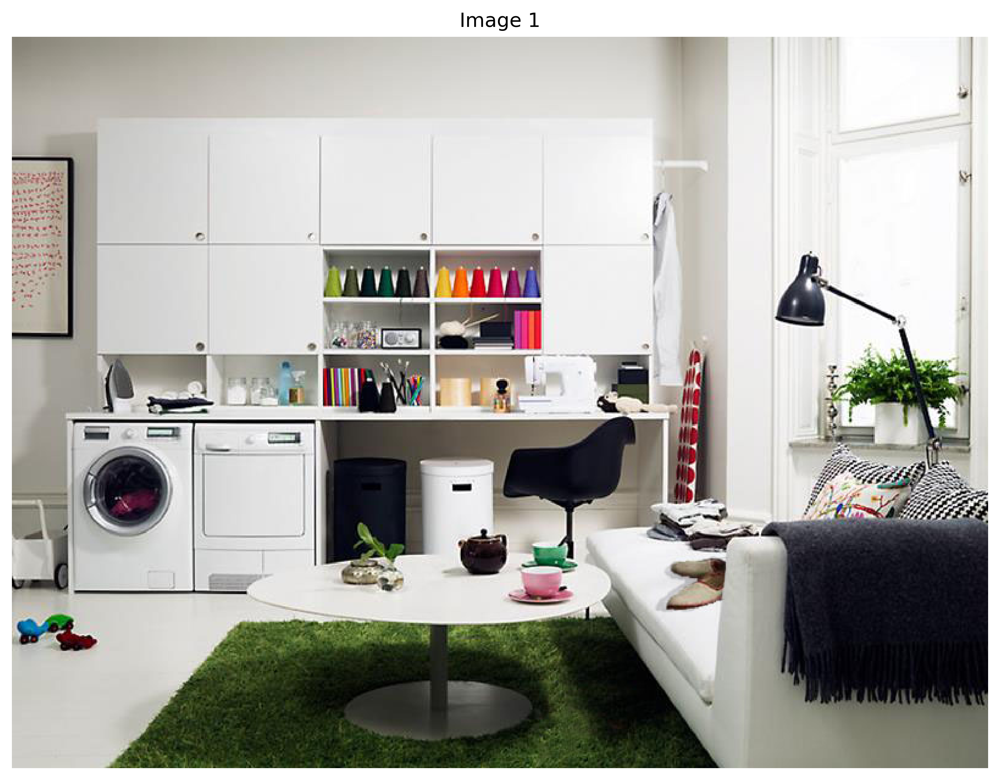

In [7]:
IMG_ID = 1
imgpath = os.path.join(IMAGE_DIR, f"{IMG_ID}unexp.jpg")
imageData = ImageData(imgpath)
imageData.show()

## Testing Gaze Points


In [8]:
datapath =  os.path.join("data", "experiments", "XSQ_Expt1_Data_All.csv")
data = pd.read_csv(datapath)

In [9]:
DATA_CSV     = datapath
IMAGE_DIR    = IMAGE_DIR
CONDITION_ID = 3
GROUP_ID     = 2

# 1. Load full dataset
data = pd.read_csv(DATA_CSV)

# 2. Pre‐filter to group 2 & condition 3
subset = data[
    (data["Condition"] == CONDITION_ID) &
    (data["Group"]     == GROUP_ID)
]

# 3. Grab the first 30 unique participants from that subset
first_30_parts = (
    subset["ParticipantID"]
    .drop_duplicates()
    .astype(int)
    .tolist()[:30]
)

# 4. Build tasks
tasks = []
for part_ID in first_30_parts:
    participant = Participant(part_ID)
    their_trials = subset.loc[
        subset.ParticipantID == part_ID,
        "ItemNum"
    ].unique()

    for IMG_ID in their_trials:
        imgpath = os.path.join(IMAGE_DIR, f"{IMG_ID}exp.jpg")
        if not os.path.isfile(imgpath):
            print(f"Warning: {imgpath} not found, skipping.")
            continue

        imageData = ImageData(imgpath, img_type="unexp")
        task = FixationTask(
            participant,
            imageData,
            data,                # full data; will be re‐filtered inside
            condition=CONDITION_ID,
            group=GROUP_ID,
            rows_per_second=1
        )
        tasks.append(task)

print(f"Created {len(tasks)} FixationTasks for the first 30 participants in Group {GROUP_ID}, Condition {CONDITION_ID}.")




Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  40
Participant data after center bias removal:  39
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias remov

Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  6
Participant data after center bias removal:  5


Participant data before center bias removal:  6
Participant data after center bias removal:  5


Participant data before center bias removal:  24
Participant data after center bias removal:  23


Participant data before center bias removal:  19
Participant data after center bias removal:  18


Participant data before center bias removal:  31
Participant data after center bias removal:  30


Participant data before center bias removal:  8
Participant data after center bias removal:  7


Participant data before center bias removal:  17
Participant data after center bias removal:  16


Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  11
Participant data after center bias removal:  10


Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  21
Participant data after center bias removal:  20


Participant data before center bias removal:  3
Participant data after center bias removal:  2


Participant data before center bias removal:  18
Participant data after center bias removal:  17


Participant data before center bias removal:  31
Participant data after center bias removal:  30


Participant data before center bias removal:  6
Participant data after center bias removal:  5


Participant data before center bias removal:  8
Participant data after center bias removal:  7


Participant data before center bias removal:  9
Participant data after center bias removal:  8


Participant data before center bias removal:  17
Participant data after center bias removal:  16


Participant data before center bias removal:  13
Participant data after center bias removal:  12


Participant data before center bias removal:  23
Participant data after center bias removal:  22


Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  7
Participant data after center bias removal:  6


Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  8
Participant data after center bias removal:  7


Participant data before center bias removal:  6
Participant data after center bias removal:  5


Participant data before center bias removal:  12
Participant data after center bias removal:  11


Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  11
Participant data after center bias removal:  10


Participant data before center bias removal:  28
Participant data after center bias removal:  27
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  3
Participant data after center bias removal:  2


Participant data before center bias removal:  4
Participant data after center bias removal:  3


Participant data before center bias removal:  17
Participant data after center bias removal:  16


Participant data before center bias removal:  17
Participant data after center bias removal:  16
Participant data before center bias removal:  18
Participant data after center bias removal:  17


Participant data before center bias removal:  21
Participant data after center bias removal:  20


Participant data before center bias removal:  4
Participant data after center bias removal:  3


Participant data before center bias removal:  5
Participant data after center bias removal:  4


Participant data before center bias removal:  3
Participant data after center bias removal:  2


Participant data before center bias removal:  4
Participant data after center bias removal:  3


Participant data before center bias removal:  6
Participant data after center bias removal:  5


Participant data before center bias removal:  41
Participant data after center bias removal:  40


Participant data before center bias removal:  4
Participant data after center bias removal:  3


Participant data before center bias removal:  7
Participant data after center bias removal:  6


Participant data before center bias removal:  6
Participant data after center bias removal:  5


Participant data before center bias removal:  5
Participant data after center bias removal:  4


Participant data before center bias removal:  10
Participant data after center bias removal:  9


Participant data before center bias removal:  5
Participant data after center bias removal:  4


Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  5
Participant data after center bias removal:  4


Participant data before center bias removal:  8
Participant data after center bias removal:  7


Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  11
Participant data after center bias removal:  10


Participant data before center bias removal:  31
Participant data after center bias removal:  30
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  18
Participant data after center bias removal:  17
Participant data before center bias removal:  21
Participant data after center bias removal:  20
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias re

Participant data before center bias removal:  25
Participant data after center bias removal:  24
Participant data before center bias removal:  24
Participant data after center bias removal:  23
Participant data before center bias removal:  16
Participant data after center bias removal:  15
Participant data before center bias removal:  26
Participant data after center bias removal:  25
Participant data before center bias removal:  27
Participant data after center bias removal:  26
Participant data before center bias removal:  24
Participant data after center bias removal:  23
Participant data before center bias removal:  25
Participant data after center bias removal:  24
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  17
Participant data after center bias removal:  16
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bia

Participant data before center bias removal:  22
Participant data after center bias removal:  21
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  21
Participant data after center bias removal:  20
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  20
Participant data after center bias removal:  19
Participant data before center bias removal:  24
Participant data after center bias removal:  23
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  17
Participant data after center bias removal:  16
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bia

Participant data before center bias removal:  25
Participant data after center bias removal:  24
Participant data before center bias removal:  18
Participant data after center bias removal:  17
Participant data before center bias removal:  33
Participant data after center bias removal:  32
Participant data before center bias removal:  27
Participant data after center bias removal:  26
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  14
Participant data after center bias removal:  13
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  17
Participant data after center bias removal:  16
Participant data before center bias re

Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  8
Participant data after center bias removal:  7


Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  19
Participant data after center bias removal:  18
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  5
Participant data after center bias removal:  4


Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  8
Participant data after center bias removal:  7


Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  17
Participant data after center bias removal:  16
Participant data before center bias removal:  27
Participant data after center bias removal:  26
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal: 

Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  27
Participant data after center bias removal:  26


Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  7


Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  29
Participant data after center bias removal:  28
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  3
Participant data after center bias removal:  2


Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  4
Participant data after center bias removal:  3


Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  28
Participant data after center bias removal:  27
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  17
Participant data after center bias removal:  16
Participant data before center bias removal:  14
Participant data after center bias removal:  13


Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  19
Participant data after center bias removal:  18
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  17
Participant data after center bias removal:  16
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias remo

Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  17
Participant data after center bias removal:  16
Participant data before center bias removal:  23
Participant data after center bias removal:  22
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  20
Participant data after center bias removal:  19
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  18
Participant data after center bias removal:  17
Participant data before center bias removal:  16
Participant data after center bias removal:  15
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias remo

Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  22
Participant data after center bias removal:  21
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  6
Participant data after center bias removal:  5


Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  34
Participant data after center bias removal:  33
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  4
Participant data after center bias removal:  3


Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  23
Participant data after center bias removal:  22
Participant data before center bias removal:  26
Participant data after center bias removal:  25


Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  31
Participant data after center bias removal:  30
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  5
Participant data after center bias removal:  4


Participant data before center bias removal:  16
Participant data after center bias removal:  15
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  13
Participant data after center bias removal:  12


Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  14
Participant data after center bias removal:  13
Participant data before center bias removal:  20
Participant data after center bias removal:  19
Participant data before center bias removal:  29
Participant data after center bias removal:  28
Participant data before center bias removal:  17
Participant data after center bias removal:  16
Participant data before center bias removal:  26
Participant data after center bias removal:  25
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  19
Participant data after center bias removal:  18
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias re

Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  27
Participant data after center bias removal:  26
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  30
Participant data after center bias removal:  29
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  8
Participant data after center bias removal:  7


Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  11
Participant data after center bias removal:  10


Participant data before center bias removal:  30
Participant data after center bias removal:  29
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  8
Participant data after center bias removal:  7


Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal

Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  3
Pa

Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  1
Participant data after center bias removal:  0
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  21
Participant data after center bias removal:  20
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  

Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  28
Participant data after center bias removal:  27
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  29
Participant data after center bias removal:  28
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:

Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  28
Participant data after center bias removal:  27
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  17
Participant data after center bias removal:  16
Participant data before center bias removal:  14
Participant data after center bias removal:  13
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal

Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  29
Participant data after center bias removal:  28
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  26
Participant data after center bias removal:  25
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias re

Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  22
Participant data after center bias removal:  21
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  14
Participant data after center bias removal:  13
Participant data before center bias removal:  19
Participant data after center bias removal:  18
Participant data before center bias removal:  21
Participant data after center bias removal:  20
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias re

Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  16
Participant data after center bias removal:  15
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  3


Participant data after center bias removal:  9
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  5
Participant data after center bias removal:  4

Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  18
Participant data after center bias removal:  17
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  

Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  21
Participant data after center bias removal:  20
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  25
Participant data after center bias removal:  24
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  

Participant data before center bias removal:  21
Participant data after center bias removal:  20
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  37
Participant data after center bias removal:  36
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias remov

Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  19
Participant data after center bias removal:  18
Participant data before center bias removal: 

Participant data before center bias removal:  14
Participant data after center bias removal:  13
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  25
Participant data after center bias removal:  24
Participant data before center bias remov

Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  1
Participant data after center bias removal:  0
Participant data before center bias removal:  16
Participant data after center bias removal:  15
Participant data before center bias removal:  14
Participant data after center bias removal:  13
Participant data before center bias removal:  23
Participant data after center bias removal:  22
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias remova

Participant data before center bias removal:  1
Participant data after center bias removal:  0
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  14
Participant data after center bias removal:  13
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  6

Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  20
Participant data after center bias removal:  19
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal: 

Participant data before center bias removal:  28
Participant data after center bias removal:  27
Participant data before center bias removal:  14
Participant data after center bias removal:  13
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  19
Participant data after center bias removal:  18
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  17
Participant data after center bias removal:  16
Participant data before center bias removal:  18
Participant data after center bias removal:  17
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias r

Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  20
Participant data after center bias removal:  19
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  29
Participant data after center bias removal:  28
Participant data before center bias removal:  24
Participant data after center bias removal:  23
Participant data before center bias removal:  26
Participant data after center bias removal:  25
Participant data before center bias removal:  21
Participant data after center bias removal:  20
Participant data before center bias removal:  23
Participant data after center bias removal:  22
Participant data before center bias removal:  17
Participant data after center bias removal:  16
Participant data before center bias removal:  16
Participant data after center bias removal:  15
Participant data before center b

Participant data before center bias removal:  19
Participant data after center bias removal:  18
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias remo

Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal: 

Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  28
Participant data after center bias removal:  27
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:

Participant data before center bias removal:  31
Participant data after center bias removal:  30
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  29
Participant data after center bias removal:  28
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  30
Participant data after center bias removal:  29
Participant data before center bias removal:  29
Participant data after center bias removal:  28
Participant data before center bias removal:  14
Participant data after center bias removal:  13
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias remo

Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  4

Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  34
Participant data after center bias removal:  33
Participant data before center bias removal:  16
Participant data after center bias removal:  15
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  20
Participant data after center bias removal:  19
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias remo

Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  21
Participant data after center bias removal:  20
Participant data before center bias removal:  16
Participant data after center bias removal:  15
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias remova

Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  29
Participant data after center bias removal:  28
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  14
Participant data after center bias removal:  13
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  16
Participant data after center bias removal:  15
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:

Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  24
Participant data after center bias removal:  23
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias remova

Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal: 

Participant data before center bias removal:  31
Participant data after center bias removal:  30
Participant data before center bias removal:  14
Participant data after center bias removal:  13
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  31
Participant data after center bias removal:  30
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  25
Participant data after center bias removal:  24
Participant data before center bias remova

Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  

Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  16
Participant data after center bias removal:  15
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  17
Participant data after center bias removal:  16
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  47
Participant data after center bias removal:  46
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias re

Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal

Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  14
Participant data after center bias removal:  13
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  17
Participant data after center bias removal:  16
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias remova

Participant data before center bias removal:  22
Participant data after center bias removal:  21
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  20
Participant data after center bias removal:  19
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias remo

Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  26
Participant data after center bias removal:  25
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias remov

Participant data before center bias removal:  25
Participant data after center bias removal:  24
Participant data before center bias removal:  29
Participant data after center bias removal:  28
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  30
Participant data after center bias removal:  29
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias 

Participant data before center bias removal:  19
Participant data after center bias removal:  18
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  24
Participant data after center bias removal:  23
Participant data before center bias removal:  19
Participant data after center bias removal:  18
Participant data before center bias removal:  16
Participant data after center bias removal:  15
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias remova

Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  

Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  

Participant data before center bias removal:  39
Participant data after center bias removal:  38
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  46
Participant data after center bias removal:  45
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  27
Participant data after center bias removal:  26
Participant data before center bias remov

Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  14
Participant data after center bias removal:  13
Participant data before center bias removal:  28
Participant data after center bias removal:  27
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  22
Participant data after center bias removal:  21
Participant data before center bias removal:  22
Participant data after center bias removal:  21
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  14
Participant data after center bias removal:  13
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias re

Participant data after center bias removal:  6
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  14
Participant data after center bias removal:  13
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  29
Participant data after center bias removal:  28
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  26
Participant data after center bias removal:  

Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  29
Participant data after center bias removal:  28
Participant data before center bias remova

Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  1
Participant data after center bias removal:  0
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  29
Participant data after center bias removal:  28
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  23
Participant data after center bias removal:  22
Participant data before center bias removal:

Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  14
Participant data after center bias removal:  13
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  18
Participant data after center bias removal:  17
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  27
Participant data after center bias removal:  26
Participant data before center bias removal:  23
Participant data after center bias removal:  22
Participant data before center bias remo

Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  26
Participant data after center bias removal:  25
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  

Participant data before center bias removal:  35
Participant data after center bias removal:  34
Participant data before center bias removal:  23
Participant data after center bias removal:  22
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias remova

Participant data before center bias removal:  14
Participant data after center bias removal:  13
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  28
Participant data after center bias removal:  27
Participant data before center bias remo

Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  14
Participant data after center bias removal:  13
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  27
Participant data after center bias removal:  26
Participant data before center bias removal:

Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  23
Participant data after center bias removal:  22
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  32
Participant data after center bias removal:  31
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  26
Participant data after center bias removal:  25
Participant data before center bias removal:  16
Participant data after center bias removal:  15
Participant data before center bias removal:  30
Participant data after center bias removal:  29
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias remo

Participant data before center bias removal:  23
Participant data after center bias removal:  22
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  25
Participant data after center bias removal:  24
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  22
Participant data after center bias removal:  21
Participant data before center bias removal:  24
Participant data after center bias removal:  23
Participant data before center bias removal:  23
Participant data after center bias removal:  22
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias re

Participant data before center bias removal:  19
Participant data after center bias removal:  18
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  23
Participant data after center bias removal:  22
Participant data before center bias removal

Participant data before center bias removal:  18
Participant data after center bias removal:  17
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  24
Participant data after center bias removal:  23
Participant data before center bias removal:  28
Participant data after center bias removal:  27
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  25
Participant data after center bias removal:  24
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias re

Participant data before center bias removal:  2
Participant data after center bias removal:  1
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  28
Participant data after center bias removal:  27
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  28
Participant data after center bias removal:  27
Participant data before center bias removal:  16
Participant data after center bias removal:  15
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  31
Participant data after center bias removal:  30
Participant data before center bias removal:  19
Participant data after center bias removal:  18
Participant data before center bias remo

Participant data before center bias removal:  3
Participant data after center bias removal:  2
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  17
Participant data after center bias removal:  16
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  15
Participant data after center bias removal:  14
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:

Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Participant data before center bias removal:  5


In [10]:
task_data = task.data.copy()

In [11]:
prompt_0 = task_data.iloc[0]
prompt_1 = task_data.iloc[1]
prompt_2 = task_data.iloc[2]

### Point Gaze Prompt

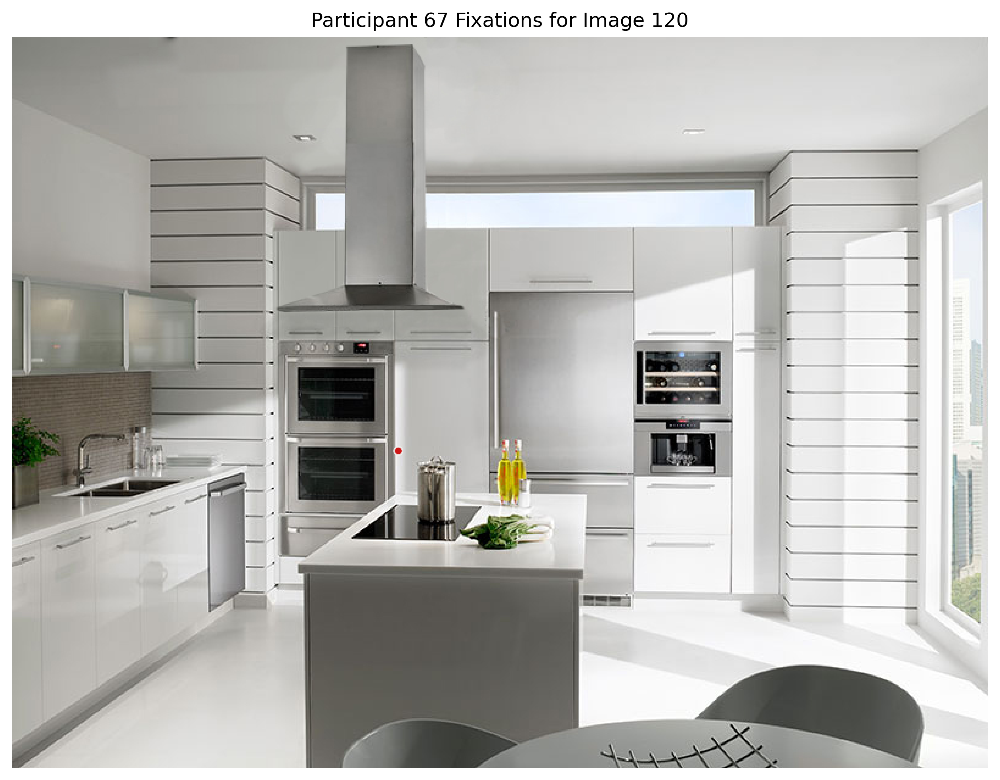

In [12]:
aug_task_data = sample_points_point(prompt_0)
task.draw_fixations( df = aug_task_data, fix_color=COLOR_CODE_1, fix_edge_color=COLOR_CODE_2, alpha=0.9, size = 25 )

### Triangle Gaze Prompt

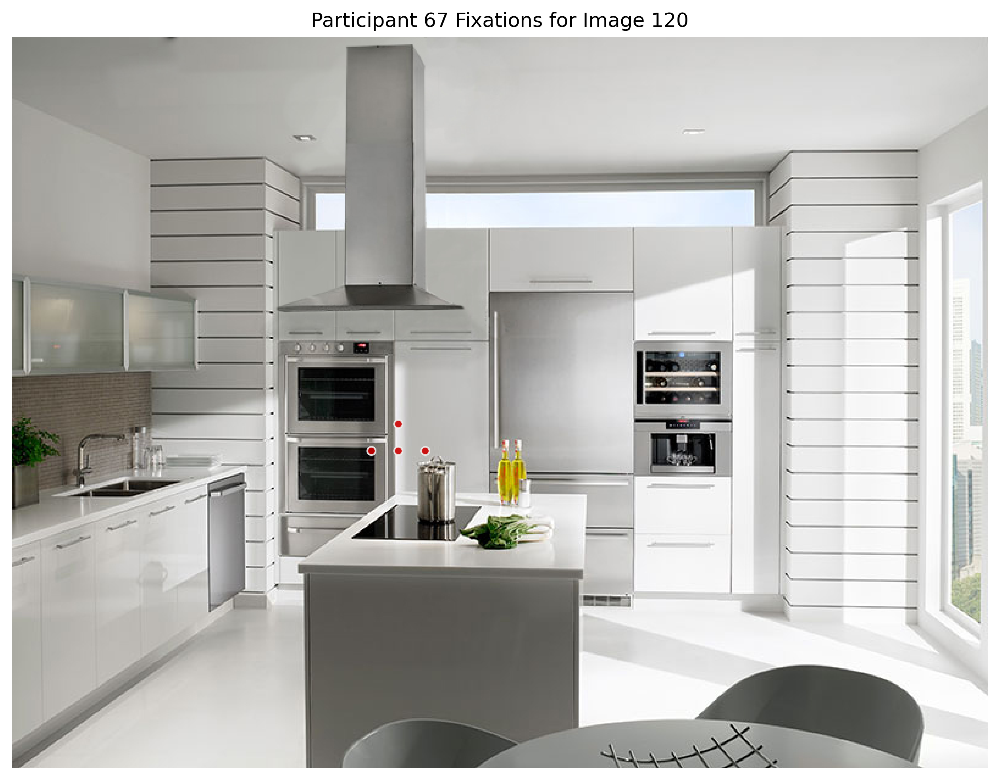

In [13]:
aug_task_data = sample_points_triangle(prompt_0)
task.draw_fixations( df = aug_task_data, fix_color=COLOR_CODE_1, fix_edge_color=COLOR_CODE_2, alpha=0.9, size = 25 )

### Cross Gaze Prompt

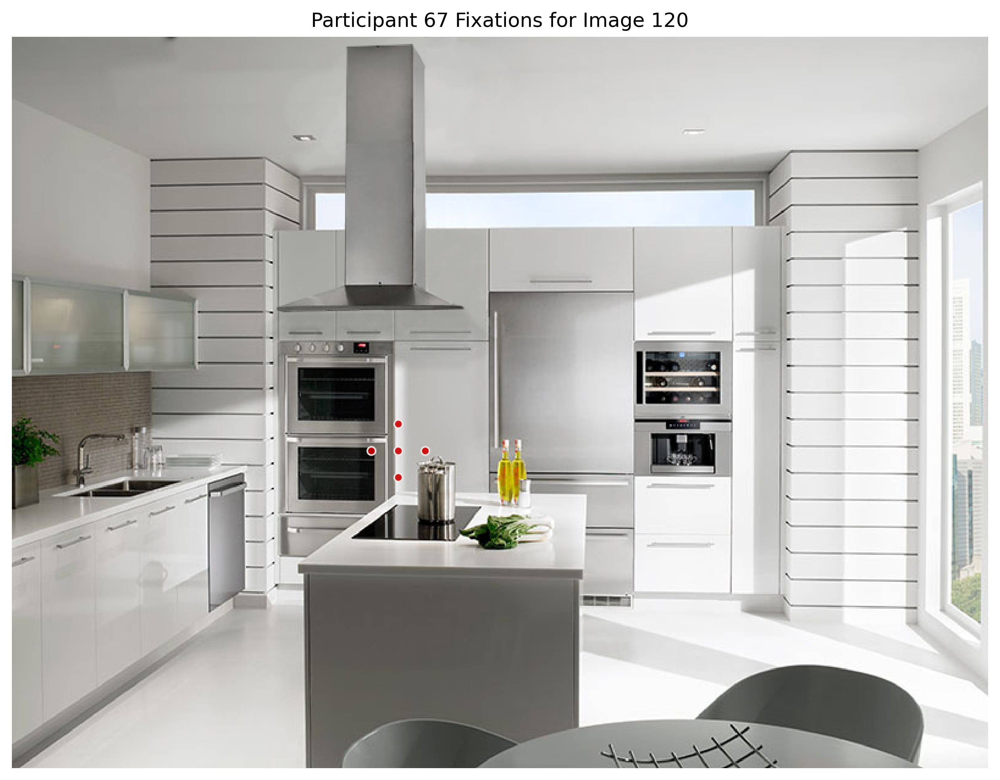

In [14]:
aug_task_data = sample_points_cross(prompt_0)
task.draw_fixations( df = aug_task_data, fix_color=COLOR_CODE_1, fix_edge_color=COLOR_CODE_2, alpha=0.9, size = 25 )

### Circle Gaze Prompt

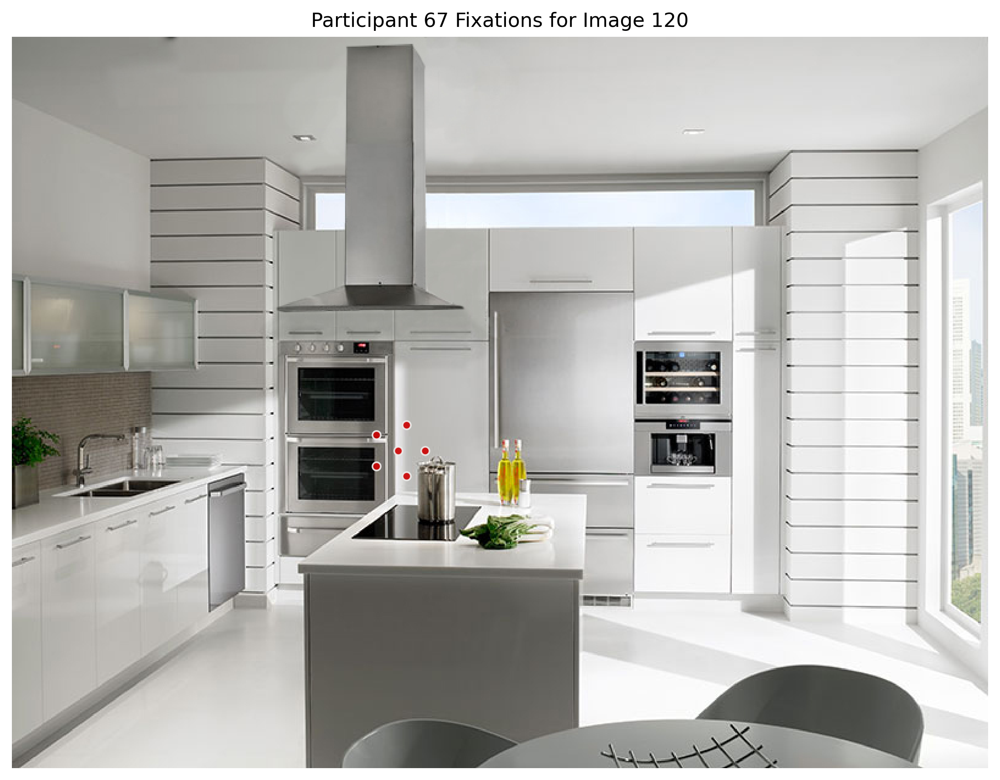

In [15]:
aug_task_data = sample_points_circle(prompt_0, N = 5)
task.draw_fixations( df = aug_task_data, fix_color=COLOR_CODE_1, fix_edge_color=COLOR_CODE_2, alpha=0.9, size = 25 )

## Testing Mask Segmentation and Labeling

Generate the description for this scene

In [16]:
from src.models.LLM import LLM, OpenAI, Ollama
from src.models.Framework import SceneUnderstandingFramework
from src.utils.llm_utils import create_llm_instance

Will process images: [np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(30)]
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 1, participant 5
	Generating general scene description…


Scene description completed in 68.78 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting is modern and organized, with a focus on functionality and style.

2. **Identified Objects**:
   - **Laundry Appliances**: A washing machine and dryer located on the left side.
   - **Cabinets**: White cabinets above the workspace, spanning the upper section of the image.
   - **Shelves**: Open shelves with colorful cones of thread or yarn, books, and decorative items, located in the middle section above the desk.
   - **Desk**: Positioned below the shelves, containing various office supplies, a sewing machine, and a chair.
   - **Chair**: A black office chair in front of the desk.
   - **Ironing Board**: Positioned vertically to the right of the desk.
   - **Sofa**: A white sofa on the right side, with cushions and a dark throw blanket.
   - **Coffee Table**: A round table in front of the sofa, with

Scene description completed in 14.20 seconds
1. **Scene Overview**: 
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting is modern and organized, with a focus on functionality and style.

2. **Identified Objects**:
   - **Laundry Appliances**: A washing machine and a dryer are located on the left side of the image.
   - **Cabinets**: White cabinets are mounted on the wall above the workspace.
   - **Shelves**: Open shelves with colorful cones of thread or yarn, books, and decorative items are situated in the center of the cabinets.
   - **Desk**: A desk runs along the wall beneath the cabinets, holding various items.
   - **Chair**: A black swivel chair is positioned in front of the desk.
   - **Ironing Board**: An ironing board with a red and white cover is leaning against the wall on the right.
   - **Lamp**: A black desk lamp is on the right side of the desk.
   - **Plants**: A potted plant is on the windowsill to 

Scene description completed in 13.92 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting appears to be a modern, compact apartment or studio.

2. **Identified Objects**:
   - **Laundry Appliances**: A washing machine and dryer are located on the left side of the image.
   - **Cabinets**: White cabinets are mounted on the wall above the workspace.
   - **Shelves**: Open shelves with colorful thread spools and books are situated between the cabinets.
   - **Desk**: A desk runs along the wall beneath the cabinets, holding various items.
   - **Chair**: A black swivel chair is positioned in front of the desk.
   - **Ironing Board**: An ironing board with a red and white cover is leaning against the wall on the right.
   - **Table**: A round white coffee table is in the foreground, with a teapot, cups, and a small plant.
   - **Sofa**: A white sofa with cushions and a dark throw is on the rig

Scene description completed in 11.26 seconds
1. **Scene Overview**: 
   - The image depicts a multifunctional room that combines a laundry area, workspace, and a small living space. The setting appears to be a modern, organized home interior.

2. **Identified Objects**:
   - **Washing Machine**: Located on the left side, beneath the countertop.
   - **Dryer**: Next to the washing machine, also beneath the countertop.
   - **White Cabinets**: Positioned above the countertop, spanning the width of the image.
   - **Open Shelves**: In the center of the cabinets, containing colorful thread spools and books.
   - **Desk**: Below the open shelves, with various items like a sewing machine, lamp, and office supplies.
   - **Black Chair**: In front of the desk.
   - **Ironing Board**: Standing upright to the right of the desk.
   - **Round Coffee Table**: In the foreground, with a teapot, cups, and a small plant.
   - **Sofa**: On the right side, with cushions and a blanket.
   - **Floor Lamp**

Scene description completed in 12.85 seconds
1. **Scene Overview**: 
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living area. The setting appears to be a modern, well-organized home interior.

2. **Identified Objects**:
   - **Laundry Appliances**: A washing machine and dryer located on the left side of the image.
   - **Cabinets**: White cabinets above the workspace, spanning the upper section of the image.
   - **Shelves**: Open shelves with colorful items, possibly thread spools or decorative objects, located in the center above the desk.
   - **Desk**: Positioned below the shelves, with various items including a sewing machine, books, and stationery.
   - **Chair**: A black swivel chair in front of the desk.
   - **Ironing Board**: Positioned vertically to the right of the desk.
   - **Sofa**: A white sofa on the right side of the image, with cushions and a dark throw blanket.
   - **Coffee Table**: A round white table in front of 

Scene description completed in 16.43 seconds
1. **Scene Overview**: 
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting is modern and organized, with a focus on functionality and style.

2. **Identified Objects**:
   - **Washing Machine**: Located on the left side, beneath the countertop.
   - **Dryer**: Next to the washing machine, also beneath the countertop.
   - **Cabinets**: White cabinets are mounted on the wall above the countertop.
   - **Shelves**: Open shelves with colorful items, located in the center of the cabinets.
   - **Desk Area**: Below the shelves, featuring various office supplies.
   - **Chair**: A black office chair is positioned in front of the desk area.
   - **Ironing Board**: Positioned vertically on the right side, near the wall.
   - **Sofa**: On the right side, with cushions and a blanket.
   - **Coffee Table**: In front of the sofa, with a teapot, cups, and a small plant.
   - **Floor La

Scene description completed in 11.94 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living area. The setting appears to be a modern, organized home environment.

2. **Identified Objects**:
   - **Laundry Area**:
     - Washing machine (bottom left)
     - Dryer (next to the washing machine)
   - **Workspace**:
     - White cabinets (top center)
     - Open shelves with colorful cones of thread (above the desk)
     - Desk with various items (center)
     - Sewing machine (on the desk, right side)
     - Office chair (in front of the desk)
     - Ironing board with a red cover (right of the desk)
   - **Living Area**:
     - White sofa (bottom right)
     - Cushions on the sofa
     - Blanket on the sofa
     - Coffee table (center bottom)
     - Teapot and cups on the coffee table
     - Green rug under the coffee table
   - **Decor and Lighting**:
     - Framed artwork (left wall)
     - Desk lamp (right si

Scene description completed in 12.18 seconds
1. **Scene Overview**: 
   - The image depicts a multifunctional room that combines elements of a laundry area, workspace, and living space. The setting is modern and organized, suggesting a practical and efficient use of space.

2. **Identified Objects**:
   - **Washing Machine**: Located on the left side, beneath the countertop.
   - **Dryer**: Next to the washing machine, also beneath the countertop.
   - **Cabinets**: White cabinets are mounted on the wall above the countertop.
   - **Shelves**: Open shelves between the cabinets, holding colorful thread spools and other items.
   - **Desk Area**: Below the shelves, featuring a sewing machine, books, and office supplies.
   - **Chair**: A black swivel chair is positioned in front of the desk area.
   - **Table**: A round white table is in the foreground, with a teapot, cups, and a small plant.
   - **Sofa**: To the right, with cushions and a blanket.
   - **Lamp**: A black adjustable lamp

Scene description completed in 15.38 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting is modern and organized, suggesting a practical and efficient use of space.

2. **Identified Objects**:
   - **Laundry Appliances**: A washing machine and dryer are located on the left side of the image.
   - **Cabinets**: White cabinets are mounted on the wall above the workspace.
   - **Shelves**: Open shelves with colorful cones of thread or yarn, books, and decorative items are situated below the cabinets.
   - **Workspace**: A desk with various office supplies, a sewing machine, and a chair is positioned in the middle.
   - **Ironing Board**: An ironing board with a red and white cover is leaning against the wall on the right.
   - **Sofa**: A white sofa with cushions and a dark throw blanket is on the right side.
   - **Coffee Table**: A round white coffee table with a teapot, cups, and a small

Scene description completed in 10.71 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living area. The setting appears to be a modern, organized home interior.

2. **Identified Objects**:
   - **Laundry Area**:
     - Washing machine: Bottom left.
     - Dryer: Next to the washing machine on the left.
   - **Workspace**:
     - White cabinets: Top section of the image.
     - Colorful thread spools: On shelves in the middle of the cabinets.
     - Desk: Below the cabinets.
     - Sewing machine: On the right side of the desk.
     - Office chair: In front of the desk.
     - Ironing board: Right side, leaning against the wall.
   - **Living Area**:
     - Sofa: Bottom right.
     - Coffee table: Center of the image.
     - Teapot and cups: On the coffee table.
     - Cushions and blanket: On the sofa.
   - **Decor and Accessories**:
     - Framed artwork: Left wall.
     - Desk lamp: On the desk.
     - Potted

Scene description completed in 10.22 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting is modern and organized, suggesting a practical and efficient use of space.

2. **Identified Objects**:
   - **Washing Machine**: Bottom left, next to the dryer.
   - **Dryer**: To the right of the washing machine.
   - **Cabinets**: Upper section, spanning the width of the image.
   - **Shelves**: Below the cabinets, containing colorful cones of thread and other items.
   - **Desk**: Below the shelves, with various office supplies and a sewing machine.
   - **Sewing Machine**: On the desk, right side.
   - **Office Chair**: In front of the desk, slightly to the right.
   - **Ironing Board**: Right side, leaning against the wall.
   - **Table**: Center of the room, with a teapot, cups, and a small plant.
   - **Sofa**: Bottom right, with cushions and a blanket.
   - **Floor Lamp**: Next to the sofa, 

Scene description completed in 18.56 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting appears to be a modern, organized home interior with a focus on functionality and style.

2. **Identified Objects**:
   - **Laundry Appliances**: A washing machine and a dryer located on the left side of the image.
   - **Cabinets**: White cabinets above the workspace, spanning the upper section of the image.
   - **Shelves**: Open shelves with colorful items, possibly thread spools or decorative objects, located in the center above the desk.
   - **Desk**: Positioned below the shelves, with various items such as a sewing machine, books, and stationery.
   - **Chair**: A black office chair in front of the desk.
   - **Ironing Board**: Positioned vertically to the right of the desk.
   - **Table**: A round white table in the foreground with a teapot, cups, and a small plant.
   - **Sofa**: A white sof

Scene description completed in 16.07 seconds
1. **Scene Overview**: 
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting is modern and organized, suggesting a practical and efficient use of space.

2. **Identified Objects**:
   - **Washing Machine**: Located on the left side, beneath the countertop.
   - **Dryer**: Next to the washing machine, also beneath the countertop.
   - **Cabinets**: White cabinets are mounted on the wall above the countertop.
   - **Shelves**: Open shelves with colorful cones of thread or yarn, positioned centrally above the countertop.
   - **Desk Items**: Various office supplies, including pens and a lamp, are on the countertop.
   - **Sewing Machine**: Positioned on the right side of the countertop.
   - **Chair**: A black swivel chair is in front of the desk area.
   - **Ironing Board**: Standing upright against the wall on the right.
   - **Sofa**: A white sofa is on the right side of the

Scene description completed in 13.29 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room that combines elements of a laundry area, workspace, and living space. The setting is modern and organized, suggesting a practical and efficient use of space.

2. **Identified Objects**:
   - **Washing Machine**: Located on the left side, beneath the countertop.
   - **Dryer**: Positioned next to the washing machine on the left.
   - **Cabinets**: White cabinets are mounted on the wall above the countertop.
   - **Shelves**: Open shelves in the center of the cabinets, containing colorful thread spools and books.
   - **Desk**: Situated below the shelves, with various items like a sewing machine, lamp, and office supplies.
   - **Chair**: A black office chair is placed in front of the desk.
   - **Ironing Board**: Positioned vertically against the wall on the right side.
   - **Sofa**: Located on the right side of the image, with cushions and a throw blanket.
   - **Coffee T

Scene description completed in 20.48 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting is modern and organized, suggesting a home environment.

2. **Identified Objects**:
   - **Laundry Machines**: Located on the left side, a washing machine and a dryer are positioned side by side.
   - **Cabinets**: White cabinets are mounted on the wall above the workspace.
   - **Shelves**: Open shelves between the cabinets contain colorful thread spools and other items.
   - **Desk**: Below the shelves, a desk holds various items including a sewing machine, books, and stationery.
   - **Chair**: A black swivel chair is positioned in front of the desk.
   - **Ironing Board**: Positioned vertically against the wall near the desk.
   - **Table**: A round white table is in the foreground, with a teapot, cups, and a small plant.
   - **Sofa**: A white sofa with cushions and a dark throw is on the right 

Scene description completed in 11.53 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting is modern and organized, suggesting a practical and efficient use of space.

2. **Identified Objects**:
   - **Washing Machine**: Located on the left side, beneath the countertop.
   - **Dryer**: Next to the washing machine, also beneath the countertop.
   - **Cabinets**: White cabinets are mounted on the wall above the countertop.
   - **Shelves**: Open shelves between the cabinets, holding colorful thread spools and other items.
   - **Desk**: Positioned under the shelves, with various office supplies and a sewing machine.
   - **Chair**: A black office chair in front of the desk.
   - **Ironing Board**: Standing upright to the right of the desk.
   - **Table**: A round white table in the foreground, with a teapot, cups, and a small plant.
   - **Sofa**: On the right side, with cushions and a blank

Scene description completed in 16.12 seconds
1. **Scene Overview**: 
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting is modern and organized, with a focus on functionality and aesthetics.

2. **Identified Objects**:
   - **Laundry Machines**: Located on the left side, a washing machine and a dryer are positioned side by side.
   - **Cabinets**: White cabinets are mounted on the wall above the workspace.
   - **Shelves**: Open shelves between the cabinets contain colorful thread spools and other items.
   - **Desk**: Below the shelves, a desk holds various items including a sewing machine, books, and stationery.
   - **Chair**: A black swivel chair is placed in front of the desk.
   - **Ironing Board**: Positioned vertically against the wall near the desk.
   - **Table**: A round white table is in the foreground, with a teapot, cups, and a small plant.
   - **Sofa**: A white sofa with cushions and a dark throw is o

Scene description completed in 11.25 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room that combines elements of a laundry area, workspace, and living space. The setting appears to be a modern, organized home environment.

2. **Identified Objects**:
   - **Washing Machine**: Located on the left side, beneath the countertop.
   - **Dryer**: Positioned next to the washing machine on the left.
   - **Cabinets**: White cabinets are mounted on the wall above the countertop.
   - **Shelves**: Open shelves in the center of the cabinets, containing colorful thread spools and books.
   - **Desk Area**: Below the shelves, featuring a sewing machine, lamp, and various office supplies.
   - **Chair**: A black swivel chair is placed at the desk.
   - **Ironing Board**: Positioned vertically against the wall on the right side.
   - **Sofa**: Located on the right side of the image, with cushions and a throw blanket.
   - **Coffee Table**: In front of the sofa, with a teapot

Scene description completed in 9.75 seconds
1. **Scene Overview**: 
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting is modern and organized, suggesting a practical and efficient use of space.

2. **Identified Objects**:
   - **Laundry Machines**: Located on the left side, a washing machine and a dryer are positioned side by side.
   - **Cabinets**: Above the laundry machines, there are white cabinets for storage.
   - **Shelves**: Open shelves are present above the workspace, holding colorful thread spools and books.
   - **Desk**: Positioned centrally, with various office supplies, a sewing machine, and a chair.
   - **Chair**: A black office chair is in front of the desk.
   - **Ironing Board**: Positioned vertically on the right side, leaning against the wall.
   - **Sofa**: On the right side, a white sofa with cushions and a throw blanket.
   - **Coffee Table**: In front of the sofa, a round table with a teapo

Scene description completed in 13.66 seconds
1. **Scene Overview**: 
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting appears to be a modern, organized home interior.

2. **Identified Objects**:
   - **Laundry Area**: 
     - Washing machine (bottom left)
     - Dryer (next to the washing machine)
   - **Workspace**:
     - White cabinets (top center)
     - Open shelves with colorful cones of thread (above the desk)
     - Desk with various items (center)
     - Sewing machine (on the desk, right side)
     - Office chair (in front of the desk)
     - Ironing board (right of the desk)
   - **Living Space**:
     - White sofa (bottom right)
     - Cushions and a blanket on the sofa
     - Round coffee table (center bottom)
     - Teapot and cups on the coffee table
     - Floor lamp (right side, near the window)
     - Potted plant (on the windowsill, right side)
   - **Decorative Elements**:
     - Framed artwork 

Scene description completed in 10.98 seconds
1. **Scene Overview**: 
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting is modern and organized, likely within a home.

2. **Identified Objects**:
   - **Washing Machine**: Bottom left, next to the dryer.
   - **Dryer**: To the right of the washing machine.
   - **Cabinets**: Upper section, spanning the width of the room.
   - **Shelves**: Below the cabinets, containing colorful cones of thread and other items.
   - **Desk**: Below the shelves, with various office supplies.
   - **Chair**: In front of the desk, black in color.
   - **Ironing Board**: Right side, leaning against the wall.
   - **Lamp**: On the right side, above the sofa, with a flexible arm.
   - **Sofa**: Bottom right, with cushions and a blanket.
   - **Coffee Table**: Center, with a teapot, cups, and a plant.
   - **Rug**: Green, under the coffee table.
   - **Window**: Right side, allowing natural li

Scene description completed in 12.29 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting is modern and organized, with a focus on functionality and aesthetics.

2. **Identified Objects**:
   - **Laundry Appliances**: A washing machine and dryer are located on the left side of the image.
   - **Cabinets**: White cabinets are mounted on the wall above the workspace.
   - **Shelves**: Open shelves with colorful cones of thread or yarn, books, and decorative items are situated in the middle of the cabinets.
   - **Workspace**: A desk with various office supplies, a sewing machine, and a chair is positioned below the cabinets.
   - **Trash Bins**: Two bins, one black and one white, are under the desk.
   - **Ironing Board**: Positioned vertically against the wall near the workspace.
   - **Sofa**: A white sofa with patterned cushions and a dark throw is on the right side.
   - **Coffee Table*

Scene description completed in 11.14 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting appears to be a modern, organized home interior.

2. **Identified Objects**:
   - **Laundry Area**:
     - Washing machine (bottom left)
     - Dryer (next to the washing machine)
   - **Workspace**:
     - White cabinets (top center)
     - Open shelves with colorful thread spools (above the desk)
     - Desk with various items (center)
     - Sewing machine (on the desk, right side)
     - Black office chair (in front of the desk)
     - Ironing board with a red cover (right side, near the wall)
   - **Living Space**:
     - White sofa with cushions and a blanket (right side)
     - Round white coffee table (center)
     - Teapot and cups on the coffee table
     - Green rug (under the coffee table)
     - Floor lamp (right side, near the window)
     - Potted plant on the windowsill (right side)
 

Scene description completed in 14.24 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room that combines elements of a laundry area, workspace, and living space. The setting is modern and organized, suggesting a home environment.

2. **Identified Objects**:
   - **Laundry Appliances**: A washing machine and dryer are located on the left side of the image.
   - **Cabinets**: White cabinets are mounted on the wall above the workspace.
   - **Shelves**: Open shelves with colorful items, possibly thread spools, are situated in the center of the cabinets.
   - **Desk**: A desk runs along the wall beneath the cabinets, holding various items.
   - **Chair**: A black office chair is positioned in front of the desk.
   - **Ironing Board**: An ironing board with a red and white cover is leaning against the wall on the right.
   - **Table**: A round white coffee table is in the foreground, with a plant and cups on it.
   - **Sofa**: A white sofa with cushions and a dark thr

Scene description completed in 16.14 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living area. The setting appears to be a modern, organized home interior with a focus on functionality and style.

2. **Identified Objects**:
   - **Laundry Appliances**: A washing machine and a dryer are located on the left side of the image.
   - **Cabinets**: White cabinets are mounted on the wall above the workspace.
   - **Shelves**: Open shelves with colorful thread spools and books are situated in the middle of the cabinets.
   - **Desk**: A desk is positioned below the cabinets, holding various items like a sewing machine, lamp, and office supplies.
   - **Chair**: A black office chair is placed in front of the desk.
   - **Ironing Board**: An ironing board with a red and white cover is leaning against the wall on the right side.
   - **Sofa**: A white sofa with cushions and a dark throw blanket is on the right side o

Scene description completed in 15.64 seconds
1. **Scene Overview**: 
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting appears to be a modern, organized home interior.

2. **Identified Objects**:
   - **Laundry Machines**: Located on the left side, a washing machine and a dryer are positioned side by side.
   - **Cabinets**: White cabinets are mounted on the wall above the workspace.
   - **Shelves**: Open shelves between the cabinets contain colorful thread spools and other items.
   - **Desk**: Below the shelves, a desk holds various items including a sewing machine, books, and stationery.
   - **Chair**: A black swivel chair is placed in front of the desk.
   - **Ironing Board**: Positioned vertically against the wall near the desk.
   - **Table**: A round white table is in the foreground, with a teapot, cups, and a small plant on it.
   - **Sofa**: A white sofa with cushions and a blanket is on the right side.
 

Scene description completed in 10.47 seconds
1. **Scene Overview**: 
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting appears to be a modern, organized home interior.

2. **Identified Objects**:
   - **Washing Machine**: Bottom left, next to the dryer.
   - **Dryer**: To the right of the washing machine.
   - **Cabinets**: Upper section, spanning the width of the image.
   - **Shelves**: Below the cabinets, containing colorful cones and books.
   - **Desk**: Below the shelves, with various items on it.
   - **Chair**: In front of the desk, slightly to the right.
   - **Ironing Board**: Right side, leaning against the wall.
   - **Lamp**: Right side, above the sofa, with a flexible arm.
   - **Sofa**: Bottom right, with cushions and a blanket.
   - **Coffee Table**: Center, with a teapot, cups, and a plant.
   - **Rug**: Green, under the coffee table.
   - **Window**: Right side, providing natural light.
   - **Pott

Scene description completed in 13.44 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting is modern and organized, with a focus on functionality and style.

2. **Identified Objects**:
   - **Laundry Appliances**: A washing machine and dryer are located on the left side of the image.
   - **Cabinets**: White cabinets are mounted on the wall above the workspace.
   - **Shelves**: Open shelves with colorful thread spools and books are situated in the center of the cabinets.
   - **Desk**: A desk is positioned below the cabinets, holding various items like a sewing machine, lamp, and office supplies.
   - **Chair**: A black swivel chair is placed in front of the desk.
   - **Ironing Board**: An ironing board with a red and white cover is leaning against the wall on the right.
   - **Sofa**: A white sofa with patterned cushions and a dark throw is on the right side.
   - **Coffee Table**: A ro

Scene description completed in 9.13 seconds
1. **Scene Overview**: 
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting is modern and organized, suggesting a home environment.

2. **Identified Objects**:
   - **Laundry Area**: 
     - Washing machine (bottom left)
     - Dryer (next to the washing machine)
   - **Workspace**:
     - White cabinets (top center)
     - Open shelves with colorful cones of thread (above the desk)
     - Desk with various items (center)
     - Sewing machine (on the desk, right side)
     - Office chair (in front of the desk)
   - **Living Space**:
     - White sofa (bottom right)
     - Cushions on the sofa
     - Floor lamp (next to the sofa)
     - Coffee table (center bottom)
     - Teapot and cups on the coffee table
     - Green rug (under the coffee table)
   - **Decor and Accessories**:
     - Framed artwork (left wall)
     - Ironing board (right of the desk)
     - Potted plant (

Scene description completed in 19.36 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting appears to be a modern, organized home environment.

2. **Identified Objects**:
   - **Laundry Appliances**: A washing machine and a dryer are located on the left side of the image.
   - **Cabinets**: White cabinets are mounted on the wall above the workspace.
   - **Shelves**: Open shelves with colorful cones of thread or yarn, books, and decorative items are situated in the middle of the cabinets.
   - **Desk**: A workspace with a sewing machine, lamp, and various office supplies is positioned below the shelves.
   - **Chair**: A black swivel chair is placed in front of the desk.
   - **Table**: A round white coffee table is in the foreground, with a teapot, cups, and a small plant on top.
   - **Sofa**: A white sofa with cushions and a dark throw blanket is on the right side.
   - **Floor Lamp**: 

Scene description completed in 14.92 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room combining a laundry area, workspace, and living space. The setting appears to be a modern, well-organized home interior.

2. **Identified Objects**:
   - **Laundry Machines**: Located on the left side, a washing machine and dryer are positioned side by side.
   - **Cabinets**: White cabinets are mounted on the wall above the workspace.
   - **Shelves**: Open shelves between the cabinets contain colorful thread spools and other items.
   - **Desk**: Below the shelves, a desk holds various items including a sewing machine, books, and stationery.
   - **Chair**: A black swivel chair is placed in front of the desk.
   - **Table**: A round white table is in the center of the room, with a teapot, cups, and a small plant on top.
   - **Sofa**: A white sofa with colorful and patterned cushions is on the right side.
   - **Lamp**: A black floor lamp is positioned near the sofa.
   -

Scene description completed in 16.21 seconds
1. **Scene Overview**: 
   - The image depicts a multifunctional room that combines elements of a laundry area, workspace, and living space. The setting appears to be a modern, organized home interior.

2. **Identified Objects**:
   - **Washing Machine**: Located on the left side, beneath the countertop.
   - **Dryer**: Positioned next to the washing machine on the left.
   - **Cabinets**: White cabinets are mounted on the wall above the countertop.
   - **Shelves**: Open shelves with colorful items, located in the center of the cabinets.
   - **Desk**: A workspace area with a sewing machine and various office supplies, located in the middle.
   - **Chair**: A black office chair is placed in front of the desk.
   - **Ironing Board**: Positioned vertically on the right side near the window.
   - **Sofa**: A white sofa is on the right side of the image, adjacent to a window.
   - **Coffee Table**: A round white table is in front of the sofa, o

Scene description completed in 10.92 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living space. The setting appears to be a modern, well-organized home interior.

2. **Identified Objects**:
   - **Laundry Machines**: Located on the left side, a washing machine and a dryer are positioned side by side.
   - **Cabinets**: White cabinets are mounted on the wall above the workspace.
   - **Shelves**: Open shelves with colorful thread spools and books are situated in the middle of the cabinets.
   - **Desk**: Below the cabinets, a desk holds various items including a sewing machine, lamp, and office supplies.
   - **Chair**: A black office chair is placed in front of the desk.
   - **Table**: A round white coffee table is in the foreground, with a teapot, cups, and a small plant on top.
   - **Sofa**: A white sofa with cushions and a dark throw blanket is on the right side.
   - **Floor Lamp**: Positioned near t

Scene description completed in 13.80 seconds
1. **Scene Overview**:
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living area. The setting appears to be a modern, organized home interior.

2. **Identified Objects**:
   - **Laundry Appliances**: A washing machine and a dryer located on the left side of the image.
   - **Cabinets**: White cabinets are mounted on the wall above the workspace.
   - **Shelves**: Open shelves with colorful thread spools and books are situated in the middle of the cabinets.
   - **Desk**: A workspace with various items including a sewing machine, lamp, and office supplies is positioned below the cabinets.
   - **Chair**: A black office chair is placed in front of the desk.
   - **Ironing Board**: Positioned vertically against the wall near the desk.
   - **Table**: A round white coffee table is in the foreground, with a teapot, cups, and a small plant on it.
   - **Sofa**: A white sofa with cushions and a dark 

Scene description completed in 11.85 seconds
1. **Scene Overview**: 
   - The image depicts a multifunctional room combining a laundry area, workspace, and a small living area. The setting appears to be a modern, well-organized home interior.

2. **Identified Objects**:
   - **Laundry Machines**: Located on the left side, there is a washing machine and a dryer.
   - **Cabinets**: White cabinets are mounted on the wall above the workspace.
   - **Shelves**: Open shelves with colorful items, possibly thread spools or decorative objects, are situated in the middle of the cabinets.
   - **Desk**: Below the cabinets, there is a desk with various items including a sewing machine, books, and stationery.
   - **Chair**: A black swivel chair is positioned in front of the desk.
   - **Ironing Board**: Positioned vertically against the wall near the desk.
   - **Sofa**: A white sofa is on the right side, with cushions and a dark throw blanket.
   - **Coffee Table**: In front of the sofa, there is

Scene description completed in 8.89 seconds
1. **Scene Overview**:
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the room, against the wall.
   - **Cushions**: Several cushions are placed on the sofa.
   - **Coffee Table**: Located in front of the sofa, with a white lattice design.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: Positioned near the window, to the left of the sofa.
   - **Window**: Large, located on the left wall, allowing natural light into the room.
   - **Radiator**: Below the window.
   - **Potted Plant**: On the floor between the armchair and the sofa.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**: Above the sofa, depicting a famous artwork.
   - **Side Table**: To the left of the window, with a lamp and bo

Scene description completed in 10.84 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the room, against the wall.
   - **Cushions**: Several cushions are placed on the sofa.
   - **Coffee Table**: In front of the sofa, with a white lattice design.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: Located to the left of the sofa, near the window.
   - **Window**: On the left wall, allowing natural light into the room.
   - **Radiator**: Below the window.
   - **Potted Plant**: On the floor between the armchair and the sofa.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**: Above the sofa, depicting two hands reaching towards each other.
   - **Side Table**: To the left of the window, with a lamp and books

Scene description completed in 12.01 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist and Scandinavian design style. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the room, against the wall.
   - **Coffee Table**: In front of the sofa, centered in the room, with a fruit bowl and some books on it.
   - **Armchair**: Located to the left of the sofa, near the window.
   - **Window**: On the left wall, allowing natural light into the room.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**: Above the sofa, depicting a famous artwork.
   - **Side Table**: To the left of the window, with a lamp and some books.
   - **Plants**: One on the coffee table and another near the armchair.
   - **Rug**: Underneath the coffee table, covering part of the floor.
   - **Lamp**: On the right side of the sofa, standi

Scene description completed in 13.90 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Located on the right side of the room, against the wall. It is white with several cushions in different shades.
   - **Coffee Table**: Positioned in front of the sofa, featuring a white lattice design. It holds a bowl of fruit and a small plant.
   - **Armchair**: Situated to the left of the coffee table, near the window. It has a wooden frame with a dark cushion.
   - **Window**: On the left wall, allowing natural light into the room. It has a windowsill with a small plant and a decorative item.
   - **Chandelier**: Hanging from the ceiling in the center of the room, adding an elegant touch.
   - **Wall Art**: Above the sofa, depicting a famous artwork.
   - **Side Tables**: One on the left near the window with a lamp and books,

Scene description completed in 16.43 seconds
1. **Scene Overview**: 
   - The image depicts a bright and modern living room with a minimalist design. The room is well-lit, likely due to natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the image, against the wall.
   - **Cushions**: Several cushions are placed on the sofa.
   - **Coffee Table**: Located in front of the sofa, with a white lattice design.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: Positioned near the window on the left side.
   - **Window**: Large, located on the left wall, allowing natural light into the room.
   - **Radiator**: Below the window.
   - **Side Table**: On the left side of the image, next to the armchair.
   - **Table Lamp**: On the side table.
   - **Books**: Stacked on the side table.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**: Above the sofa, 

Scene description completed in 8.77 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the room, against the wall.
   - **Cushions**: Several cushions are placed on the sofa.
   - **Coffee Table**: In front of the sofa, with a white lattice design.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: Located to the left of the sofa, near the window.
   - **Window**: On the left wall, allowing natural light into the room.
   - **Radiator**: Below the window.
   - **Side Table**: To the left of the window, with a lamp and books on it.
   - **Lamp**: On the side table and another floor lamp on the right side of the sofa.
   - **Plant**: Near the armchair and another on the right side of the sofa.
   - **Chandelier**: Hanging from the ceiling in the cent

Scene description completed in 9.22 seconds
1. **Scene Overview**:
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit, likely due to natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the room, against the wall.
   - **Coffee Table**: In front of the sofa, centered in the room.
   - **Chandelier**: Hanging from the ceiling, centrally located.
   - **Armchair**: To the left of the sofa, near the window.
   - **Window**: On the left wall, allowing light into the room.
   - **Radiator**: Below the window.
   - **Side Table**: To the left of the window, with a lamp and books on it.
   - **Floor Lamp**: On the right side of the sofa.
   - **Wall Art**: Above the sofa.
   - **Plants**: One on the coffee table and another near the armchair.
   - **Fruit Bowl**: On the coffee table.
   - **Books/Magazines**: On the side table and coffee table.

3. **Spatial Relationships**:
   -

Scene description completed in 17.51 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the room, against the wall.
   - **Cushions**: Several cushions are placed on the sofa.
   - **Coffee Table**: Located in front of the sofa, with a white lattice design.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: Positioned near the window, to the left of the sofa.
   - **Window**: Large, located on the left wall, allowing natural light in.
   - **Radiator**: Below the window.
   - **Side Table**: To the left of the window, with a lamp and books on it.
   - **Lamp**: On the side table, with a white shade.
   - **Books**: Stacked on the side table.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Plant**: Near the armchair, 

Scene description completed in 10.62 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the room, against the wall.
   - **Coffee Table**: In front of the sofa, centered in the room, with a fruit bowl on top.
   - **Armchair**: To the left of the coffee table, near the window.
   - **Window**: Located on the left wall, allowing natural light to enter.
   - **Radiator**: Below the window.
   - **Chandelier**: Hanging from the ceiling, centrally located.
   - **Wall Art**: Above the sofa, depicting a famous artwork.
   - **Side Table**: On the left side of the room, next to the window, with a lamp and books.
   - **Floor Lamp**: On the right side of the sofa.
   - **Plants**: One on the coffee table and another near the armchair.
   - **Rug**: Positioned under the coffee table.

3. **Sp

Scene description completed in 13.01 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the room, against the wall.
   - **Coffee Table**: In front of the sofa, centered in the room.
   - **Chandelier**: Hanging from the ceiling, centrally located.
   - **Armchair**: To the left of the sofa, near the window.
   - **Window**: On the left wall, allowing natural light into the room.
   - **Radiator**: Below the window.
   - **Side Table**: To the left of the window, with a lamp on it.
   - **Lamp**: On the side table, left side of the room.
   - **Potted Plants**: One on the coffee table and another on the right side of the sofa.
   - **Wall Art**: Above the sofa, depicting a famous artwork.
   - **Books and Magazines**: On the side table and coffee table.
   - **Fruit Bowl**: On the cof

Scene description completed in 13.30 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Located on the right side of the image, against the wall.
   - **Cushions**: Several cushions are placed on the sofa.
   - **Coffee Table**: Positioned in front of the sofa, with a white lattice design.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: To the left of the sofa, near the window.
   - **Window**: Large, located on the left wall, allowing natural light in.
   - **Radiator**: Below the window.
   - **Plant**: Positioned between the armchair and the sofa.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**: Above the sofa, depicting a famous artwork.
   - **Side Table**: To the left of the window, with a lamp and books.
   - **Floor Lamp**: On

Scene description completed in 12.71 seconds
1. **Scene Overview**: 
   - The image depicts a bright and modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the room, against the wall.
   - **Cushions**: Several cushions are placed on the sofa.
   - **Coffee Table**: In front of the sofa, with a white lattice design.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: Located to the left of the sofa, near the window.
   - **Window**: On the left wall, allowing natural light into the room.
   - **Radiator**: Below the window.
   - **Side Table**: To the left of the window, with a lamp and books.
   - **Lamp**: On the side table, with a white shade.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**: Above the sofa, depicting a famous artwork.
   - **Plants**: One on the coffe

Scene description completed in 11.35 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the image, against the wall.
   - **Cushions**: Several cushions are placed on the sofa.
   - **Coffee Table**: In front of the sofa, with a white lattice design.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: Located to the left of the sofa, near the window.
   - **Window**: On the left side of the room, allowing natural light in.
   - **Radiator**: Below the window.
   - **Side Table**: To the left of the window, with a lamp and books on it.
   - **Lamp**: On the side table, with a white shade.
   - **Books**: Stacked on the side table.
   - **Plant**: Near the armchair, adding greenery to the room.
   - **Chandelier**: Hanging from the ceiling in the cent

Scene description completed in 11.10 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the image, against the wall.
   - **Cushions**: Several cushions are placed on the sofa.
   - **Coffee Table**: In front of the sofa, with a white lattice design.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: Located to the left of the sofa, near the window.
   - **Window**: On the left side of the image, allowing natural light into the room.
   - **Radiator**: Below the window.
   - **Potted Plant**: On the left side of the coffee table, near the armchair.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**: Above the sofa, depicting two hands reaching towards each other.
   - **Side Table**: On the far left, next to 

Scene description completed in 9.59 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit, likely due to natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the image, against the wall.
   - **Cushions**: Several cushions are placed on the sofa.
   - **Coffee Table**: In front of the sofa, with a white lattice design.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: Located to the left of the sofa, near the window.
   - **Window**: On the left side of the image, allowing light into the room.
   - **Radiator**: Below the window.
   - **Plant**: Positioned between the armchair and the sofa.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**: Above the sofa, depicting two hands reaching towards each other.
   - **Side Table**: To the left of the window, with a lamp and

Scene description completed in 9.13 seconds
1. **Scene Overview**:
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Located on the right side of the image, against the wall, with several cushions.
   - **Coffee Table**: Positioned in front of the sofa, with a white lattice design, holding a bowl of fruit and a plant.
   - **Armchair**: Situated to the left of the coffee table, near the window.
   - **Window**: Large, located on the left wall, allowing natural light into the room.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**: Above the sofa, depicting a famous artwork.
   - **Side Tables**: One on the left under the window with a lamp and books, and another on the right with a lamp and magazines.
   - **Plants**: One on the coffee table and another in a pot next to the armchair.
   - **Lamps**: One on

Scene description completed in 11.46 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist and Scandinavian design style. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the image, against the wall.
   - **Cushions**: Several cushions are placed on the sofa, in various shades of white and gray.
   - **Coffee Table**: In front of the sofa, featuring a white lattice design.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: Located to the left of the sofa, near the window.
   - **Window**: On the left side of the image, allowing natural light into the room.
   - **Radiator**: Below the window.
   - **Plant**: Positioned between the armchair and the sofa.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**: Above the sofa, depicting a famous artwork.
   - **Side Table**:

Scene description completed in 11.80 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the room, against the wall.
   - **Coffee Table**: In front of the sofa, centered in the room.
   - **Chandelier**: Hanging from the ceiling, centrally located.
   - **Armchair**: To the left of the sofa, near the window.
   - **Window**: On the left wall, allowing natural light into the room.
   - **Radiator**: Below the window.
   - **Side Table**: On the left side of the room, next to the armchair.
   - **Table Lamp**: On the side table.
   - **Floor Lamp**: On the right side of the sofa.
   - **Wall Art**: Above the sofa.
   - **Plants**: One on the coffee table and another near the armchair.
   - **Books and Magazines**: On the side table and coffee table.
   - **Fruit Bowl**: On the coffee ta

Scene description completed in 11.03 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit, likely due to natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the image, against the wall.
   - **Cushions**: Several cushions are placed on the sofa.
   - **Coffee Table**: Located in front of the sofa, with a white lattice design.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: Positioned near the window, to the left of the sofa.
   - **Window**: On the left side of the image, allowing light into the room.
   - **Radiator**: Below the window.
   - **Side Table**: To the left of the window, with a lamp and books on it.
   - **Lamp**: On the side table, with a white shade.
   - **Books**: Stacked on the side table.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**: Abov

Scene description completed in 9.81 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist and Scandinavian design style. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the room, against the wall.
   - **Cushions**: Several cushions are placed on the sofa.
   - **Coffee Table**: In front of the sofa, with a white lattice design.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: Located near the window, to the left of the sofa.
   - **Window**: Large, located on the left wall, allowing natural light in.
   - **Radiator**: Below the window.
   - **Plant**: Positioned between the armchair and the sofa.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**: Above the sofa, depicting a famous artwork.
   - **Side Table**: To the left of the window, with a lamp and books.
  

Scene description completed in 17.67 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist and Scandinavian design style. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the image, against the wall.
   - **Cushions**: Several cushions are placed on the sofa.
   - **Coffee Table**: In front of the sofa, with a white lattice design.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: Located to the left of the sofa, near the window.
   - **Window**: On the left side of the image, allowing natural light into the room.
   - **Radiator**: Below the window.
   - **Side Table**: To the left of the window, with a lamp and books on it.
   - **Lamp**: On the side table, with a white shade.
   - **Books**: Stacked on the side table.
   - **Plant**: Next to the armchair, adding greenery to the space.
   - **Chandelier*

Scene description completed in 11.29 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit, likely due to natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Located on the right side of the image, against the wall. It is white with several cushions in various shades.
   - **Coffee Table**: Positioned in front of the sofa, featuring a white lattice design. It holds a bowl of fruit and a small plant.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**: Above the sofa, depicting a famous artwork.
   - **Armchair**: To the left of the sofa, near the window, with a dark cushion.
   - **Window**: On the left side of the image, allowing light into the room.
   - **Radiator**: Below the window.
   - **Side Table**: To the left of the window, holding a lamp and some books.
   - **Floor Lamp**: On the right side, next to the sofa.
   - **Plants*

Scene description completed in 10.79 seconds
1. **Scene Overview**:
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the image, against the wall.
   - **Cushions**: Several cushions are placed on the sofa.
   - **Coffee Table**: In front of the sofa, with a white lattice design.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: Located to the left of the sofa, near the window.
   - **Window**: Large, located on the left wall, allowing natural light in.
   - **Radiator**: Below the window.
   - **Plant**: Positioned between the armchair and the sofa.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**: Above the sofa, depicting a famous artwork.
   - **Side Tables**: One on the left near the window and another on the right beside the sofa.

Scene description completed in 11.23 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Located on the right side of the image, against the wall. It is white with several cushions in different shades.
   - **Coffee Table**: Positioned in front of the sofa, featuring a white lattice design. It holds a bowl of fruit and a small plant.
   - **Armchair**: Situated to the left of the sofa, near the window. It has a wooden frame with a dark cushion.
   - **Window**: On the left side of the image, allowing natural light into the room.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**: Above the sofa, depicting a famous artwork.
   - **Side Table**: On the far left, next to the window, holding a lamp and some books.
   - **Plants**: One on the coffee table and another larger one in a

Scene description completed in 11.06 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist and Scandinavian design style. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Located on the right side of the image, against the wall. It is white with several cushions in different shades.
   - **Coffee Table**: Positioned in front of the sofa, featuring a white lattice design. It holds a bowl of fruit and a small plant.
   - **Armchair**: Situated to the left of the coffee table, near the window. It has a wooden frame with a dark cushion.
   - **Window**: On the left side of the image, allowing natural light to enter the room.
   - **Radiator**: Below the window.
   - **Side Table**: To the left of the sofa, holding a lamp and some books.
   - **Lamp**: On the side table, with a white shade.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**

Scene description completed in 16.97 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit, likely due to natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Located on the right side of the image, against the wall. It is white with several cushions in different shades.
   - **Coffee Table**: Positioned in front of the sofa, featuring a white lattice design. It holds a bowl of fruit and a plant.
   - **Armchair**: Situated to the left of the coffee table, near the window. It has a wooden frame with a dark cushion.
   - **Window**: On the left side of the image, allowing light into the room. It has a windowsill with a small plant.
   - **Chandelier**: Hanging from the ceiling in the center of the room, adding an elegant touch.
   - **Wall Art**: Above the sofa, depicting a famous artwork with two hands reaching towards each other.
   - **Side Table**: On the far left, next to

Scene description completed in 11.56 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Located on the right side of the image, against the wall.
   - **Coffee Table**: Positioned in front of the sofa, with a fruit bowl on top.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: To the left of the sofa, near the window.
   - **Window**: On the left side of the image, allowing natural light into the room.
   - **Radiator**: Below the window.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**: Above the sofa, depicting a famous artwork.
   - **Table Lamp**: On a side table to the left of the window.
   - **Side Table**: Next to the armchair, with books and a lamp on it.
   - **Potted Plants**: One on the coffee table and another on the side ta

Scene description completed in 12.42 seconds
1. **Scene Overview**:
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit, likely due to natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Located on the right side of the image, against the wall. It is white with several cushions in various shades.
   - **Coffee Table**: Positioned in front of the sofa, featuring a white lattice design. It holds a bowl of fruit and a small plant.
   - **Armchair**: Situated to the left of the coffee table, near the window. It has a wooden frame with a dark cushion.
   - **Window**: On the left side of the image, allowing light into the room. It has a windowsill with a small plant and decorative items.
   - **Chandelier**: Hanging from the ceiling in the center of the room, adding an elegant touch.
   - **Wall Art**: Above the sofa, depicting a famous artwork.
   - **Side Tables**: One on the left near the window with a lam

Scene description completed in 14.24 seconds
1. **Scene Overview**:
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the room, against the wall.
   - **Cushions**: Several cushions are placed on the sofa.
   - **Coffee Table**: Located in front of the sofa, with a white lattice design.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: Positioned near the window on the left side.
   - **Window**: Large, located on the left wall, allowing natural light in.
   - **Radiator**: Below the window.
   - **Plant**: Near the armchair, adding greenery to the space.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**: Above the sofa, depicting a famous artwork.
   - **Side Tables**: One on the left near the window and another on the right beside the 

Scene description completed in 10.80 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the room, against the wall.
   - **Coffee Table**: In front of the sofa, centered in the room.
   - **Chandelier**: Hanging from the ceiling, centrally located.
   - **Armchair**: To the left of the sofa, near the window.
   - **Window**: On the left wall, allowing natural light into the room.
   - **Radiator**: Below the window.
   - **Side Table**: To the left of the window, with a lamp and books on it.
   - **Floor Lamp**: On the right side of the sofa.
   - **Wall Art**: Above the sofa, depicting a famous artwork.
   - **Plants**: One on the coffee table and another near the armchair.
   - **Fruit Bowl**: On the coffee table.
   - **Books and Magazines**: On the side table and coffee table.

3.

Scene description completed in 12.40 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit with natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the room, against the wall.
   - **Coffee Table**: In front of the sofa, centered in the room.
   - **Chandelier**: Hanging from the ceiling, centrally located.
   - **Armchair**: To the left of the sofa, near the window.
   - **Window**: On the left wall, allowing natural light into the room.
   - **Radiator**: Below the window.
   - **Side Table**: To the left of the window, with a lamp and books on it.
   - **Lamp**: On the side table, left side of the room.
   - **Potted Plants**: One on the coffee table and another on the floor near the sofa.
   - **Wall Art**: Above the sofa.
   - **Fruit Bowl**: On the coffee table.
   - **Magazines**: On the right side table.

3. **Spatial Relationships**:


Scene description completed in 15.98 seconds
1. **Scene Overview**:
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit, likely due to natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the image, against the wall.
   - **Cushions**: Several cushions are placed on the sofa.
   - **Coffee Table**: In front of the sofa, with a white lattice design.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: Located near the window, to the left of the sofa.
   - **Window**: On the left side of the image, allowing light into the room.
   - **Radiator**: Below the window.
   - **Side Table**: To the left of the window, with a lamp and books.
   - **Lamp**: On the side table and another floor lamp on the right side of the image.
   - **Plant**: Near the armchair and another on the right side of the image.
   - **Chandelier**: Hanging from the ceiling

Scene description completed in 15.10 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit, likely due to natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Positioned on the right side of the image, against the wall.
   - **Cushions**: Several cushions are placed on the sofa.
   - **Coffee Table**: Located in front of the sofa, with a white lattice design.
   - **Fruit Bowl**: On the coffee table, containing various fruits.
   - **Armchair**: Positioned near the window, to the left of the sofa.
   - **Window**: Large, located on the left wall, allowing natural light in.
   - **Radiator**: Below the window.
   - **Side Table**: On the far left, next to the window.
   - **Lamp**: On the side table, with a white shade.
   - **Books**: Stacked on the side table.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Wall Art**: Above the sofa, depictin

Scene description completed in 16.73 seconds
1. **Scene Overview**: 
   - The image depicts a bright, modern living room with a minimalist design. The room is well-lit, likely due to natural light coming through a large window.

2. **Identified Objects**:
   - **Sofa**: Located on the right side of the room, against the wall. It is white with several cushions in different shades.
   - **Coffee Table**: Positioned in front of the sofa, it is white with a lattice design on top. A bowl of fruit is placed on it.
   - **Chandelier**: Hanging from the ceiling in the center of the room.
   - **Painting**: Above the sofa, depicting two hands reaching towards each other.
   - **Armchair**: To the left of the sofa, near the window. It has a dark cushion or cover.
   - **Window**: On the left wall, allowing light into the room.
   - **Radiator**: Below the window.
   - **Side Table**: To the left of the window, with a lamp and some books on it.
   - **Lamp**: On the side table, with a white shade

Participant data after center bias removal:  11
Processing image 3, participant 5
	Generating general scene description…
Scene description completed in 16.93 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful children's nursery or bedroom. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and decorative elements.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and green with a red seat.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Toy Box**: Left side, partially visible with toys inside.
   - **Teddy Bear**: Right side, brown with a heart on its chest, sitting on the floor.
   - **Ball**: Front-right, multicolored, on the floor.
   - **Wall Decorations**: 
     - Rainbow and cloud

Scene description completed in 13.66 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful nursery or children's room. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and decorative elements.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white pillows.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and green with a red saddle.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Toy Chest**: Left, partially visible with toys inside.
   - **Teddy Bear**: Right of the crib, brown with a heart on its chest.
   - **Ball**: Front-right, multicolored.
   - **Shelves**: Right wall, holding toys and decorative items.
   - **Wall Decor**: Rainbow and butterflies on the wall above the crib.
   - **Ceiling Light**: Green, hanging from the ceiling.
   - **Bloc

Scene description completed in 13.50 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful children's nursery room. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and furniture suitable for a young child.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and green with a red saddle.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Toy Chest**: Left side, partially visible, green with animal designs.
   - **Teddy Bear**: Right side, brown with a heart on its chest.
   - **Ball**: Front-right, multicolored.
   - **Wall Decor**: Rainbow and clouds on the wall above the crib, with butterflies.
   - **Ceiling Light**: Center-top, green.
   - **Shelves**: Right side, above the dresser, with t

Scene description completed in 12.54 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful nursery or children's room. The room is decorated with bright colors and child-friendly designs, creating a cheerful and inviting atmosphere.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and green with red accents.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white with a scalloped design.
   - **Chest of Drawers**: Right of the crib, green and white with a toy block and books on top.
   - **Teddy Bear**: In front of the chest of drawers, brown with a heart design.
   - **Toy Ball**: Bottom-right, multicolored.
   - **Wall Decorations**: 
     - Rainbow with clouds and butterflies on the wall above the crib.
     - Flower design on the wa

Scene description completed in 17.08 seconds
1. **Scene Overview**:
   - The image depicts a colorful and playful children's nursery or bedroom. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and decorative elements.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and green with red accents.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white with two doors.
   - **Toy Box**: Left, partially visible, green with animal designs.
   - **Teddy Bear**: Right of the crib, brown with a heart on its belly.
   - **Ball**: Front-right, multicolored.
   - **Shelves**: Right wall, green, with toys and books.
   - **Ceiling Light**: Center-top, green.
   - **Wall Decorations**: 
     - Rainbow with clouds and butterflies on the bac

Scene description completed in 14.37 seconds
1. **Scene Overview**:
   - The image depicts a colorful and playful children's nursery or bedroom. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and furniture suitable for a young child.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Bottom left, yellow and green with red accents.
   - **Teddy Bear**: Bottom right, brown with a red heart on its belly.
   - **Ball**: Bottom right, multicolored with green, yellow, and white sections.
   - **Wardrobe**: Right side, green and white with two doors.
   - **Drawer Unit**: Right of the crib, green and white with a small lamp and toy blocks on top.
   - **Rug**: Center, green with white flower patterns.
   - **Wall Decorations**: 
     - Rainbow and clouds: On the wall above the crib.
     - Butterf

Scene description completed in 11.17 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful children's nursery or bedroom. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and furniture suitable for a young child.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Wardrobe**: Right side, green and white with two doors.
   - **Toy Box**: Left side, partially visible, with toys inside.
   - **Rocking Horse**: Front-left, yellow and red with a green base.
   - **Teddy Bear**: Right side, brown with a red heart, sitting on the floor.
   - **Ball**: Front-right, multicolored, near the teddy bear.
   - **Rug**: Center, green with white flower patterns.
   - **Wall Decorations**: 
     - Rainbow with clouds and butterflies on the back wall.
     - Large flower design on the wall near the crib.

Scene description completed in 12.67 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful nursery or children's room. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and furniture suitable for young children.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and green with red accents.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Toy Box**: Left, partially visible with toys inside.
   - **Teddy Bear**: Right, brown with a heart on its chest.
   - **Ball**: Front-right, multicolored.
   - **Wall Decorations**: 
     - Rainbow and clouds on the wall above the crib.
     - Butterflies around the rainbow.
   - **Ceiling Light**: Green, hanging from the ceiling.
   - **Shelves**: Right, 

Scene description completed in 9.52 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful nursery or children's room. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and decorative elements.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red pillows.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and green with red accents.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Toy Box**: Left side, next to the dresser, containing stuffed animals.
   - **Teddy Bear**: Right side, in front of the dresser, brown with a heart.
   - **Ball**: Front-right, multicolored.
   - **Wall Decorations**: 
     - Rainbow and clouds: On the wall above the crib.
     - Butterflies: Various colors, around the rainbow.
   - **Ceiling Light**: Green, hanging from the ceiling.
 

Scene description completed in 14.30 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful nursery or children's room. The room is designed with a vibrant and cheerful theme, featuring various toys and decorations that create a welcoming environment for a child.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Rocking Horse**: Front-left, yellow and red, positioned on the floor.
   - **Dresser**: Left, green and white with a round mirror on top.
   - **Wardrobe**: Right, green and white, with two doors.
   - **Chest of Drawers**: Right of the crib, green and white, with a toy block and books on top.
   - **Teddy Bear**: In front of the chest of drawers, brown with a heart on its belly.
   - **Toy Ball**: Front-right, multicolored, near the teddy bear.
   - **Rug**: Center, green with white flower patterns.
   - **Wall Decorations**: 
     - Rainbow and clouds: On the wall above the crib.
 

Scene description completed in 9.77 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful children's nursery or bedroom. The room is decorated with vibrant colors and child-friendly designs, creating a cheerful and inviting atmosphere.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and green with red accents.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Drawer Unit**: Right of the crib, green and white with a toy block on top.
   - **Teddy Bear**: In front of the drawer unit, brown with a heart on its chest.
   - **Ball**: Front-right, multicolored.
   - **Wall Decorations**: 
     - Rainbow and clouds on the wall above the crib.
     - Butterflies around the rainbow.
     - Flower design on the wall near the drawer

Scene description completed in 19.69 seconds
1. **Scene Overview**:
   - The image depicts a colorful and playful nursery or children's room. The room is decorated with bright colors and child-friendly elements, creating a cheerful and inviting atmosphere.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and red with green accents.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Toy Blocks**: On top of the dresser to the right of the crib.
   - **Teddy Bear**: In front of the dresser on the right, brown with a heart on its belly.
   - **Ball**: Front-right, multicolored.
   - **Wall Decorations**: 
     - Rainbow with clouds and butterflies on the wall above the crib.
     - Large flower decoration on the wall to the right of the crib.
   - **C

Scene description completed in 17.37 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful nursery or children's room. The room is decorated with bright colors and child-friendly designs, creating a cheerful and inviting atmosphere.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and red with green accents.
   - **Rug**: Center, green with white floral patterns.
   - **Wardrobe**: Right side, green and white.
   - **Chest of Drawers**: Right of the crib, green and white with a toy block on top.
   - **Teddy Bear**: In front of the chest of drawers, brown with a heart on its belly.
   - **Toy Blocks**: On top of the chest of drawers.
   - **Ball**: Front-right, multicolored.
   - **Wall Decorations**: 
     - Rainbow and clouds on the wall above the crib.
     - Butterflies around t

Scene description completed in 11.96 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful children's nursery room. The room is decorated with vibrant colors and child-friendly designs, creating a cheerful and inviting atmosphere.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Wardrobe**: Right side, green and white with two doors.
   - **Toy Chest**: Left side, partially visible, green with animal designs.
   - **Rocking Horse**: Front-left, yellow and green with a red saddle.
   - **Teddy Bear**: Right side, brown with a heart on its chest, sitting on the floor.
   - **Ball**: Front-right, multicolored, near the teddy bear.
   - **Rug**: Center, green with white flower patterns.
   - **Wall Decorations**: 
     - Rainbow with clouds and butterflies, on the wall above the crib.
     - Large flower design on the wal

Scene description completed in 11.97 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful nursery or children's room. The room is decorated with bright colors and child-friendly designs, creating a cheerful and inviting atmosphere.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and green with red accents.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Teddy Bear**: Right side, in front of the wardrobe, brown with a heart on its chest.
   - **Toy Blocks**: On the dresser to the right of the crib.
   - **Ball**: Front-right, multicolored.
   - **Wall Decorations**: 
     - Rainbow and clouds on the wall above the crib.
     - Butterflies around the rainbow.
     - Flower design on the wall to the right of the crib.
   

Scene description completed in 15.35 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful children's nursery or bedroom. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and furniture suitable for a young child.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Wardrobe**: Right side, green and white with two doors.
   - **Toy Box**: Left side, partially visible, with toys inside.
   - **Rocking Horse**: Front-left, yellow and green with a red saddle.
   - **Teddy Bear**: Right side, brown with a heart on its chest, sitting on the floor.
   - **Ball**: Front-right, multicolored, on the floor.
   - **Rug**: Center, green with white flower patterns.
   - **Wall Decor**: Back wall, featuring a large rainbow, clouds, and butterflies.
   - **Ceiling Light**: Center-top, green.
   - **Shel

Scene description completed in 10.98 seconds
1. **Scene Overview**:
   - The image depicts a colorful and playful nursery or children's room. The room is decorated with vibrant colors and child-friendly elements, creating a cheerful and inviting atmosphere.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Bottom left, yellow and green with red accents.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Teddy Bear**: In front of the wardrobe, brown with a red heart.
   - **Toy Blocks**: On the dresser to the right of the crib.
   - **Ball**: Bottom right, multicolored.
   - **Wall Decorations**: 
     - Rainbow and clouds on the wall above the crib.
     - Butterflies around the rainbow.
   - **Ceiling Light**: Green, hanging from the ceiling.
   - **Shelf**: Above t

Scene description completed in 12.12 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful children's nursery room. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and furniture suitable for a young child.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white pillows.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and green with red accents.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Toy Box**: Left side, partially visible, green with animal designs.
   - **Teddy Bear**: Right side, brown with a heart on its chest.
   - **Ball**: Front-right, multicolored.
   - **Shelves**: Right side, above the dresser, holding toys and decorations.
   - **Butterflies**: On the wall, around the rainbow.
   - **Rainbow and Clouds**: Painted on the wall, cen

Scene description completed in 20.55 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful nursery or children's room. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and furniture suitable for a young child.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and green with a red saddle.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white with a scalloped design.
   - **Teddy Bear**: Right side, brown with a red heart on its chest, sitting on the floor.
   - **Toy Blocks**: On top of the dresser to the right of the crib.
   - **Ball**: Front-right, multicolored, on the floor.
   - **Wall Decorations**: 
     - Rainbow with clouds and butterflies on the wall above the crib.
     - Large flower design

Scene description completed in 14.62 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful nursery or children's room. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and decorative elements.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and red with green accents.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Toy Box**: Left, on top of the dresser, containing a yellow duck and other toys.
   - **Teddy Bear**: Right, in front of the dresser, brown with a heart on its belly.
   - **Ball**: Front-right, multicolored.
   - **Shelves**: Right, above the dresser, holding toys and decorative items.
   - **Butterflies**: On the wall, surrounding the rainbow.
   - **Rainbow and Clouds**: 

Scene description completed in 23.86 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful nursery or children's room. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and decorative elements.

2. **Identified Objects**:
   - **Crib**: Center of the image, white with green accents, containing red and white pillows.
   - **Rainbow and Clouds**: Painted on the wall above the crib, with butterflies around.
   - **Butterflies**: Various colors, located near the rainbow on the wall.
   - **Rocking Horse**: Front left, yellow and red with green accents.
   - **Rug**: Green with white flower patterns, located on the floor in front of the crib.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Toys**: On the dresser, including a small duck.
   - **Wardrobe**: Right side, green and white.
   - **Teddy Bear**: In front of the wardrobe, brown with a heart on its chest.
   - **Ball**: Multicolored, located on 

Scene description completed in 13.96 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful nursery or children's room. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and decorative elements.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and red with green accents.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Toy Blocks**: On top of the dresser to the right of the crib.
   - **Teddy Bear**: In front of the dresser on the right, brown with a heart on its belly.
   - **Ball**: Front-right, multicolored.
   - **Wall Decorations**: 
     - Rainbow with clouds and butterflies on the wall above the crib.
     - Large flower design on the wall to the right of the crib.
   - **Ceiling Li

Scene description completed in 17.23 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful children's nursery or bedroom. The room is decorated with vibrant colors and child-friendly elements, creating a cheerful and inviting atmosphere.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and green with a red saddle.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Chest of Drawers**: Right of the crib, green and white with a toy block on top.
   - **Teddy Bear**: In front of the chest of drawers, brown with a heart on its belly.
   - **Ball**: Front-right, multicolored.
   - **Wall Decorations**: 
     - Rainbow with clouds and butterflies, on the wall above the crib.
     - Large flower design on the wall near the chest of

Scene description completed in 19.86 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful children's nursery or bedroom. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and decorative elements.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Wardrobe**: Right side, green and white with two doors.
   - **Toy Box**: Left side, partially visible, with toys inside.
   - **Rocking Horse**: Front-left, yellow and green with a red saddle.
   - **Teddy Bear**: Right side, brown with a heart on its belly, sitting on the floor.
   - **Ball**: Front-right, multicolored, on the floor.
   - **Rug**: Center, green with white flower patterns.
   - **Wall Decorations**: 
     - Rainbow with clouds and butterflies, on the wall above the crib.
     - Large flower design on the wall near the dresser

Scene description completed in 13.73 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful children's nursery or bedroom. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and decorative elements.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Bottom left, yellow and red with a green base.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Toy Chest**: Left side, partially visible with toys inside.
   - **Teddy Bear**: Right side, brown with a heart on its chest, sitting on the floor.
   - **Ball**: Bottom right, multicolored.
   - **Wall Decorations**: 
     - Rainbow with clouds and butterflies on the wall above the crib.
     - Large flower decoration on the wall to the right of the crib.
   - **Ceiling 

Scene description completed in 13.10 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful children's nursery room. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and furniture suitable for a young child.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and red with green accents.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Teddy Bear**: Right side, brown with a red heart, next to the wardrobe.
   - **Toy Blocks**: On top of the dresser to the right of the crib.
   - **Ball**: Front-right, multicolored.
   - **Wall Decorations**: 
     - Rainbow with clouds and butterflies on the wall above the crib.
     - Flower design on the wall to the right of the crib.
   - **Ceiling Light**

Scene description completed in 11.75 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful nursery or children's room. The room is decorated with bright colors and child-friendly elements, creating a cheerful and inviting atmosphere.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and red with a green base.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Toy Box**: Left, partially visible with toys inside.
   - **Teddy Bear**: Right, brown with a heart on its chest, sitting on the floor.
   - **Ball**: Front-right, multicolored.
   - **Shelves**: Right, above the dresser, with toys and decorations.
   - **Wall Decorations**: 
     - Rainbow and clouds: Center, above the crib.
     - Butterflies: Various colors, around t

Scene description completed in 10.69 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful children's nursery room. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and furniture suitable for a young child.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and green with red accents.
   - **Rug**: Center, green with white floral patterns.
   - **Wardrobe**: Right side, green and white.
   - **Toy Chest**: Left side, partially visible with toys inside.
   - **Teddy Bear**: Right side, brown with a red heart.
   - **Ball**: Front-right, multicolored.
   - **Wall Decorations**: 
     - Rainbow with clouds and butterflies on the wall above the crib.
     - Large flower design on the wall near the dresser.
   - **Ceiling Light**: Green, hanging from the 

Scene description completed in 12.62 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful nursery or children's room. The room is decorated with bright colors and child-friendly designs, creating a cheerful and inviting atmosphere.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and red with green accents.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Toy Chest**: Left side, partially visible, green with animal designs.
   - **Teddy Bear**: Right side, brown with a heart on its belly.
   - **Ball**: Front-right, multicolored.
   - **Shelves**: Right side, above the dresser, holding toys and decorations.
   - **Wall Decorations**: Rainbow, clouds, and butterflies on the wall above the crib.
   - **Ceiling Light**: Cen

Scene description completed in 14.14 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful children's nursery room. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and furniture suitable for a young child.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Bottom left, yellow and green with red accents.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Toy Box**: Bottom left, next to the dresser, containing a yellow duck and other toys.
   - **Teddy Bear**: Right side, brown with a heart on its chest, sitting on the floor.
   - **Ball**: Bottom right, multicolored.
   - **Shelves**: Right side, above the dresser, holding toys and a lamp.
   - **Wall Decorations**: 
     - Rainbow and clouds: On the wall abov

Scene description completed in 19.76 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful children's nursery room. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and decorative elements.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and green with red accents.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Toy Blocks**: On top of the dresser to the right of the crib.
   - **Teddy Bear**: In front of the dresser on the right, brown with a heart on its belly.
   - **Ball**: Front-right, multicolored.
   - **Wall Decorations**: 
     - Rainbow and clouds on the wall above the crib.
     - Butterflies around the rainbow.
   - **Ceiling Light**: Green, hanging from the ceiling.
   - *

Scene description completed in 21.72 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful children's nursery room. The room is decorated with vibrant colors and child-friendly elements, creating a cheerful and inviting atmosphere.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Front-left, yellow and red with green accents.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Toy Blocks**: On the dresser to the right of the crib.
   - **Teddy Bear**: In front of the dresser on the right.
   - **Ball**: Bottom-right, multicolored.
   - **Wall Decor**: Rainbow with clouds and butterflies on the wall above the crib.
   - **Ceiling Light**: Green, hanging from the ceiling.
   - **Shelf**: Above the dresser on the right, with toys on it.
   - **Wa

Scene description completed in 13.24 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful nursery or children's room. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and decorations.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white pillows.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Wardrobe**: Right side, green and white with two doors.
   - **Toy Chest**: Left side, partially visible, green with animal designs.
   - **Rocking Horse**: Front-left, yellow and red with a smiling face.
   - **Teddy Bear**: Right side, brown with a red heart on its belly.
   - **Ball**: Front-right, multicolored with green, yellow, and white sections.
   - **Rug**: Center, green with white flower patterns.
   - **Wall Decorations**: 
     - Rainbow with clouds and butterflies on the back wall.
     - Large flower design on the wall near the crib.
   - 

Scene description completed in 20.77 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful children's nursery or bedroom. The room is designed with a vibrant and cheerful theme, featuring various decorative elements and toys.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Wardrobe**: Right side, green and white, with two doors.
   - **Toy Box**: Left side, next to the dresser, containing stuffed toys.
   - **Rocking Horse**: Front-left, yellow and green with a red saddle.
   - **Teddy Bear**: Right side, brown with a heart on its chest, sitting on the floor.
   - **Ball**: Front-right, multicolored, on the floor.
   - **Rug**: Center, green with white flower patterns.
   - **Wall Decorations**: 
     - Rainbow with clouds and butterflies on the wall above the crib.
     - Large flower design on the wall to the right

Scene description completed in 15.68 seconds
1. **Scene Overview**:
   - The image depicts a colorful and playful children's nursery or bedroom. The room is designed with a vibrant and cheerful theme, featuring a variety of toys and decorative elements.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Bottom left, yellow and green with red accents.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Toy Box**: Bottom left, green with toys inside.
   - **Teddy Bear**: Right side, brown with a heart on its chest.
   - **Ball**: Bottom right, multicolored.
   - **Wall Decorations**: 
     - Rainbow and clouds on the wall above the crib.
     - Butterflies around the rainbow.
   - **Ceiling Light**: Green, hanging from the ceiling.
   - **Shelves**: Right side, above the

Scene description completed in 10.76 seconds
1. **Scene Overview**: 
   - The image depicts a colorful and playful children's nursery room. The room is designed with a vibrant and cheerful theme, featuring various toys and decorative elements.

2. **Identified Objects**:
   - **Crib**: Center-left, white with green accents, containing red and white bedding.
   - **Dresser**: Left side, green and white with a round mirror on top.
   - **Rocking Horse**: Bottom-left, yellow and red with green accents.
   - **Rug**: Center, green with white flower patterns.
   - **Wardrobe**: Right side, green and white.
   - **Toy Box**: Left side, partially visible with toys inside.
   - **Teddy Bear**: Right side, brown with a heart on its chest, sitting on the floor.
   - **Ball**: Bottom-right, multicolored.
   - **Wall Decorations**: 
     - Rainbow with clouds and butterflies on the wall above the crib.
     - Large flower decoration on the wall near the center-right.
   - **Ceiling Light**: Green,

Scene description completed in 10.99 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a contemporary design. The room has a cozy and inviting atmosphere, likely part of a home.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, featuring a vase with flowers on top.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: Hanging above the dining table.
   - **Wood Stove**: Positioned on the left side of the image.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Rug**: Colorful, located on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the dining table.
   - **Shelves**: On the right wall, holding books and framed photos.
   - **Chalkboard**: Positioned to the right of the shelves.
   - **Small Chair**: In front of the chalkboard.
   - **Rocking Horse**: On the floor near the window on the right side.

3. **Spatial

Scene description completed in 12.38 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a cozy and artistic ambiance. The room features a mix of contemporary and eclectic design elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, surrounded by red chairs.
   - **Chairs**: Six red chairs positioned around the dining table.
   - **Pendant Light**: Hanging above the dining table, spherical in shape.
   - **Vase with Flowers**: Placed on the dining table, containing pink flowers.
   - **Wood Stove**: Located on the left side of the image, with a visible chimney.
   - **Basket**: Positioned near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the dining table.
   - **Shelving Unit**: On the right wall, holding books and framed photos.
   - **Chalkboard Easel**: Positioned to the right, nea

Scene description completed in 11.05 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a contemporary design. The room has a cozy and artistic atmosphere.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: Hanging above the dining table.
   - **Vase with Flowers**: Placed on the dining table.
   - **Wood Stove**: Located on the left side of the image.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Rug**: Colorful rug on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the dining table.
   - **Shelves with Books and Photos**: On the right wall, above a bench.
   - **Chalkboard**: Positioned on the right side of the image.
   - **Bench**: Below the shelves on the right side.
   - **Rocking Horse**: On the floor near the window on the right.

3. **Spatial Relatio

Scene description completed in 18.47 seconds
1. **Scene Overview**: 
   - The image depicts a cozy and modern dining or living area with a Scandinavian design style. The room is well-lit with natural light coming through a window.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, featuring a vase with flowers on top.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: Hanging above the dining table.
   - **Wood Stove**: Positioned on the left side of the image, with a visible chimney.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the dining table.
   - **Shelving Unit**: On the right wall, holding books and framed photos.
   - **Chalkboard Easel**: Positioned to the right of the shelving unit.
   - **Small Chair**: Near the chalkboard easel.
   - **Rocking Horse**: On the floor to the

Scene description completed in 12.88 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a contemporary design. The room has a cozy and inviting atmosphere, likely part of a home.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, surrounded by red chairs.
   - **Chairs**: Six red chairs positioned around the dining table.
   - **Pendant Light**: Hanging above the dining table.
   - **Vase with Flowers**: Placed on the dining table.
   - **Wood Stove**: Located on the left side of the image.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the dining table.
   - **Shelves with Books and Photos**: On the right wall, above a bench.
   - **Chalkboard**: Positioned on the right side of the image.
   - **Bench**: Below the shelves on the right side.
   - **Rocking Horse**: Parti

Scene description completed in 13.36 seconds
1. **Scene Overview**:
   - The image depicts a modern, well-lit dining or living area with a cozy and artistic ambiance. The room features a mix of contemporary and eclectic design elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located, round with a light-colored surface.
   - **Chairs**: Six red chairs surrounding the table.
   - **Pendant Light**: Hanging above the table, spherical and reflective.
   - **Vase with Flowers**: On the table, containing pink flowers.
   - **Wood Stove**: On the left side, with a visible chimney.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Colorful Rug**: On the floor, left side of the image.
   - **Wall Art**: Large artwork on the wall behind the table.
   - **Shelves with Books and Photos**: On the right wall, above a bench.
   - **Chalkboard**: On the right side, near the shelves.
   - **Small Chair**: Next to the chalkboard.
   - **Rocking Horse**: On the flo

Scene description completed in 12.09 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a cozy and artistic ambiance. The room features a mix of contemporary and eclectic decor elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, surrounded by red chairs.
   - **Chairs**: Six red chairs positioned around the dining table.
   - **Pendant Light**: A spherical light fixture hanging above the dining table.
   - **Vase with Flowers**: Placed on the dining table.
   - **Wood Stove**: Located on the left side of the image, with a visible chimney.
   - **Basket**: Positioned near the wood stove, possibly for firewood.
   - **Rug**: A colorful rug on the floor near the wood stove.
   - **Wall Art**: A large piece of artwork on the wall behind the dining table.
   - **Shelving Unit**: On the right wall, holding books and framed photos.
   - **Chalkboard Easel**: Positioned to the right of the shelving

Scene description completed in 11.97 seconds
1. **Scene Overview**:
   - The image depicts a modern, well-lit dining or living area with a contemporary design. The room has a cozy and artistic atmosphere, featuring a mix of functional and decorative elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located, round with a light-colored surface.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: Hanging above the dining table, spherical in shape.
   - **Vase with Flowers**: Placed on the dining table, containing pink flowers.
   - **Wood Stove**: Located on the left side of the image, with a visible chimney.
   - **Basket**: Positioned near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the dining table.
   - **Shelves with Books and Photos**: On the right wall, containing stacked books and framed photos.
   - **Chalkboard**: 

Scene description completed in 10.40 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a contemporary design. The room has a cozy and artistic atmosphere.

2. **Identified Objects**:
   - **Dining Table**: Centrally located, round with a white surface.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: Hanging above the dining table.
   - **Vase with Flowers**: Placed on the dining table.
   - **Wood Stove**: Located on the left side of the image.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the table.
   - **Shelves with Books and Photos**: On the right wall, above a bench.
   - **Chalkboard/Easel**: Positioned to the right of the shelves.
   - **Bench**: Below the shelves, with books or magazines stacked on it.
   - **Rocking Horse**: On the floor to the right side of 

Scene description completed in 15.20 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a cozy and artistic ambiance. The room features a mix of contemporary and eclectic design elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, surrounded by red chairs.
   - **Chairs**: Six red chairs positioned around the dining table.
   - **Pendant Light**: Hanging above the dining table, spherical in shape.
   - **Vase with Flowers**: Placed on the dining table, containing pink flowers.
   - **Wood Stove**: Located on the left side of the image, with a visible chimney.
   - **Colorful Rug**: Positioned on the floor near the wood stove.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Wall Art**: Large artwork on the wall behind the dining table.
   - **Shelves with Books and Photos**: On the right wall, containing books and framed photos.
   - **Chalkboard Easel**: Positioned to the

Scene description completed in 9.62 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining room or living space with a contemporary design. The room has a cozy and inviting atmosphere, featuring a mix of functional and decorative elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located, round, with a light-colored surface.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: Hanging above the dining table, spherical in shape.
   - **Vase with Flowers**: Positioned on the dining table.
   - **Wood Stove**: Located on the left side of the image.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the dining table.
   - **Shelves with Books and Photos**: On the right wall, above a bench.
   - **Chalkboard**: On the right side, near the shelves.
   - **Bench**: Below the shelves, with b

Scene description completed in 11.59 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a cozy and artistic ambiance. The room features a mix of contemporary and eclectic design elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, surrounded by red chairs.
   - **Chairs**: Six red chairs positioned around the dining table.
   - **Pendant Light**: Hanging above the dining table, spherical in shape.
   - **Vase with Flowers**: Placed on the dining table, containing pink flowers.
   - **Wood Stove**: Located on the left side of the image, with a visible chimney.
   - **Basket**: Positioned near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork hanging on the wall behind the dining table.
   - **Shelves with Books and Photos**: On the right wall, containing books and framed photos.
   - **Chalkboard Easel**: P

Scene description completed in 13.39 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a cozy and artistic ambiance. The room features a mix of contemporary and eclectic decor elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, surrounded by red chairs.
   - **Chairs**: Five red chairs positioned around the dining table.
   - **Pendant Light**: Hanging above the dining table, spherical in shape.
   - **Vase with Flowers**: Placed on the dining table, containing pink flowers.
   - **Wood Stove**: Located on the left side of the image, with a visible chimney.
   - **Basket**: Positioned near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork hanging on the wall behind the dining table.
   - **Shelves with Books and Photos**: On the right wall, containing books and framed pictures.
   - **Chalkboard Easel**:

Scene description completed in 12.81 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a cozy and artistic ambiance. The room features a mix of contemporary and eclectic design elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, surrounded by red chairs.
   - **Chairs**: Six red chairs positioned around the dining table.
   - **Pendant Light**: Hanging above the dining table, spherical in shape.
   - **Vase with Flowers**: Placed on the dining table.
   - **Wood Stove**: Located on the left side of the image, with a visible chimney.
   - **Basket**: Positioned near the wood stove, possibly for firewood.
   - **Colorful Rug**: On the floor in front of the wood stove.
   - **Wall Art**: Large artwork on the wall behind the dining table.
   - **Shelving Unit**: On the right wall, holding books and framed photos.
   - **Chalkboard Easel**: Positioned to the right of the shelving unit.
   - **S

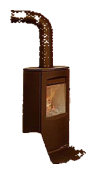

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 3.09 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.3503


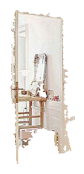

Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 1.00 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8808


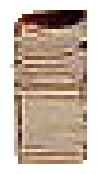

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 2.11 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.46 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7574


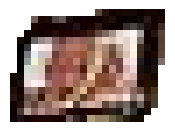

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 1.47 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.73 seconds
Participant data before center bias removal:  20
Participant data after center bias removal:  19
Processing image 4, participant 47
	Generating general scene description…


Scene description completed in 12.54 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a cozy and artistic ambiance. The room features a mix of contemporary and eclectic decor elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located, round with a white surface.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: Hanging above the dining table, spherical and reflective.
   - **Vase with Flowers**: Positioned on the dining table, containing pink flowers.
   - **Wood Stove**: Located on the left side of the image, with a visible chimney pipe.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large piece of artwork on the wall behind the dining table.
   - **Shelves with Books and Photos**: On the right wall, containing books and framed photos.
   - **Chalkboard Easel**: Positioned to the ri

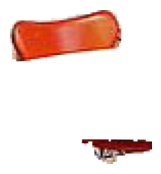

Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.66 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.6820


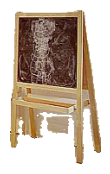

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 1.06 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 1.37 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 1.17 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.4342


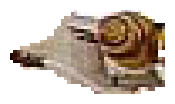

Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 1.36 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.38 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7431


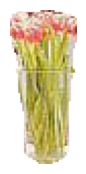

Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 1.26 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.46 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7256


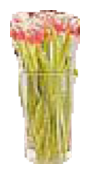

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 1.12 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.30 seconds
Mask labeling completed in 1.05 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9306


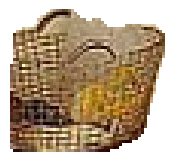

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 1.64 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6607


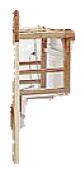

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 2.50 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 1.15 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6429


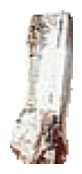

Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.6785


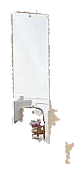

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 1.53 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.81 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8972


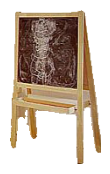

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.31 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.80 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7818


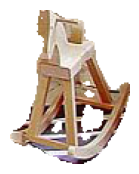

Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 1.14 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.64 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7259


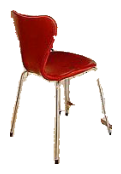

Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 1.12 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.9725


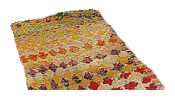

Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 1.11 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.69 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9512


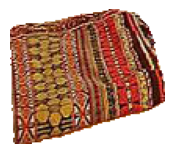

Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 1.10 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.64 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9240


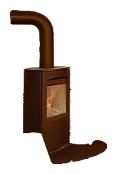

Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7675


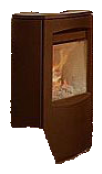

Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.39 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9584


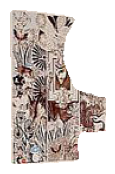

Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.57 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7744


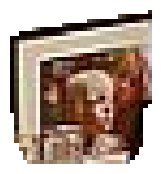

Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.36 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6880


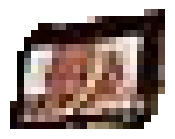

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.55 seconds
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Processing image 4, participant 48
	Generating general scene description…


Scene description completed in 12.03 seconds
1. **Scene Overview**: 
   - The image depicts a cozy and modern dining or living area with a blend of functional and decorative elements. The room is well-lit, suggesting a welcoming and comfortable atmosphere.

2. **Identified Objects**:
   - **Dining Table**: Centrally located, round with a light-colored surface.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: Hanging above the dining table, spherical in shape.
   - **Vase with Flowers**: Placed on the dining table.
   - **Wood Stove**: Located on the left side of the image.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Rug**: Colorful, positioned on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the dining table.
   - **Shelves with Books and Photos**: On the right wall, above a bench.
   - **Chalkboard**: Positioned to the right, near the shelves.
   - **Bench**: Below the shelves, with books

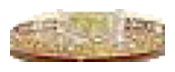

Mask labeling completed in 0.58 seconds
Mask labeling completed in 1.45 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.59 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8378


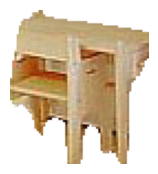

Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 1.24 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.49 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9260


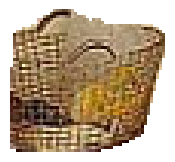

Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.46 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.5645


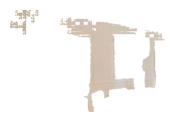

Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 1.16 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.2161


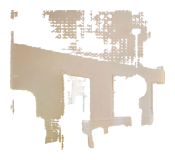

Mask labeling completed in 1.16 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 3.36 seconds
Mask labeling completed in 0.68 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8681


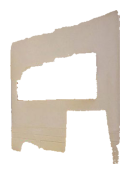

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 1.33 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7858


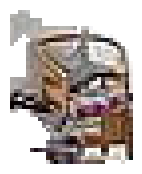

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.96 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 1.26 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9252


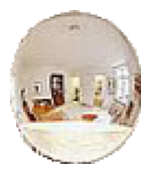

Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.31 seconds
Mask labeling completed in 0.44 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.6758


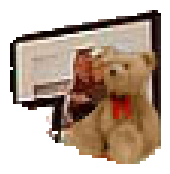

Mask labeling completed in 0.60 seconds
Mask labeling completed in 1.18 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 1.27 seconds
Mask labeling completed in 0.77 seconds
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Processing image 4, participant 52
	Generating general scene description…


Scene description completed in 13.62 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a cozy and artistic atmosphere. The room features a mix of contemporary and eclectic design elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located, round with a white surface.
   - **Chairs**: Six red chairs surrounding the table.
   - **Pendant Light**: Hanging above the table, spherical and reflective.
   - **Vase with Flowers**: Placed on the table, containing pink flowers.
   - **Wood Stove**: Located on the left side, with a visible chimney.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the table.
   - **Shelves**: On the right wall, holding books and framed photos.
   - **Chalkboard Easel**: Positioned to the right, with a small chair beside it.
   - **Windows**: On the far right, allowing n

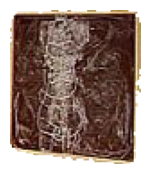

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.4447


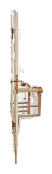

Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8366


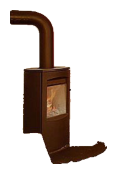

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 1.14 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.69 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.7013


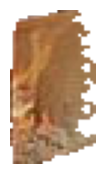

Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.59 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.5832


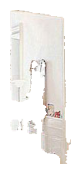

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.7974


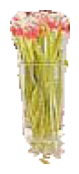

Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.67 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.4880


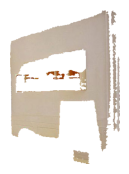

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 1.23 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 1.73 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 1.04 seconds
Mask labeling completed in 0.56 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7670


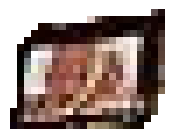

Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.96 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 1.28 seconds
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Processing image 4, participant 53
	Generating general scene description…


Scene description completed in 12.59 seconds
1. **Scene Overview**:
   - The image depicts a modern, well-lit dining or living area with a cozy and artistic ambiance. The room features a mix of functional and decorative elements, suggesting a space used for both dining and leisure activities.

2. **Identified Objects**:
   - **Dining Table**: Centrally located, round, with a light-colored surface.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: Hanging above the dining table, spherical and reflective.
   - **Vase with Flowers**: Positioned on the dining table, containing pink flowers.
   - **Wood Stove**: Located on the left side of the image, with a visible chimney.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the dining table.
   - **Shelving Unit**: On the right wall, holding books and framed photos.
   - **Chalkbo

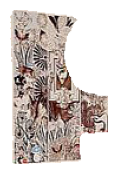

Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6606


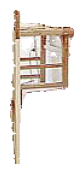

Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.41 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 1.47 seconds
Mask labeling completed in 1.54 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.71 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7941


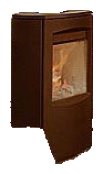

Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 1.04 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 2.02 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9265


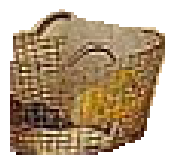

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 1.39 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 1.13 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.2504


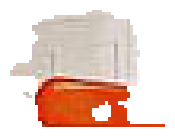

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 1.19 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.97 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7486


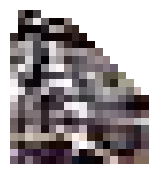

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.6218


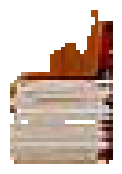

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6119


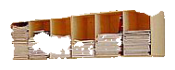

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 1.09 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.92 seconds
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Processing image 4, participant 54
	Generating general scene description…


Scene description completed in 10.90 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a cozy and artistic ambiance. The room features a mix of contemporary and eclectic design elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, surrounded by red chairs.
   - **Chairs**: Six red chairs positioned around the dining table.
   - **Pendant Light**: Hanging above the dining table, providing illumination.
   - **Vase with Flowers**: Placed on the dining table as a centerpiece.
   - **Wood Stove**: Located on the left side of the image, with a visible chimney.
   - **Basket**: Positioned near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork hanging on the wall behind the dining table.
   - **Shelves with Books and Photos**: Mounted on the right wall, holding books and framed pictures.
   - **Chalkboard Easel**

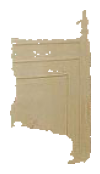

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9298


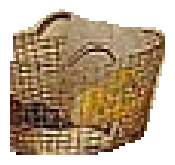

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 1.33 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8612


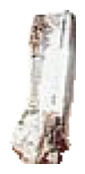

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.89 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9284


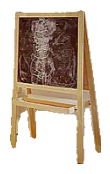

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 1.40 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 1.42 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.89 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.9044


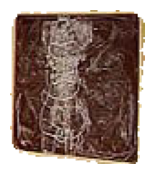

Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.78 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.6440


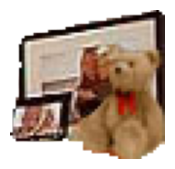

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.53 seconds
Participant data before center bias removal:  17
Participant data after center bias removal:  16
Processing image 4, participant 58
	Generating general scene description…


Scene description completed in 9.30 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a contemporary design. The room has a cozy and artistic atmosphere.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, featuring a vase with flowers on top.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: Hanging above the dining table.
   - **Wood Stove**: Located on the left side of the image, with a visible chimney.
   - **Basket**: Positioned near the wood stove, possibly containing firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the dining table.
   - **Shelves**: On the right wall, holding books and framed photos.
   - **Chalkboard**: Positioned on the right side, near the shelves.
   - **Small Chair**: Next to the chalkboard.
   - **Rocking Horse**: On the floor in the bottom right corner.
  

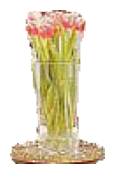

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.60 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8579


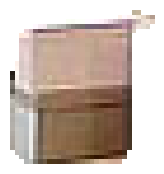

Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.29 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.82 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8192


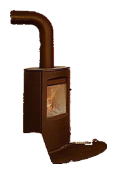

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.42 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8834


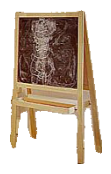

Mask labeling completed in 1.60 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 1.04 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.58 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7703


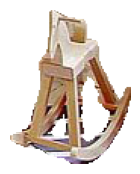

Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9544


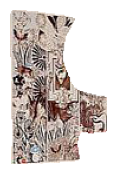

Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.3178


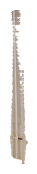

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 1.50 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 1.14 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7835


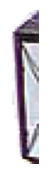

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.58 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.4180


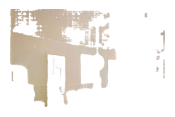

Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.33 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.88 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8642


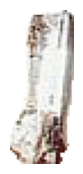

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.23 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.80 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6324


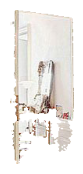

Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8501


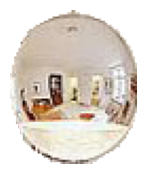

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.10 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.78 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9279


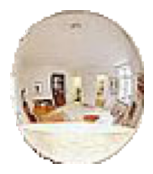

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.2251


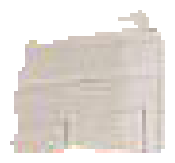

Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.40 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7282


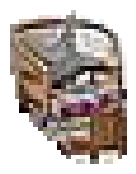

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.31 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.90 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7019


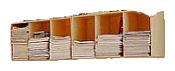

Mask labeling completed in 1.33 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.61 seconds
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Processing image 4, participant 59
	Generating general scene description…


Scene description completed in 10.42 seconds
1. **Scene Overview**:
   - The image depicts a modern, well-lit dining or living area with a cozy and artistic ambiance. The room features a mix of functional and decorative elements, suggesting a space used for both dining and leisure activities.

2. **Identified Objects**:
   - **Dining Table**: Centrally located, round, with a vase of flowers on top.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: Hanging above the dining table.
   - **Wood Stove**: Located on the left side of the image.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large piece of artwork on the wall behind the dining table.
   - **Shelving Unit**: On the right wall, holding books and framed photos.
   - **Chalkboard Easel**: Positioned to the right of the shelving unit.
   - **Small Chair**: Next to the chalkboard easel.
   - **Rocking

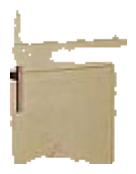

Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 1.15 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8885


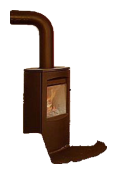

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6289


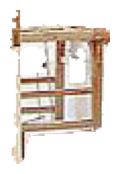

Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.45 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7658


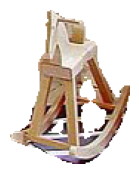

Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 1.12 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.46 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9312


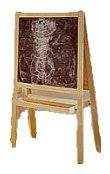

Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 2.85 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8111


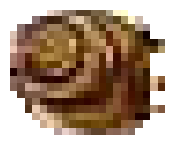

Mask labeling completed in 0.79 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 1.08 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.2351


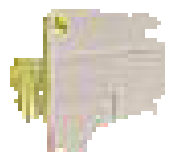

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.31 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.29 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9402


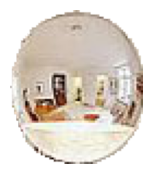

Mask labeling completed in 0.38 seconds
Mask labeling completed in 1.04 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9313


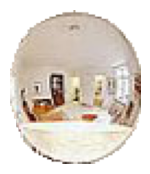

Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.40 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6989


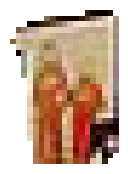

Mask labeling completed in 0.40 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8512


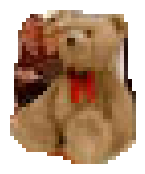

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.31 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 1.04 seconds
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Processing image 4, participant 60
	Generating general scene description…


Scene description completed in 13.65 seconds
1. **Scene Overview**: 
   - The image depicts a cozy, modern dining or living area with a blend of functional and decorative elements. The room is well-lit, suggesting a welcoming and comfortable atmosphere.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, surrounded by red chairs.
   - **Chairs**: Six red chairs positioned around the table.
   - **Pendant Light**: Hanging above the table, providing illumination.
   - **Vase with Flowers**: Placed on the dining table as a centerpiece.
   - **Wood Stove**: Located on the left side of the image, with a visible chimney.
   - **Basket**: Positioned near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the table.
   - **Shelves with Books and Photos**: Mounted on the right wall, holding books and framed pictures.
   - **Chalkboard Easel**: Positioned 

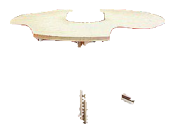

Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 1.14 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8967


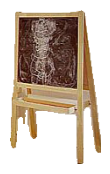

Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.5869


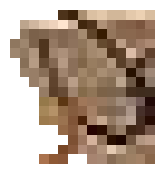

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.50 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6712


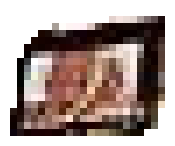

Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 1.08 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.3028


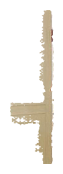

Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.58 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6457


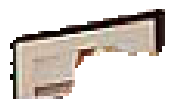

Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 1.15 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.77 seconds
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Processing image 4, participant 64
	Generating general scene description…


Scene description completed in 15.89 seconds
1. **Scene Overview**:
   - The image depicts a modern, well-lit dining or living area with a contemporary design. The room has a cozy and inviting atmosphere, featuring a mix of functional and decorative elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located, round with a white surface.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: Hanging above the dining table, spherical in shape.
   - **Vase with Flowers**: Placed on the dining table, containing pink flowers.
   - **Wood Stove**: Located on the left side of the image, with a visible chimney.
   - **Basket**: Positioned near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the dining table.
   - **Shelves with Books and Photos**: On the right wall, containing books and framed photos.
   - **Chalkboard Easel**: Positioned

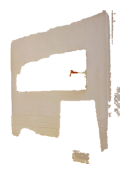

Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.09 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6457


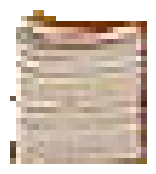

Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7719


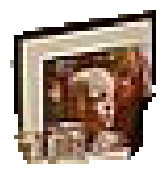

Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.59 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7870


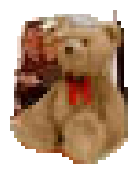

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.31 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 2.54 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.44 seconds
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Processing image 4, participant 69
	Generating general scene description…


Scene description completed in 15.10 seconds
1. **Scene Overview**:
   - The image depicts a modern, well-lit dining or living area with a cozy and artistic ambiance. The room features a mix of contemporary and eclectic decor elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, surrounded by red chairs.
   - **Chairs**: Six red chairs positioned around the table.
   - **Pendant Light**: A spherical light fixture hanging above the table.
   - **Vase with Flowers**: Placed on the dining table.
   - **Wood Stove**: Located on the left side of the image, with a visible chimney.
   - **Basket**: Positioned near the wood stove, possibly for firewood.
   - **Rug**: A colorful rug on the floor near the wood stove.
   - **Wall Art**: A large piece of artwork on the wall behind the table.
   - **Shelves with Books and Photos**: On the right wall, containing books and framed photographs.
   - **Chalkboard Easel**: Positioned to the right, near the she

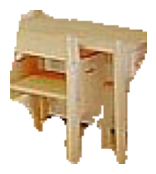

Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.37 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7722


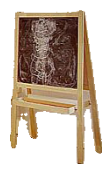

Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 1.33 seconds
Mask labeling completed in 1.50 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.43 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8327


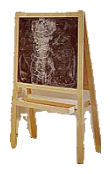

Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 1.08 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.2043


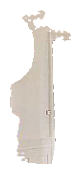

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.60 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9330


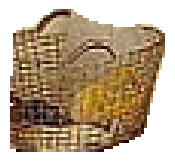

Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.30 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8143


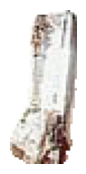

Mask labeling completed in 0.53 seconds
Mask labeling completed in 1.84 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 3.08 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9320


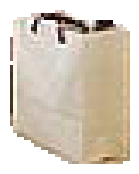

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.39 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.3059


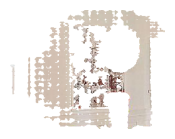

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 1.05 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.42 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9271


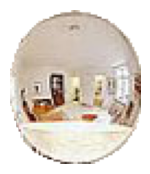

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.31 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9410


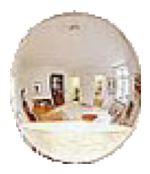

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.42 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.50 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.5982


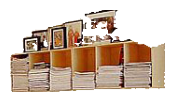

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 1.49 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.75 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.4778


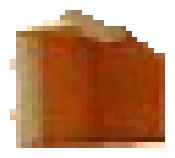

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.70 seconds
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Processing image 4, participant 73
	Generating general scene description…


Scene description completed in 13.29 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a cozy and artistic ambiance. The room features a mix of contemporary and eclectic decor elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, surrounded by red chairs.
   - **Chairs**: Six red chairs positioned around the dining table.
   - **Pendant Light**: Hanging above the dining table, spherical in shape.
   - **Vase with Flowers**: Placed on the dining table, containing pink flowers.
   - **Wood Stove**: Located on the left side of the image, with a visible chimney.
   - **Basket**: Positioned near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the dining table.
   - **Shelves with Books and Photos**: On the right wall, containing books and framed photos.
   - **Chalkboard Easel**: Positioned

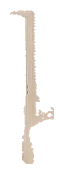

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 1.18 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 1.34 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.40 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8483


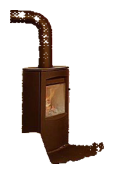

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 1.47 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9227


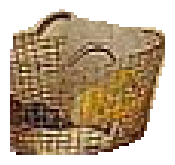

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.44 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.9027


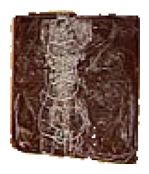

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.29 seconds
Mask labeling completed in 0.57 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7264


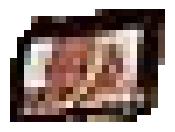

Mask labeling completed in 1.38 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 1.36 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.67 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7838


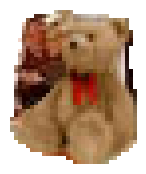

Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.06 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.82 seconds
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Processing image 4, participant 75
	Generating general scene description…


Scene description completed in 15.49 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a contemporary design. The room has a cozy and artistic atmosphere.

2. **Identified Objects**:
   - **Dining Table**: Centrally located, round with a white surface.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: A spherical, metallic light fixture hanging above the table.
   - **Vase with Flowers**: Positioned on the dining table.
   - **Wood Stove**: Located on the left side of the image.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the table.
   - **Shelves with Books and Photos**: On the right wall, above a bench.
   - **Chalkboard**: On the right side, near the shelves.
   - **Bench**: Below the shelves, with books or magazines stacked on it.
   - **Rocking Horse**: On the flo

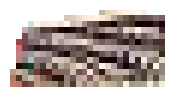

Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.23 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.93 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9043


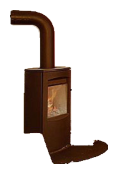

Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 1.40 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.46 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9290


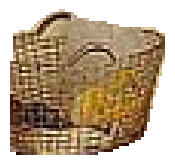

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 1.27 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8388


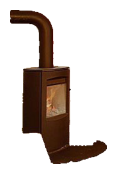

Mask labeling completed in 0.52 seconds
Mask labeling completed in 1.15 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 3.12 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.48 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8246


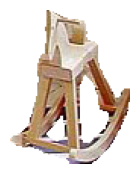

Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.33 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.2826


Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.5696


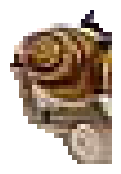

Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 1.09 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.49 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7725


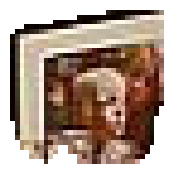

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.60 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8642


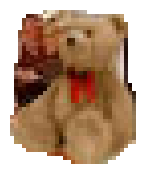

Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 1.14 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.64 seconds
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Processing image 4, participant 77
	Generating general scene description…


Scene description completed in 15.74 seconds
1. **Scene Overview**:
   - The image depicts a cozy and modern dining room or living area. The space is well-lit, with a combination of natural and artificial lighting, and features a blend of contemporary and eclectic decor.

2. **Identified Objects**:
   - **Dining Table**: Centrally located, round, with a light-colored surface.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: Hanging above the dining table, metallic and spherical.
   - **Vase with Flowers**: Placed on the dining table, containing pink flowers.
   - **Wood Stove**: Located on the left side, with a visible chimney pipe.
   - **Basket**: Near the wood stove, possibly for firewood or magazines.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large, abstract artwork on the wall behind the dining table.
   - **Shelving Unit**: On the right wall, holding books and framed photos.
   - **Chalkboard Easel**: 

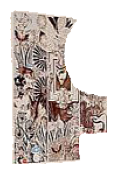

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9247


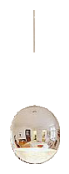

Mask labeling completed in 2.38 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8510


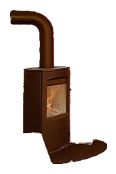

Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 1.40 seconds
Mask labeling completed in 0.71 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7361


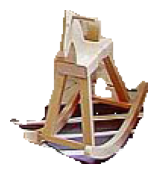

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8002


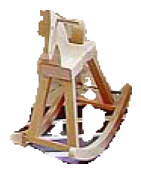

Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 1.12 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.43 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7259


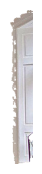

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.39 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.5503


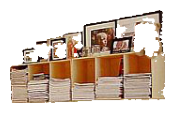

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 1.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8292


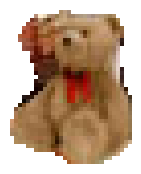

Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.43 seconds
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Processing image 4, participant 83
	Generating general scene description…


Scene description completed in 14.07 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a contemporary design. The room has a cozy and artistic atmosphere, featuring a mix of functional and decorative elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located, round with a white surface.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: Hanging above the dining table, spherical in shape.
   - **Vase with Flowers**: Placed on the dining table.
   - **Wood Stove**: Located on the left side of the image.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the dining table.
   - **Shelves with Books and Photos**: On the right wall, above a bench.
   - **Chalkboard**: Positioned on the right side, near the shelves.
   - **Bench**: Below the shelves, with books or

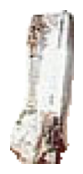

Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.83 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8679


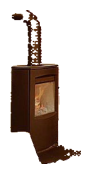

Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 1.06 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.69 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8421


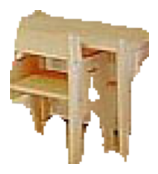

Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.31 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9214


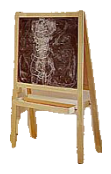

Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 1.33 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.47 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8643


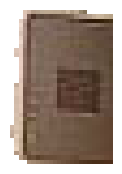

Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.58 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8750


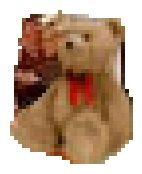

Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 3.16 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 1.64 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.52 seconds
Participant data before center bias removal:  14
Participant data after center bias removal:  13
Processing image 4, participant 85
	Generating general scene description…


Scene description completed in 11.24 seconds
1. **Scene Overview**:
   - The image depicts a modern, well-lit dining or living area with a cozy and artistic ambiance. The room features a mix of contemporary and eclectic design elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, featuring a vase with flowers on top.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: Hanging above the dining table, spherical in shape.
   - **Wood Stove**: Positioned to the left, with a visible chimney pipe.
   - **Basket**: Near the wood stove, possibly for firewood or magazines.
   - **Rug**: Colorful, located on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the table.
   - **Shelving Unit**: On the right wall, holding books and framed photos.
   - **Chalkboard Easel**: Positioned to the right, near the shelving unit.
   - **Small Chair**: Next to the chalkboard easel.
   - **Rocking Ho

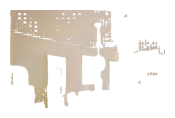

Mask labeling completed in 1.44 seconds
Mask labeling completed in 1.37 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.84 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8740


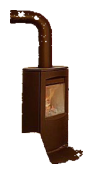

Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.74 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9468


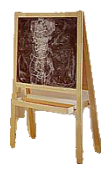

Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7601


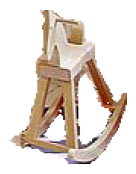

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.59 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.9054


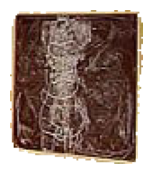

Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.7435


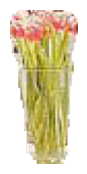

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.30 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.67 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9410


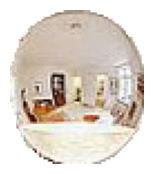

Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 4.69 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8565


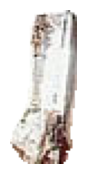

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 1.30 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9589


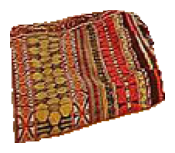

Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.57 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9299


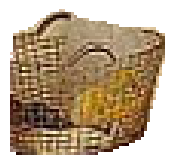

Mask labeling completed in 1.82 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6065


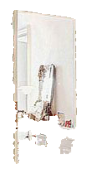

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 2.52 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.6334


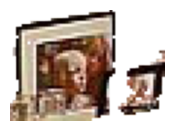

Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6453


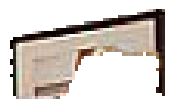

Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.72 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 4, participant 87
	Generating general scene description…


Scene description completed in 14.62 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining room with a cozy and artistic ambiance. The room features a mix of contemporary and eclectic design elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, featuring a vase with flowers on top.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: Hanging above the dining table, spherical in shape.
   - **Wood Stove**: Positioned on the left side of the image, with a visible chimney.
   - **Rug**: Colorful, located on the floor near the wood stove.
   - **Basket**: Near the wood stove, possibly for firewood or magazines.
   - **Wall Art**: Large artwork on the wall behind the dining table.
   - **Shelving Unit**: On the right wall, holding books and framed photos.
   - **Chalkboard Easel**: Positioned to the right of the shelving unit.
   - **Windows**: On the far right, allowing natural light in

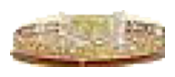

Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.85 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9073


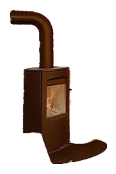

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.75 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8041


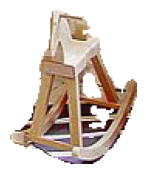

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 1.43 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 1.05 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.58 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9033


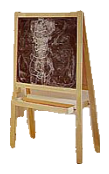

Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.36 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7579


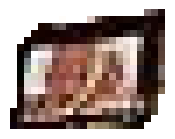

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 1.06 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.67 seconds
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Processing image 4, participant 89
	Generating general scene description…


Scene description completed in 12.99 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining room with a cozy and artistic ambiance. The room features a mix of contemporary and eclectic design elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located, round, with a light-colored surface.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: Hanging above the dining table, spherical and reflective.
   - **Vase with Flowers**: Placed on the dining table, containing pink flowers.
   - **Wood Stove**: Positioned on the left side of the image, with a visible chimney.
   - **Rug**: Colorful, located on the floor near the wood stove.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Wall Art**: Large, abstract artwork on the wall behind the dining table.
   - **Shelves with Books and Photos**: On the right wall, holding books and framed pictures.
   - **Chalkboard**: On an easel, located to the rig

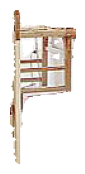

Mask labeling completed in 0.66 seconds
Mask labeling completed in 1.78 seconds
Mask labeling completed in 1.42 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.70 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6308


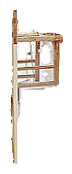

Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 1.29 seconds
Mask labeling completed in 0.57 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.7790


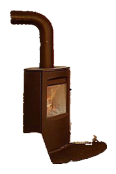

Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.59 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8820


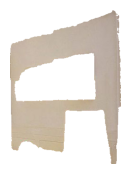

Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.96 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.86 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.6746


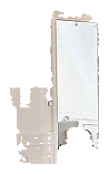

Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.76 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9029


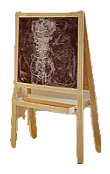

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.57 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.6676


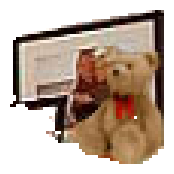

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.5461


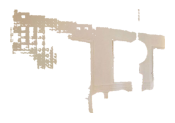

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 1.83 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 4, participant 93
	Generating general scene description…


Scene description completed in 11.43 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a contemporary design. The room has a cozy and artistic atmosphere, likely part of a home.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape.
   - **Chairs**: Six red chairs surrounding the dining table.
   - **Pendant Light**: Hanging above the dining table.
   - **Vase with Flowers**: Placed on the dining table.
   - **Wood Stove**: Located on the left side of the image.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the table.
   - **Shelves with Books and Photos**: On the right wall, above a bench.
   - **Chalkboard**: On an easel to the right of the shelves.
   - **Bench**: Below the shelves, with books or magazines stacked on it.
   - **Rocking Horse**: Partially visible on the 

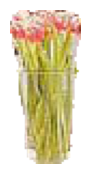

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7312


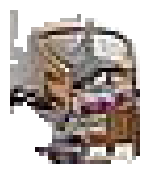

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8603


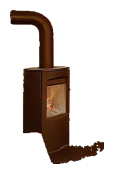

Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9381


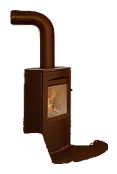

Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.95 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6404


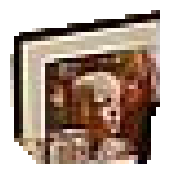

Mask labeling completed in 0.73 seconds
Mask labeling completed in 1.16 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.53 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 4, participant 95
	Generating general scene description…


Scene description completed in 15.88 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a cozy and artistic ambiance. The room features a mix of contemporary and eclectic design elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, surrounded by red chairs.
   - **Chairs**: Six red chairs positioned around the dining table.
   - **Pendant Light**: Hanging above the dining table, spherical in shape.
   - **Vase with Flowers**: Placed on the dining table, containing pink flowers.
   - **Wood Stove**: Located on the left side of the image, with a visible chimney.
   - **Basket**: Positioned near the wood stove, possibly for firewood.
   - **Rug**: Colorful, located on the floor near the wood stove.
   - **Wall Art**: Large artwork hanging on the wall behind the dining table.
   - **Shelving Unit**: On the right wall, holding books and framed photos.
   - **Chalkboard Easel**: Positioned to the r

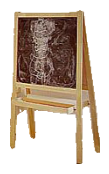

Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.34 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7875


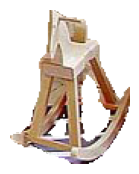

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 6.76 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.96 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.42 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7771


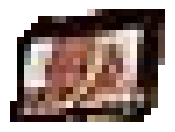

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.68 seconds
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Processing image 4, participant 97
	Generating general scene description…


Scene description completed in 15.59 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a contemporary design. The room has a cozy and artistic atmosphere, likely part of a home.

2. **Identified Objects**:
   - **Dining Table**: Centrally located, round with a light-colored surface.
   - **Chairs**: Six red chairs surrounding the table.
   - **Pendant Light**: Hanging above the table, spherical and reflective.
   - **Vase with Flowers**: On the table, containing pink flowers.
   - **Wood Stove**: On the left side, with a visible chimney pipe.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Rug**: Colorful, located on the floor near the wood stove.
   - **Wall Art**: Large piece on the wall behind the table.
   - **Shelves with Books and Photos**: On the right wall, above a bench.
   - **Chalkboard**: On the right side, near the shelves.
   - **Bench**: Below the shelves, with a few small items on it.
   - **Rocking 

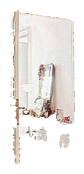

Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.47 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9187


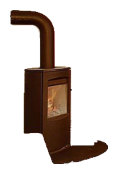

Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 1.29 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 1.01 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.1847


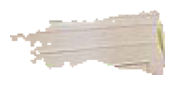

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.50 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8163


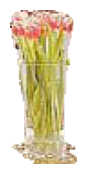

Mask labeling completed in 1.80 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.44 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9291


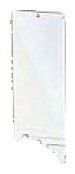

Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.9032


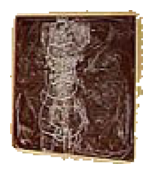

Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.67 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6902


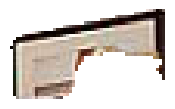

Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 2.45 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7976


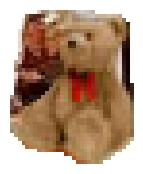

Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 2.78 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.74 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 4, participant 103
	Generating general scene description…


Scene description completed in 14.42 seconds
1. **Scene Overview**: 
   - The image depicts a modern, well-lit dining or living area with a cozy and artistic ambiance. The room features a mix of contemporary and eclectic decor elements.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, surrounded by red chairs.
   - **Chairs**: Six red chairs positioned around the dining table.
   - **Pendant Light**: Hanging above the dining table, spherical in shape.
   - **Vase with Flowers**: Placed on the dining table, containing pink flowers.
   - **Wood Stove**: Located on the left side of the image, with a visible chimney.
   - **Basket**: Positioned near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork hanging on the wall behind the dining table.
   - **Shelves with Books and Photos**: On the right wall, containing stacked books and framed photos.
   - **Chalkboard Eas

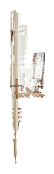

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 1.32 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.86 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9247


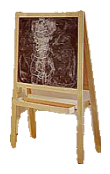

Mask labeling completed in 1.05 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.60 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.8820


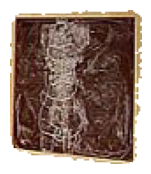

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.4456


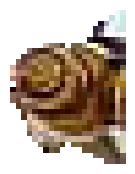

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 1.31 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.71 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9010


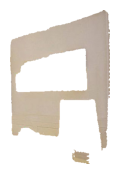

Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.59 seconds
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Processing image 4, participant 105
	Generating general scene description…


Scene description completed in 11.87 seconds
1. **Scene Overview**: 
   - The image depicts a cozy and modern dining or living area with a blend of functional and decorative elements. The room is well-lit, suggesting a welcoming and comfortable atmosphere.

2. **Identified Objects**:
   - **Dining Table**: Centrally located with a round shape, surrounded by red chairs.
   - **Chairs**: Six red chairs positioned around the dining table.
   - **Pendant Light**: Hanging above the dining table.
   - **Vase with Flowers**: Placed on the dining table.
   - **Wood Stove**: Located on the left side of the image.
   - **Basket**: Near the wood stove, possibly for firewood.
   - **Rug**: Colorful, placed on the floor near the wood stove.
   - **Wall Art**: Large artwork on the wall behind the dining table.
   - **Shelves with Books and Photos**: On the right wall, above a bench.
   - **Chalkboard**: Positioned to the right, near the shelves.
   - **Bench**: Below the shelves, with some items on 

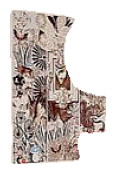

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.8540


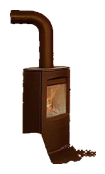

Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.57 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8070


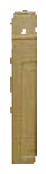

Mask labeling completed in 0.66 seconds
Mask labeling completed in 1.12 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 5.34 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.42 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7960


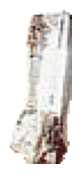

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.45 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9230


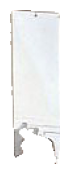

Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.44 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8792


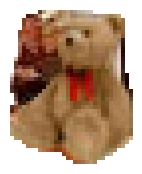

Mask labeling completed in 6.04 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 1.74 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.43 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8841


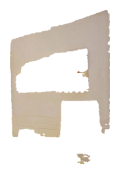

Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 1.10 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.84 seconds
Participant data before center bias removal:  40
Participant data after center bias removal:  39
Processing image 5, participant 5
	Generating general scene description…


Scene description completed in 14.53 seconds
1. **Scene Overview**:
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a visually striking contrast.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, matching the bedding pattern.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE."
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Red Lanterns**: Two, on the window sill.
   - **Posters**: Various, on the walls, including one of the Eiffel Tower.
   - **Red Table**: Left side, below the window.
   - **Candles**: On the red table.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Box**: On the black trunk.
   - **Lamp**: On a bedside table to the right of the bed.
   - **Round Red Stool**: In front of the bl

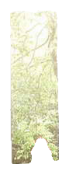

Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 3.95 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.91 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7495


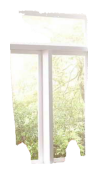

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.48 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9633


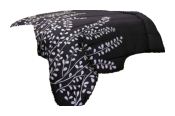

Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 1.95 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9559


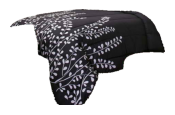

Mask labeling completed in 2.05 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 1.53 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9205


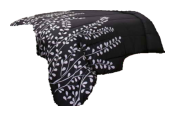

Mask labeling completed in 3.48 seconds
Mask labeling completed in 1.25 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9876


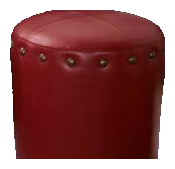

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 1.13 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6666


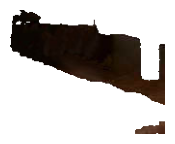

Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9850


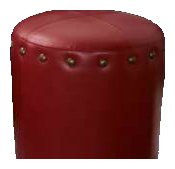

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 1.05 seconds
Mask labeling completed in 0.42 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9607


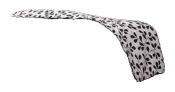

Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.46 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9639


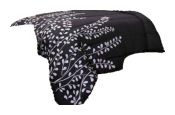

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.87 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9662


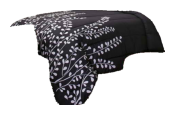

Mask labeling completed in 0.54 seconds
Mask labeling completed in 1.29 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.39 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9536


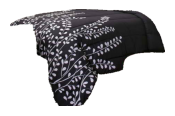

Mask labeling completed in 1.44 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 1.33 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.45 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9599


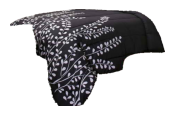

Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 1.08 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.65 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9026


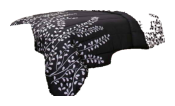

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 1.30 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9641


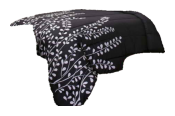

Mask labeling completed in 0.88 seconds
Mask labeling completed in 1.32 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9423


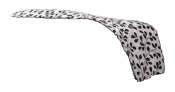

Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.30 seconds
Mask labeling completed in 0.42 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9352


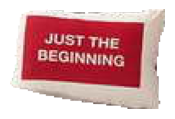

Mask labeling completed in 1.41 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.30 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.64 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9513


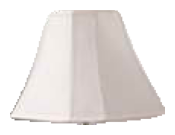

Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.35 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7333


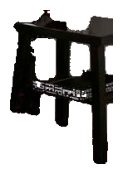

Mask labeling completed in 0.35 seconds
Mask labeling completed in 2.40 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 1.58 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.87 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.8191


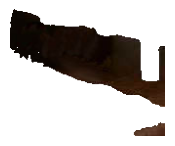

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 1.08 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.77 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9533


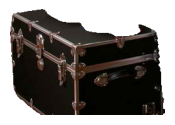

Mask labeling completed in 1.69 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 1.02 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.5347


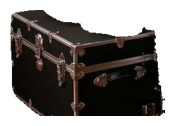

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.71 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.7019


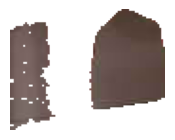

Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.30 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.57 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9384


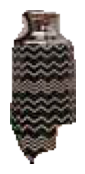

Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 1.23 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.14 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9213


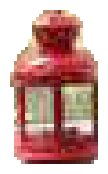

Mask labeling completed in 1.53 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.82 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9472


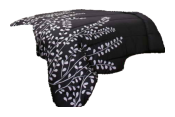

Mask labeling completed in 1.53 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9323


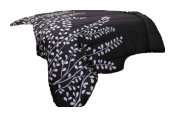

Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.75 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9861


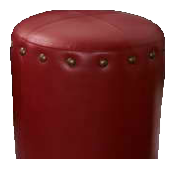

Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.48 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9260


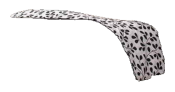

Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 1.17 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.70 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9354


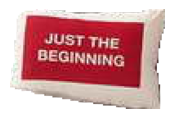

Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9384


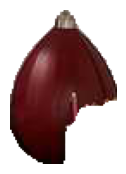

Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 1.09 seconds
Mask labeling completed in 0.95 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9375


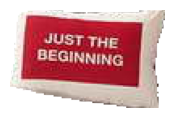

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 1.18 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.07 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7723


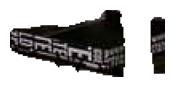

Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.5439


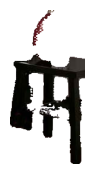

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9442


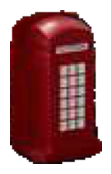

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.36 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9769


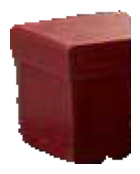

Mask labeling completed in 0.30 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.32 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9128


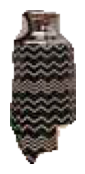

Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.58 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8089


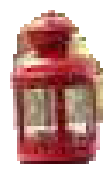

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.66 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9336


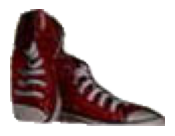

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 1.05 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Participant data before center bias removal:  13
Participant data after center bias removal:  12
Processing image 5, participant 6
	Generating general scene description…


Scene description completed in 14.72 seconds
1. **Scene Overview**: 
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a mix of black, white, and red colors, creating a bold and contemporary look.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, matching the bedding pattern.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE."
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one with the Eiffel Tower and another with city names.
   - **Red Table**: Left side, below the window.
   - **Candles**: On the red table.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Lanterns**: On the window sill.
   - **Lamp**: On the right side, on a small table next to the bed.
   - **Red Ottoman**: In front of the bed.
   - 

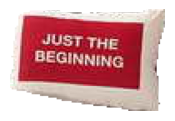

Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.50 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9387


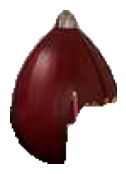

Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 1.08 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9843


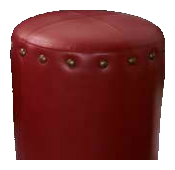

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.49 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8228


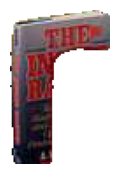

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.7785


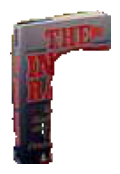

Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.42 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.2973


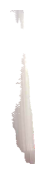

Mask labeling completed in 2.21 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8920


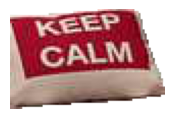

Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.45 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8853


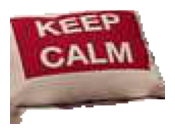

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.99 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.5995


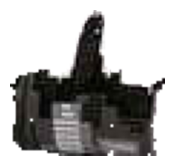

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.59 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9083


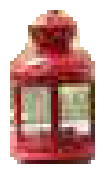

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.40 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9396


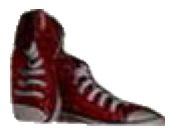

Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.40 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9403


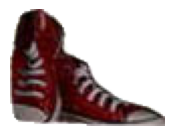

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 1.28 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.61 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 5, participant 11
	Generating general scene description…


Scene description completed in 11.03 seconds
1. **Scene Overview**: 
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a visually striking contrast.

2. **Identified Objects**:
   - **Bed**: Center-right, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring similar black and white patterns.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE."
   - **Window**: Left side, with white curtains.
   - **Posters**: Various posters on the walls, including one with the Eiffel Tower and another with city names.
   - **Table**: Left side, red, with various items on top.
   - **Candles**: On the red table.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Lanterns**: On the window sill.
   - **Red Shoe**: On the window sill.
   - **Lamp**: On the right side table.
   - **Red Ottoman**: In front of the bed.
   - **R

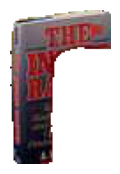

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 1.98 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.48 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6911


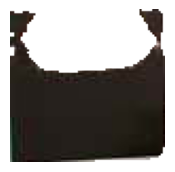

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.42 seconds
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Processing image 5, participant 12
	Generating general scene description…


Scene description completed in 11.93 seconds
1. **Scene Overview**: 
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a mix of black, white, and red colors, creating a bold and contemporary look.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring similar black and white patterns.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE".
   - **Nightstand**: To the right of the bed, holding a lamp and a small decorative item.
   - **Lamp**: On the nightstand, with a white shade.
   - **Window**: On the left side, with white curtains.
   - **Red Table**: Below the window, holding various items.
   - **Candles**: On the red table, to the left.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Ottoman**: In front of the trunk.
   - **Wall Posters**: Various posters on the walls, including one with the 

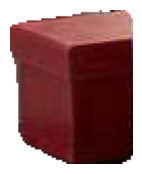

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.45 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6919


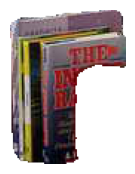

Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.47 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.3575


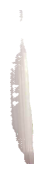

Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.5604


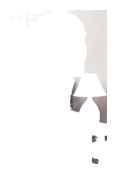

Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.50 seconds
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Processing image 5, participant 16
	Generating general scene description…


Scene description completed in 13.36 seconds
1. **Scene Overview**: 
   - The image depicts a stylish and well-decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a visually striking contrast.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, matching the bedding pattern.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE."
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Red Lanterns**: Two on the window sill.
   - **Posters**: Various posters on the walls, including one with the Eiffel Tower and another with city names.
   - **Table**: Left side, red with a "KEEP CALM" sign and candles.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Box**: On the trunk, next to the books.
   - **Lamp**: On the right side table, with a white shade.
   

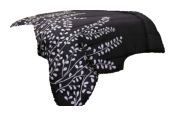

Mask labeling completed in 1.19 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9328


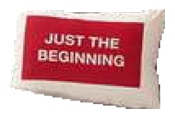

Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 1.94 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8228


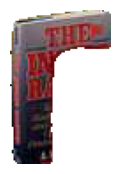

Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 1.30 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.73 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9846


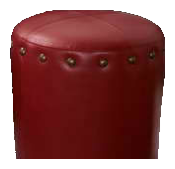

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9427


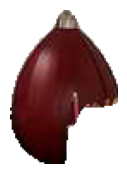

Mask labeling completed in 0.65 seconds
Mask labeling completed in 1.19 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9219


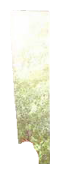

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.66 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9321


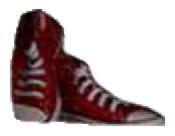

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 1.93 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.47 seconds
Participant data before center bias removal:  2
Participant data after center bias removal:  1
Processing image 5, participant 17
	Generating general scene description…


Scene description completed in 14.36 seconds
1. **Scene Overview**: 
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a mix of black, white, and red colors, creating a bold and contemporary look.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, matching the bedding pattern.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE."
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one with the Eiffel Tower and another with city names.
   - **Table**: Left side, red with decorative items.
   - **Candles**: On the red table.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Lanterns**: On the window sill.
   - **Lamp**: On the right side table.
   - **Red Ottoman**: In front of the bed.
   - **Rug**: White, fluffy,

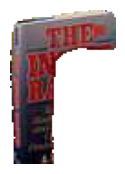

Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.74 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 5, participant 18
	Generating general scene description…


Scene description completed in 15.34 seconds
1. **Scene Overview**:
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a bed, decorative items, and wall art, creating a cozy and personalized space.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, matching the bedding pattern.
   - **Wall Art**: Above the bed, with the word "LOVE" in a decorative frame.
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Left wall, featuring the Eiffel Tower and New York-themed text.
   - **Red Table**: Below the window, holding decorative items.
   - **Candles**: On the red table.
   - **Red Lanterns**: On the window sill.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Box**: On the trunk, next to the books.
   - **Black Trunk**: At the foot of the bed, used as a table.
   - **Red Otto

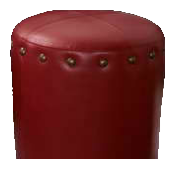

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.30 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9277


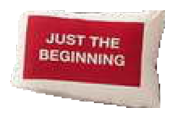

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.5691


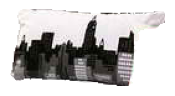

Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 1.05 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.34 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 5, participant 22
	Generating general scene description…


Scene description completed in 15.77 seconds
1. **Scene Overview**: 
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a bold and contemporary look.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring similar black and white patterns.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE."
   - **Nightstand**: To the right of the bed, holding a lamp and a small decorative item.
   - **Lamp**: On the nightstand, with a white shade.
   - **Window**: To the left, with white curtains.
   - **Red Table**: Below the window, holding various items.
   - **Candles**: On the red table, to the left.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Ottoman**: In front of the trunk.
   - **Wall Posters**: Various posters on the walls, including one with t

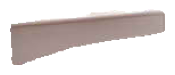

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.65 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9367


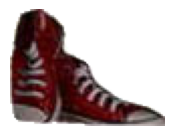

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.37 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.5868


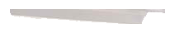

Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.49 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 5, participant 23
	Generating general scene description…


Scene description completed in 15.78 seconds
1. **Scene Overview**:
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a bold and contemporary look.

2. **Identified Objects**:
   - **Bed**: Center-right, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring a similar black and white pattern.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE" in black.
   - **Nightstand**: To the right of the bed, holding a lamp and a small decorative item.
   - **Lamp**: On the nightstand, with a white shade.
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Red Lanterns**: Two on the window sill.
   - **Posters/Wall Art**: Various, including an Eiffel Tower poster and a New York-themed sign.
   - **Red Table**: Below the window, holding candles and a "KEEP CALM" sign.
   - **Candles**: On the

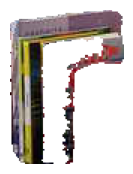

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.70 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9337


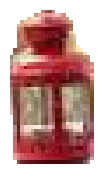

Mask labeling completed in 1.09 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.9311


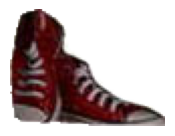

Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.71 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 5, participant 24
	Generating general scene description…


Scene description completed in 20.31 seconds
1. **Scene Overview**:
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a visually striking contrast.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring similar black and white patterns.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE" in black.
   - **Window**: Left side of the image, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Red Lanterns**: Two on the window sill.
   - **Posters**: Various posters on the walls, including one with the Eiffel Tower and another with city names.
   - **Side Table**: Right side of the bed, with a lamp and a small decorative item.
   - **Lamp**: On the side table, with a white shade.
   - **Red Ottoman**: In front of the bed.
   - **Trunk**: At the foot o

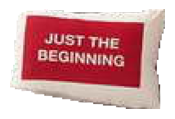

Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 1.94 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.73 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9458


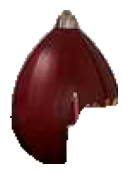

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 1.27 seconds
Mask labeling completed in 0.94 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 5, participant 40
	Generating general scene description…


Scene description completed in 13.55 seconds
1. **Scene Overview**:
   - The image depicts a stylishly decorated bedroom with a modern and cozy atmosphere. The room features a mix of decorative elements and functional furniture, creating a personalized and inviting space.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring similar black and white patterns.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE" in the center.
   - **Window**: Left side of the image, with white curtains.
   - **Red Shoe**: On the windowsill.
   - **Red Lanterns**: Two, on the windowsill.
   - **Posters**: Various posters on the walls, including one with the Eiffel Tower and another with city names.
   - **Side Table**: Right side of the bed, with a lamp and a small decorative item.
   - **Lamp**: On the side table, with a white shade.
   - **Red Ottoman**: In front of the bed.
   - **Trun

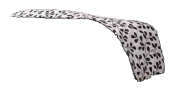

Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 1.24 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.78 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.6818


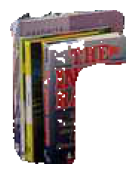

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8201


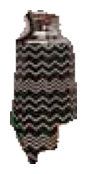

Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 1.63 seconds
Mask labeling completed in 0.48 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.5848


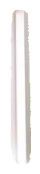

Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 1.33 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 1.13 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.5464


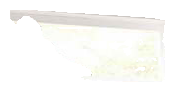

Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.43 seconds
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Processing image 5, participant 41
	Generating general scene description…


Scene description completed in 15.30 seconds
1. **Scene Overview**: 
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a visually striking contrast.

2. **Identified Objects**:
   - **Bed**: Center-right, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring black and white designs.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE."
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the windowsill.
   - **Red Lanterns**: Two, on the windowsill.
   - **Posters**: Various, on the walls, including one with the Eiffel Tower and another with city names.
   - **Table**: Left side, red, with various items.
   - **Candles**: On the red table.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Box**: On the trunk, possibly a storage box.
   - **Lamp**: On the right side table, with a white sh

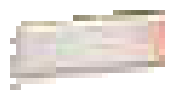

Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8482


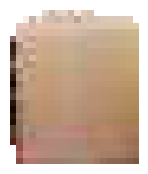

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.47 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8113


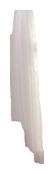

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.5646


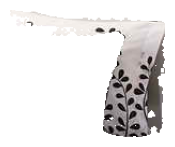

Mask labeling completed in 1.18 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 1.26 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.84 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 5, participant 42
	Generating general scene description…


Scene description completed in 11.62 seconds
1. **Scene Overview**: 
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a mix of decorative elements and functional furniture, creating a cozy and personalized space.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring similar black and white patterns.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE."
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one with the Eiffel Tower and another with city names.
   - **Red Table**: Left side, below the window.
   - **Candles**: On the red table.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Lanterns**: On the window sill.
   - **Lamp**: On the right side table, with a white shade.
   - **Red Ottoman**: In 

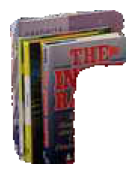

Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.49 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7169


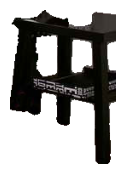

Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 1.64 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.6957


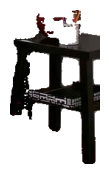

Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 2.01 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 1.01 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.5303


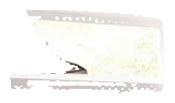

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.60 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9368


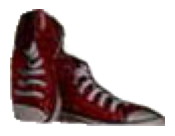

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.54 seconds
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Processing image 5, participant 46
	Generating general scene description…


Scene description completed in 12.87 seconds
1. **Scene Overview**:
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a mix of decorative elements and functional furniture, creating a cozy and personalized space.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, matching the bedding pattern.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE."
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one of the Eiffel Tower and another with city names.
   - **Red Table**: Left side, below the window.
   - **Candles**: On the red table.
   - **Red Lanterns**: Two on the window sill.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Box**: On the trunk, next to the books.
   - **Lamp**: On the right side, on a small ta

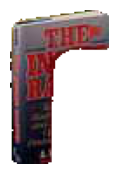

Mask labeling completed in 1.48 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8497


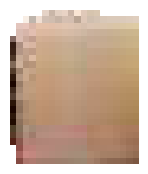

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 1.34 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 5.63 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.37 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.6603


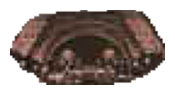

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 1.09 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9243


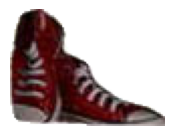

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.43 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 5, participant 47
	Generating general scene description…


Scene description completed in 12.44 seconds
1. **Scene Overview**: 
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a bold and contemporary look.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring similar black and white patterns.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE" in black.
   - **Window**: Left side of the image, with white curtains.
   - **Red Shoe**: On the windowsill.
   - **Posters**: Various posters on the walls, including one of the Eiffel Tower and another with city names.
   - **Red Table**: Left side, below the window.
   - **Candles**: On the red table.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Lanterns**: On the windowsill.
   - **Lamp**: On the right side, on a small table next to the bed.
   - **R

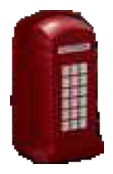

Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 1.23 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.37 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9357


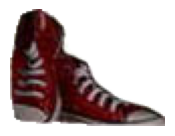

Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 1.10 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.81 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 5, participant 48
	Generating general scene description…


Scene description completed in 13.91 seconds
1. **Scene Overview**:
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a visually striking contrast.

2. **Identified Objects**:
   - **Bed**: Center-right, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring similar black and white patterns.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE."
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one with the Eiffel Tower and another with city names.
   - **Red Table**: Below the window, holding decorative items.
   - **Candles**: On the red table.
   - **Red Lanterns**: On the window sill.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Box**: On the trunk.
   - **Lamp**: On a small table to the right of the bed

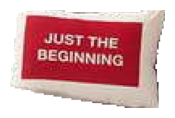

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9824


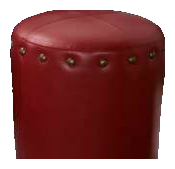

Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7202


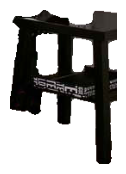

Mask labeling completed in 0.64 seconds
Mask labeling completed in 1.16 seconds
Mask labeling completed in 1.65 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.59 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.5480


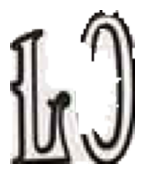

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.31 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.30 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9512


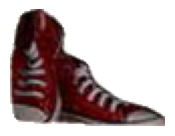

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.54 seconds
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Processing image 5, participant 52
	Generating general scene description…


Scene description completed in 14.42 seconds
1. **Scene Overview**: 
   - The image depicts a stylishly decorated bedroom with a modern and cozy aesthetic. The room features a mix of decorative elements and functional furniture, creating a personalized and inviting space.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, with matching black and white patterns.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE."
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one with the Eiffel Tower.
   - **Red Table**: Left side, below the window.
   - **Candles**: On the red table.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Lanterns**: On the window sill.
   - **Lamp**: On the right side, on a small table next to the bed.
   - **Red Ottoman**: In front of the bed.
  

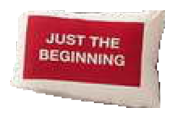

Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.80 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9454


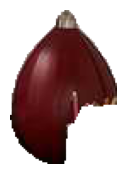

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 1.44 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.4478


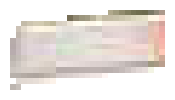

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8183


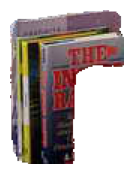

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.4564


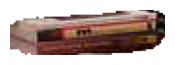

Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.5828


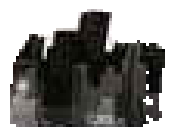

Mask labeling completed in 1.09 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.47 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6396


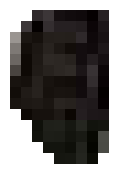

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.49 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9008


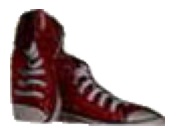

Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 1.44 seconds
Mask labeling completed in 1.23 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 3.85 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.72 seconds
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Processing image 5, participant 53
	Generating general scene description…


Scene description completed in 16.24 seconds
1. **Scene Overview**: 
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a visually striking contrast.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring a similar black and white pattern.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE" in black.
   - **Window**: Left side of the image, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one of the Eiffel Tower and another with city names.
   - **Red Table**: Left side, below the window.
   - **Candles**: On the red table.
   - **Red Lanterns**: Two on the window sill.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Box**: On the trunk, next to the books.
   - **Lamp**: On 

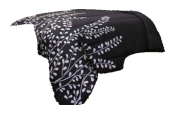

Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.75 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8755


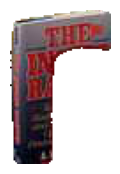

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.48 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9345


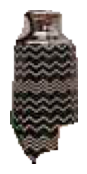

Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.89 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7374


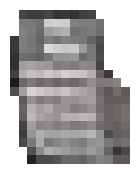

Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.18 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.66 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.6168


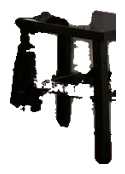

Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 1.17 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.75 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9860


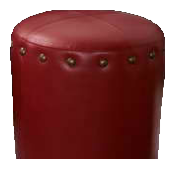

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.57 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9271


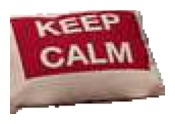

Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.58 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.6535


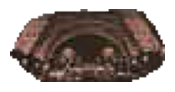

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.64 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9193


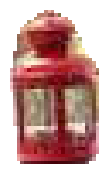

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.47 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9363


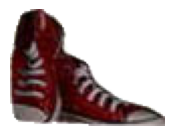

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.59 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9432


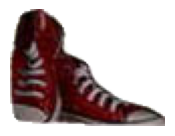

Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.03 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 5, participant 54
	Generating general scene description…


Scene description completed in 15.41 seconds
1. **Scene Overview**:
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a mix of black, white, and red colors, creating a bold and contemporary look.

2. **Identified Objects**:
   - **Bed**: Center-right, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring similar black and white patterns.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE" in black.
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one of the Eiffel Tower and another with city names.
   - **Red Table**: Below the window, holding decorative items.
   - **Candles**: On the red table.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Lanterns**: On the window sill.
   - **Lamp**: On a small table to the right of the bed.
   - **Red Ottoman**: In front 

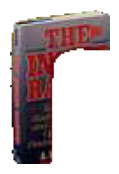

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.58 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9371


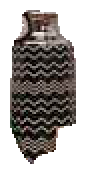

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 1.33 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 2.75 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.72 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 5, participant 58
	Generating general scene description…


Scene description completed in 14.51 seconds
1. **Scene Overview**:
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a visually striking contrast.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring similar black and white patterns.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE" in black.
   - **Window**: Left side of the image, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one with the Eiffel Tower and another with city names.
   - **Red Table**: Below the window, holding several items.
   - **Candles**: On the red table, to the left.
   - **Red Lanterns**: Two on the window sill.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Box**: On the black trunk.
   - *

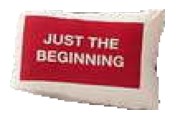

Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.34 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.6280


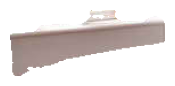

Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 1.74 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.31 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 5, participant 59
	Generating general scene description…


Scene description completed in 15.09 seconds
1. **Scene Overview**:
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a bold and contemporary look.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring similar black and white patterns.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE."
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one of the Eiffel Tower.
   - **Red Table**: Left side, under the window.
   - **Candles**: On the red table.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Lanterns**: On the window sill.
   - **Lamp**: On the right side, on a small table next to the bed.
   - **Red Ottoman**: In front of the bed.
   - **Rug**: 

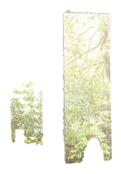

Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.7767


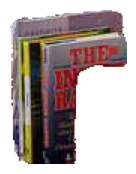

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 1.15 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 1.09 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.92 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9457


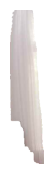

Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.13 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8663


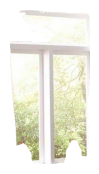

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9373


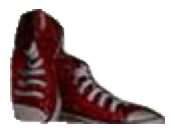

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.90 seconds
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Processing image 5, participant 60
	Generating general scene description…


Scene description completed in 14.42 seconds
1. **Scene Overview**: 
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a visually striking contrast.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring a similar black and white pattern.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE" in black.
   - **Window**: Left side of the image, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one of the Eiffel Tower and another with city names.
   - **Red Table**: Left side, below the window, holding decorative items.
   - **Candles**: On the red table.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Lanterns**: On the window sill.
   - **Black Trunk**: At the foot of the bed, u

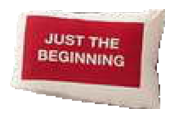

Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.33 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.82 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9350


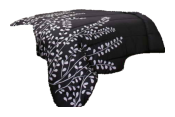

Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9336


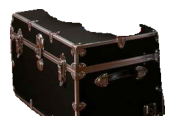

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 1.02 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9579


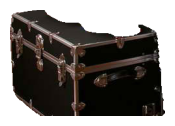

Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9442


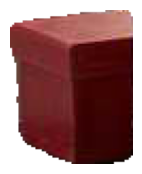

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.34 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.6069


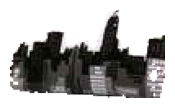

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 2.52 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8805


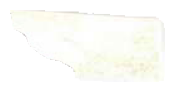

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.74 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 5, participant 64
	Generating general scene description…


Scene description completed in 11.53 seconds
1. **Scene Overview**:
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a visually striking contrast.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, with matching black and white patterns.
   - **Wall Art**: Above the bed, featuring the word "LOVE" in an ornate design.
   - **Window**: Left side of the image, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one with the Eiffel Tower and another with city names.
   - **Red Table**: Below the window, holding decorative items.
   - **Candles**: On the red table.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Lanterns**: On the window sill.
   - **Lamp**: On the right side of the bed, on a small table.
  

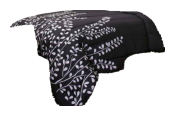

Mask labeling completed in 0.79 seconds
Mask labeling completed in 1.52 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 6.34 seconds
Mask labeling completed in 0.84 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.6014


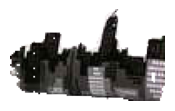

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 1.20 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.6120


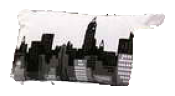

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 1.15 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.68 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9200


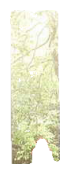

Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.27 seconds
Mask labeling completed in 1.21 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.69 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9458


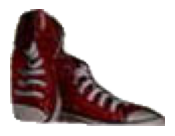

Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.49 seconds
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Processing image 5, participant 69
	Generating general scene description…


Scene description completed in 14.85 seconds
1. **Scene Overview**:
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a visually striking contrast.

2. **Identified Objects**:
   - **Bed**: Center-right, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring similar black and white patterns.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE" in black.
   - **Window**: Left side, with white curtains partially open.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one with the Eiffel Tower and another with text.
   - **Red Table**: Left side, below the window.
   - **Candles**: On the red table.
   - **Red Lanterns**: Two on the window sill.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Box**: On the black trunk.
   - **Lamp**: On the right side table, wi

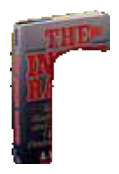

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.44 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.64 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8069


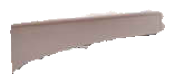

Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 1.38 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 1.16 seconds
Mask labeling completed in 1.05 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.50 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9304


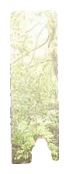

Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9059


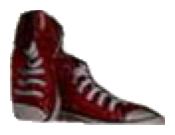

Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 1.22 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.74 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 5, participant 73
	Generating general scene description…


Scene description completed in 9.56 seconds
1. **Scene Overview**: 
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a visually striking contrast.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring similar black and white patterns.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE."
   - **Window**: Left side, with white curtains.
   - **Posters**: On the wall to the left of the window, including one with the Eiffel Tower.
   - **Red Table**: Below the window, holding various items.
   - **Candles**: On the red table.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Shoe**: On the window sill.
   - **Red Lanterns**: On the window sill.
   - **Lamp**: On a small table to the right of the bed.
   - **Red Ottoman**: In front of the bed.
  

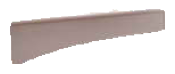

Mask labeling completed in 0.84 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.48 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8519


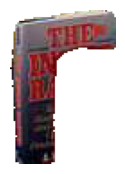

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.6968


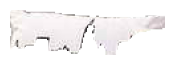

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.70 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9466


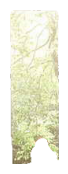

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.9309


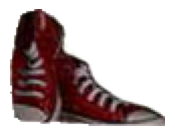

Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.71 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 5, participant 75
	Generating general scene description…


Scene description completed in 16.20 seconds
1. **Scene Overview**: 
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a mix of black, white, and red colors, creating a bold and visually appealing atmosphere.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring similar black and white patterns.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE" in black.
   - **Window**: Left side of the image, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Red Lanterns**: Two on the window sill.
   - **Posters**: On the wall to the left of the window, featuring cityscapes and text.
   - **Red Table**: Below the window, holding various items.
   - **Candles**: On the red table.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Box**: On the black trunk.
   - **Lamp**: On a small table to the 

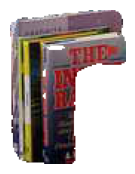

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 1.73 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.85 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8617


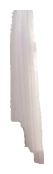

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.65 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8403


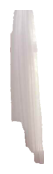

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.41 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 5, participant 83
	Generating general scene description…


Scene description completed in 15.57 seconds
1. **Scene Overview**:
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a bold and contemporary look.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, matching the bedding pattern.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE."
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one with the Eiffel Tower and another with city names.
   - **Red Table**: Left side, beneath the window.
   - **Candles**: On the red table.
   - **Red Lanterns**: Two on the window sill.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Box**: On the trunk, next to the books.
   - **Black Trunk**: At the foot of the bed, used a

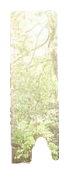

Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.98 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8403


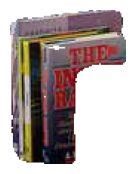

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.41 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 5, participant 85
	Generating general scene description…


Scene description completed in 15.18 seconds
1. **Scene Overview**:
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a visually striking contrast.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring similar black and white patterns.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE" in black.
   - **Window**: Left side, with white curtains and a view of greenery outside.
   - **Red Shoe**: On the window sill.
   - **Red Lanterns**: Two, on the window sill.
   - **Posters**: Various, on the walls, including one of the Eiffel Tower and another with city names.
   - **Table**: Left side, red, with a "KEEP CALM" sign, candles, and a vase.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Box**: On the trunk, next to the books.
   - **Lamp**: 

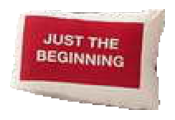

Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.32 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.9176


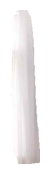

Mask labeling completed in 1.14 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 1.22 seconds
Participant data before center bias removal:  24
Participant data after center bias removal:  23
Processing image 5, participant 87
	Generating general scene description…


Scene description completed in 13.90 seconds
1. **Scene Overview**: 
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a bold and contemporary look.

2. **Identified Objects**:
   - **Bed**: Center-right, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring a cityscape design and a red pillow with text.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE."
   - **Nightstand**: To the right of the bed, with a lamp and a small decorative item.
   - **Lamp**: On the nightstand, with a white shade.
   - **Window**: Left side, with white curtains.
   - **Red Table**: Below the window, holding various items.
   - **Candles**: On the red table, to the left.
   - **Decorative Bottles**: On the red table, near the window.
   - **Wall Posters**: Various posters on the walls, including one with the Eiffel Tower.
   - **Trunk**: At t

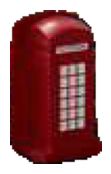

Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 1.49 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 2.53 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8800


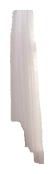

Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.50 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8597


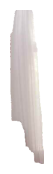

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.60 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9178


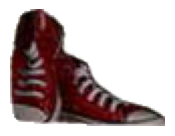

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 1.25 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9058


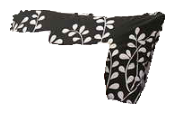

Mask labeling completed in 0.62 seconds
Mask labeling completed in 1.36 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.58 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.6640


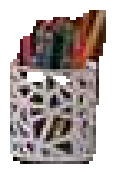

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 1.35 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 1.06 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7491


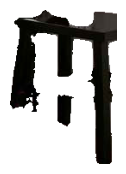

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 1.09 seconds
Mask labeling completed in 1.62 seconds
Mask labeling completed in 0.43 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9422


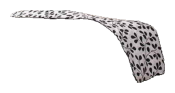

Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 1.22 seconds
Mask labeling completed in 1.38 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 3.48 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9382


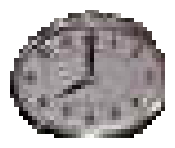

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9289


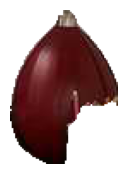

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.50 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9390


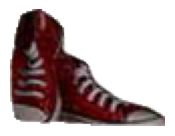

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.82 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9310


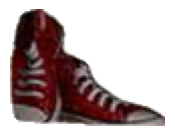

Mask labeling completed in 1.22 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 1.15 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9322


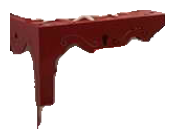

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.65 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8160


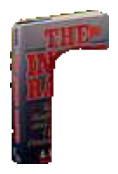

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.6988


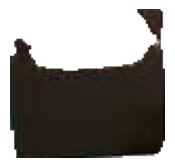

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7187


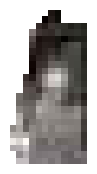

Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.67 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.5165


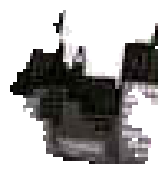

Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 2.31 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6102


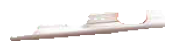

Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.35 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8572


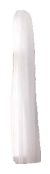

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 1.16 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9170


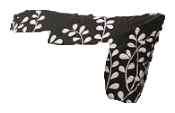

Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 1.22 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9391


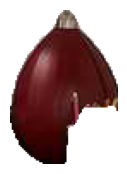

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 1.48 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.67 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.8167


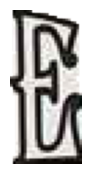

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.3570


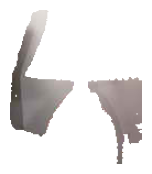

Mask labeling completed in 1.08 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 1.10 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 1.17 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.61 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 5, participant 89
	Generating general scene description…


Scene description completed in 15.48 seconds
1. **Scene Overview**:
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a bold and contemporary look.

2. **Identified Objects**:
   - **Bed**: Center-right, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring a similar black and white pattern.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE" in black.
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one of the Eiffel Tower and another with city names.
   - **Red Table**: Below the window, holding decorative items.
   - **Candles**: On the red table.
   - **Red Lanterns**: Two on the window sill.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Box**: On the trunk, next to the books.
   - **Lamp**: On the ri

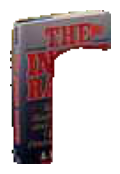

Mask labeling completed in 1.07 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.49 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6735


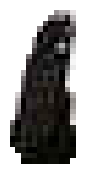

Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9382


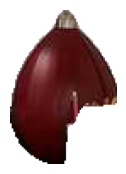

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.39 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9117


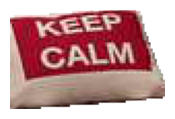

Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.71 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7647


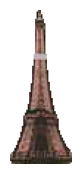

Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 1.32 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.58 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 5, participant 93
	Generating general scene description…


Scene description completed in 21.82 seconds
1. **Scene Overview**:
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a mix of black, white, and red colors, creating a bold and contemporary look.

2. **Identified Objects**:
   - **Bed**: Center-right, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring a similar black and white pattern.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE."
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Red Lanterns**: Two, on the window sill.
   - **Posters**: Various, on the walls, including one with the Eiffel Tower and another with city names.
   - **Table**: Left side, red, with various items.
   - **Candles**: On the red table.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Box**: On the black trunk.
   - **Lamp**: On the right side table, with a white shade.
   - **Red

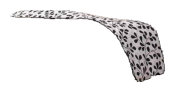

Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 1.22 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9442


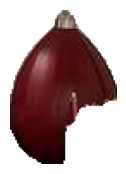

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 2.46 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9603


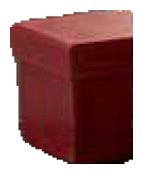

Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.59 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.5082


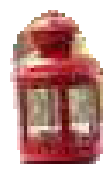

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 1.14 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.60 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.6874


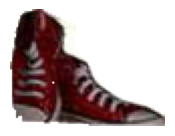

Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.59 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 5, participant 95
	Generating general scene description…


Scene description completed in 13.90 seconds
1. **Scene Overview**: 
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a mix of decorative elements and functional furniture, creating a cozy and personalized space.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, matching the bedding pattern.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE".
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one with the Eiffel Tower and another with city names.
   - **Red Table**: Left side, below the window.
   - **Candles**: On the red table.
   - **Red Lanterns**: Two on the window sill.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Box**: On the black trunk.
   - **Lamp**: On the right side table, with a white shad

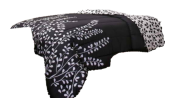

Mask labeling completed in 0.77 seconds
Mask labeling completed in 1.10 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.36 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.57 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.5693


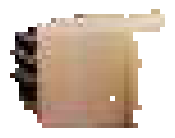

Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.43 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9404


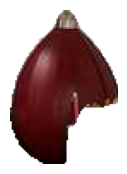

Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.40 seconds
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Processing image 5, participant 101
	Generating general scene description…


Scene description completed in 17.40 seconds
1. **Scene Overview**:
   - The image depicts a stylishly decorated bedroom with a modern and cozy aesthetic. The room features a mix of decorative elements and functional furniture, creating a personalized and inviting space.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, matching the bedding pattern.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE."
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one of the Eiffel Tower.
   - **Red Table**: Left side, below the window.
   - **Candles**: On the red table.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Lanterns**: On the window sill.
   - **Lamp**: On a bedside table to the right of the bed.
   - **Red Ottoman**: In front of the bed.
   - **Rug**: White, flu

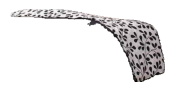

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 1.19 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.3823


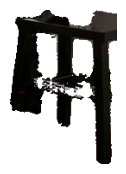

Mask labeling completed in 0.80 seconds
Mask labeling completed in 1.62 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.49 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.6750


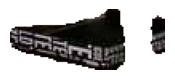

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.65 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.7882


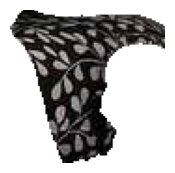

Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 1.06 seconds
Mask labeling completed in 0.38 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7978


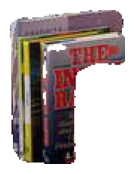

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9012


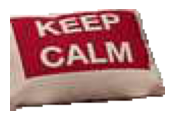

Mask labeling completed in 1.29 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8852


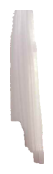

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 3.26 seconds
Mask labeling completed in 1.26 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.66 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9306


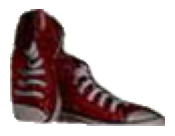

Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.66 seconds
Participant data before center bias removal:  21
Participant data after center bias removal:  20
Processing image 5, participant 103
	Generating general scene description…


Scene description completed in 13.06 seconds
1. **Scene Overview**: 
   - The image depicts a stylishly decorated bedroom with a modern and cozy aesthetic. The room features a mix of decorative elements and functional furniture, creating a personalized and inviting space.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, matching the bedding pattern.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE."
   - **Window**: Left side, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one of the Eiffel Tower.
   - **Red Table**: Left side, below the window.
   - **Candles**: On the red table.
   - **Red Lanterns**: Two on the window sill.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Box**: On the black trunk.
   - **Black Trunk**: At the foot of the bed, used as a table.
   - **Red Ottoman**

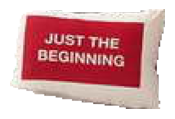

Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 1.44 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9637


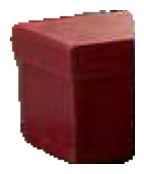

Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8902


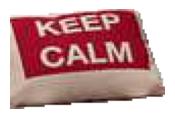

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 1.19 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.7812


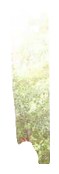

Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8695


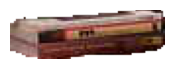

Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.77 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8210


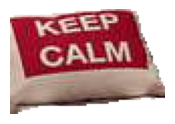

Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 1.23 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8720


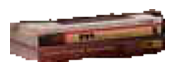

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 1.38 seconds
Mask labeling completed in 1.47 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9370


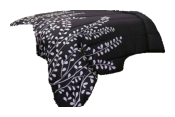

Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 1.29 seconds
Mask labeling completed in 1.11 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.91 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9792


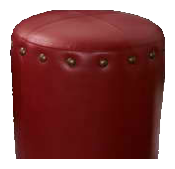

Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 1.06 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7353


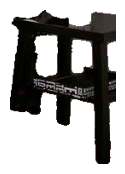

Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8786


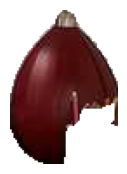

Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 1.28 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9370


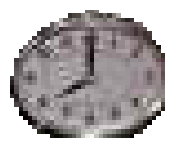

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 1.11 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.80 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.6917


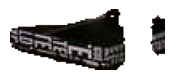

Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.58 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9405


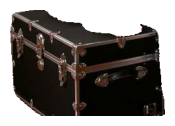

Mask labeling completed in 0.95 seconds
Mask labeling completed in 1.25 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6465


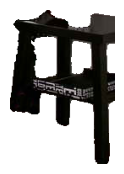

Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7268


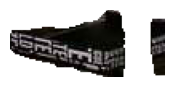

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.6118


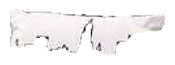

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 1.01 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7728


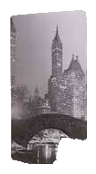

Mask labeling completed in 1.14 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 1.20 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.38 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.7102


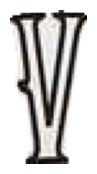

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.56 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9706


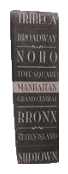

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.65 seconds
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Processing image 5, participant 105
	Generating general scene description…


Scene description completed in 12.78 seconds
1. **Scene Overview**:
   - The image depicts a stylishly decorated bedroom with a modern and artistic theme. The room features a combination of black, white, and red colors, creating a visually striking environment.

2. **Identified Objects**:
   - **Bed**: Center of the image, covered with black and white patterned bedding.
   - **Pillows**: On the bed, featuring similar black and white patterns.
   - **Wall Art**: Above the bed, a decorative piece with the word "LOVE" in black.
   - **Window**: Left side of the image, with white curtains.
   - **Red Shoe**: On the window sill.
   - **Posters**: Various posters on the walls, including one with the Eiffel Tower and another with city names.
   - **Red Table**: Below the window, holding decorative items.
   - **Candles**: On the red table.
   - **Red Lanterns**: Two on the window sill.
   - **Books**: On a black trunk at the foot of the bed.
   - **Red Box**: On the trunk, next to the books.


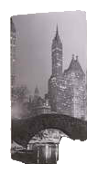

Mask labeling completed in 1.20 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 1.60 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8725


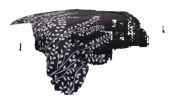

Mask labeling completed in 1.16 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.64 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8693


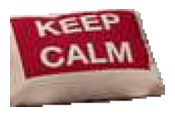

Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8880


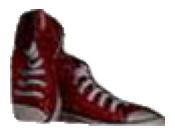

Mask labeling completed in 1.51 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.42 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 3.25 seconds
Participant data before center bias removal:  10
Participant data after center bias removal:  9
Processing image 6, participant 5
	Generating general scene description…


Scene description completed in 15.42 seconds
1. **Scene Overview**: 
   - The image depicts a stylish and playful children's bedroom. The room has a modern and whimsical design with a monochrome color scheme accented by yellow.

2. **Identified Objects**:
   - **Bed**: Located on the left side, featuring a black metal frame with geometric-patterned bedding in white, black, and yellow.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Wall Decor**: Above the bed, including a bear silhouette, a framed picture, and a hanging ornament.
   - **Pendant Light**: Yellow, hanging from the ceiling on the right side.
   - **Locker**: White, positioned next to the bed with decorative items on top.
   - **Decorative Items on Locker**: Includes a geometric wire sculpture and a small black figure.
   - **Side Table**: Wooden, to the right of the locker with a small plant and a basket.
   - **Basket**: Next to the side table, containing a 

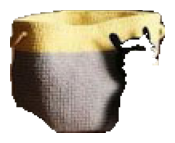

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.45 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9414


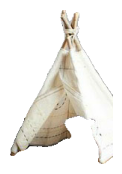

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 1.13 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9321


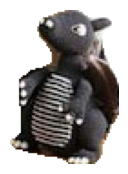

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 1.04 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9194


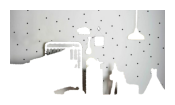

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.68 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9212


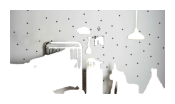

Mask labeling completed in 1.28 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 1.61 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.50 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9358


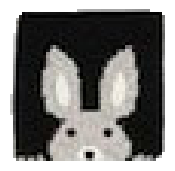

Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9113


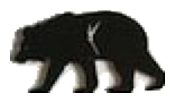

Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8526


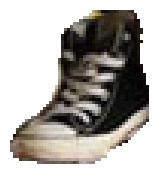

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6279


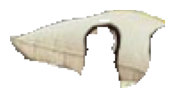

Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 1.06 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.55 seconds
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Processing image 6, participant 6
	Generating general scene description…


Scene description completed in 12.71 seconds
1. **Scene Overview**:
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Wall Decorations**: Above the bed, including a bear silhouette, a framed picture, and a hanging ornament.
   - **Yellow Pendant Light**: Hanging from the ceiling on the right side.
   - **Locker**: White, positioned next to the bed.
   - **Decorative Items on Locker**: Include a geometric wire sculpture and a small plant.
   - **Side Table**: Wooden, to the right of the locker, with a plant and a basket.
   - **Basket**: Next to the side table, containing toys.
   - **Bean Bag**: Black with white crosses, in front of the bed.
   - **Rug**: C

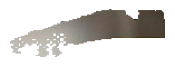

Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.56 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9533


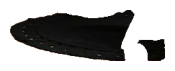

Mask labeling completed in 0.68 seconds
Mask labeling completed in 1.07 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 1.84 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.37 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9550


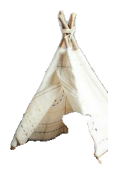

Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.59 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9741


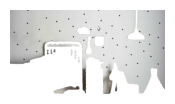

Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.71 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.7502


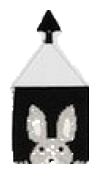

Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 1.95 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9241


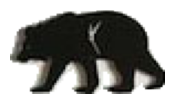

Mask labeling completed in 0.75 seconds
Mask labeling completed in 2.71 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.08 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.42 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8964


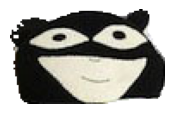

Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8789


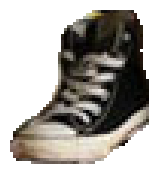

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 2.15 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.50 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 6, participant 11
	Generating general scene description…


Scene description completed in 12.30 seconds
1. **Scene Overview**:
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow, creating a lively yet cozy atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Wall Decorations**: Above the bed, including a bear silhouette, a cross, and a framed picture.
   - **Pendant Light**: A yellow light fixture hanging from the ceiling on the right.
   - **Locker**: A white locker-style cabinet next to the bed.
   - **Decorative Items on Locker**: A geometric wire sculpture and a small black figurine.
   - **Side Table**: A wooden table with a plant and a basket.
   - **Basket**: Next to the side table, containing a stuffed toy.
   - **Bean Bag**: Black with white crosse

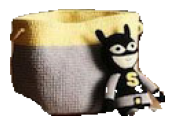

Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9696


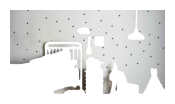

Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 1.66 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.81 seconds
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Processing image 6, participant 12
	Generating general scene description…


Scene description completed in 20.35 seconds
1. **Scene Overview**:
   - The image depicts a stylish and playful children's bedroom. The room has a modern and cozy design with a monochrome color scheme accented by yellow.

2. **Identified Objects**:
   - **Bed**: Located on the left side, featuring a black metal frame and geometric-patterned bedding with black, white, and yellow colors.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair of shoes placed on the bed.
   - **Wall Decorations**: Above the bed, including a black bear silhouette, a cross, and a framed picture of a rabbit.
   - **Pendant Light**: A yellow light fixture hanging from the ceiling on the right side.
   - **Locker**: A white locker-style cabinet next to the bed.
   - **Decorative Items on Locker**: Includes a geometric wire sculpture and a small black object.
   - **Side Table**: A wooden table with a plant and a basket, located to the right of the locker.
   - **Bean Bag**: A bl

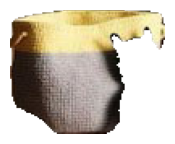

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 1.16 seconds
Mask labeling completed in 0.58 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8390


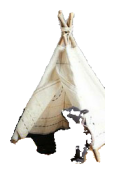

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 1.64 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9610


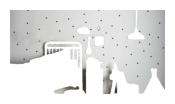

Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 1.47 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 2.32 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.57 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8447


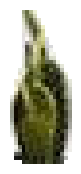

Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 1.04 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.89 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9515


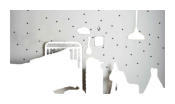

Mask labeling completed in 1.04 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 1.79 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.64 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9008


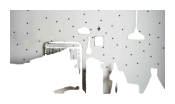

Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.57 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9123


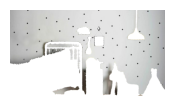

Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9729


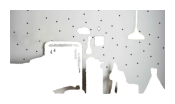

Mask labeling completed in 2.67 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 1.11 seconds
Mask labeling completed in 1.17 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.47 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.8327


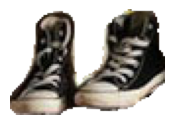

Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8883


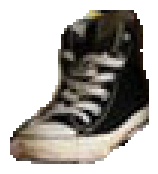

Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.60 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6922


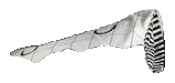

Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.97 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 6, participant 16
	Generating general scene description…


Scene description completed in 10.86 seconds
1. **Scene Overview**: 
   - The image depicts a stylish and playful children's bedroom. The room has a modern and cozy feel, with a monochrome color scheme accented by yellow.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Wall Decor**: Includes a bear silhouette, a framed picture, and a hanging light bulb, all on the wall above the bed.
   - **Yellow Pendant Light**: Hanging from the ceiling on the right side.
   - **Locker**: White, positioned next to the bed.
   - **Decorative Items on Locker**: Includes a geometric wire sculpture and a small black object.
   - **Wooden Stool**: To the right of the locker, with a plant and a stuffed toy on it.
   - **Basket**: Next to the stool, containing a stuffed toy.
   - **Bean Bag**: Black with white crosses, 

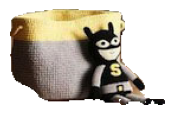

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.09 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8588


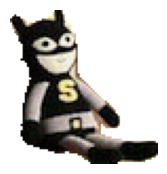

Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.14 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8389


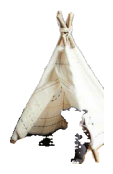

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.42 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8816


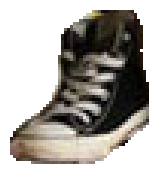

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8153


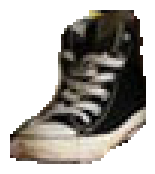

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.57 seconds
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Processing image 6, participant 17
	Generating general scene description…


Scene description completed in 12.44 seconds
1. **Scene Overview**: 
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow and geometric patterns.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and patterned bedding.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Wall Decorations**: Above the bed, including a bear silhouette, a cross, and a framed picture.
   - **Pendant Light**: Yellow, hanging from the ceiling on the right side.
   - **Locker**: White, positioned next to the bed.
   - **Decorative Items on Locker**: Includes a geometric wire sculpture and a small plant.
   - **Side Table**: Wooden, to the right of the locker.
   - **Basket**: Next to the side table, containing toys.
   - **Bean Bag**: Black with white crosses, in front of the bed.
   - **Rug**: Circular, placed on the

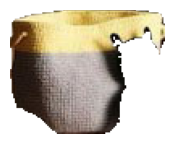

Mask labeling completed in 1.04 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8270


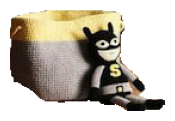

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 2.96 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9553


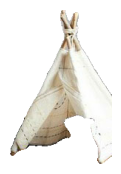

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 6.25 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.5558


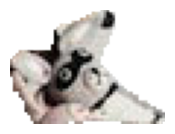

Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 1.34 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8802


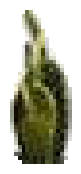

Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.38 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.5279


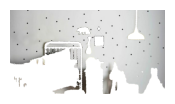

Mask labeling completed in 0.96 seconds
Mask labeling completed in 2.82 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.96 seconds
Mask labeling completed in 0.85 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9663


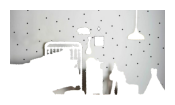

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 1.26 seconds
Mask labeling completed in 1.28 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 1.06 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.5196


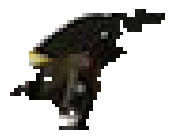

Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.92 seconds
Participant data before center bias removal:  11
Participant data after center bias removal:  10
Processing image 6, participant 18
	Generating general scene description…


Scene description completed in 22.19 seconds
1. **Scene Overview**: 
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow, creating a lively yet cozy atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Wall Decorations**: Above the bed, including a bear silhouette, a cross, and a framed picture.
   - **Pendant Light**: A yellow light fixture hanging from the ceiling on the right.
   - **Locker**: A small white locker next to the bed.
   - **Decorative Items on Locker**: A geometric wire sculpture and a small black object.
   - **Side Table**: A wooden table with a plant and a basket.
   - **Basket**: Next to the side table, containing a stuffed toy.
   - **Bean Bag**: Black with white crosses, in fro

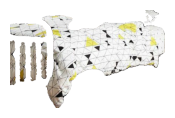

Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.92 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.7907


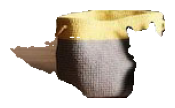

Mask labeling completed in 0.59 seconds
Mask labeling completed in 1.65 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.8669


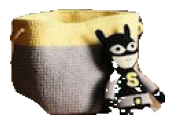

Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.96 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.49 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9524


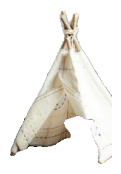

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.67 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9282


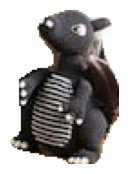

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 3.68 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.42 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.5482


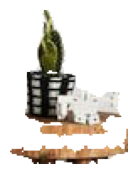

Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.69 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8673


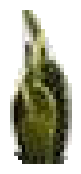

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 1.69 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.67 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6390


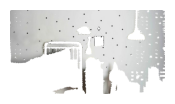

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 1.07 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.66 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9068


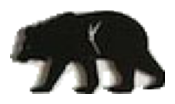

Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.64 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8438


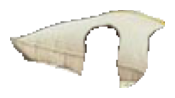

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 1.33 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 1.76 seconds
Mask labeling completed in 0.61 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 6, participant 34
	Generating general scene description…


Scene description completed in 13.67 seconds
1. **Scene Overview**: 
   - The image depicts a children's bedroom with a playful and modern design. The room features a combination of black, white, and yellow colors, creating a vibrant and cozy atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Wall Decorations**: Above the bed, including a bear silhouette, a framed picture, and a hanging ornament.
   - **Pendant Light**: A yellow light fixture hanging from the ceiling on the right.
   - **Locker**: A white locker to the right of the bed, with decorative items on top.
   - **Decorative Items on Locker**: Include a geometric wire sculpture and a small plant.
   - **Side Table**: A wooden table next to the locker with a plant and a basket.
   - **Basket**: On the floor near the side table, con

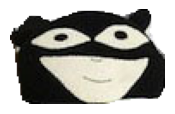

Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.21 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 1.41 seconds
Mask labeling completed in 2.10 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.56 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8830


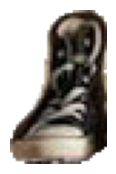

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 1.26 seconds
Mask labeling completed in 1.21 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6838


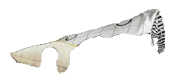

Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.45 seconds
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Processing image 6, participant 35
	Generating general scene description…


Scene description completed in 11.44 seconds
1. **Scene Overview**: 
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Wall Decorations**: Above the bed, including a bear silhouette, a cross, and a framed picture.
   - **Pendant Light**: Yellow, hanging from the ceiling on the right.
   - **Locker**: White, positioned next to the bed.
   - **Decorative Items on Locker**: A geometric wire sculpture and a small plant.
   - **Side Table**: Wooden, to the right of the locker.
   - **Basket**: Next to the side table, containing toys.
   - **Bean Bag**: Black with white crosses, in front of the bed.
   - **Rug**: Circular, with a spiral pattern, on the floor.
   

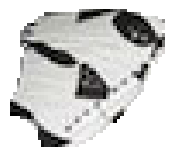

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 1.24 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.91 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8962


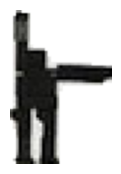

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8681


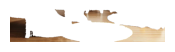

Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.40 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8843


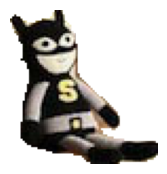

Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 1.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8913


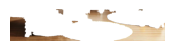

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 1.17 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.75 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9462


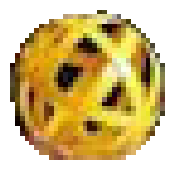

Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 1.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8860


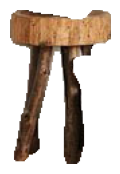

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7328


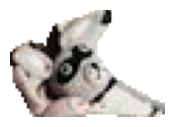

Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 1.28 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.31 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.48 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9695


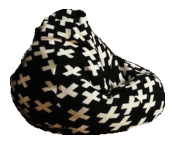

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.57 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8978


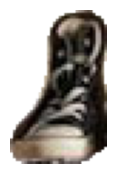

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.42 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8939


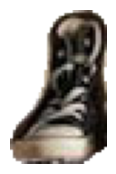

Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 1.68 seconds
Mask labeling completed in 0.84 seconds
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Processing image 6, participant 36
	Generating general scene description…


Scene description completed in 12.67 seconds
1. **Scene Overview**:
   - The image depicts a children's bedroom with a playful and modern design. The room features a combination of black, white, and yellow colors, creating a lively and inviting atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Bean Bag**: Black with white crosses, positioned on the floor in front of the bed.
   - **Rug**: Circular, placed on the floor near the center.
   - **Locker**: White, situated to the right of the bed.
   - **Decorative Items on Locker**: Includes a yellow geometric shape and a black object.
   - **Wall Decorations**: Black bear silhouette, a framed picture, and a hanging ornament above the locker.
   - **Yellow Pendant Light**: Hanging from the ceiling on the right side.
   - **Side Table**: Wooden

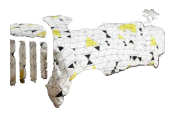

Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.71 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8401


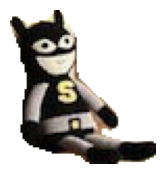

Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.82 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9285


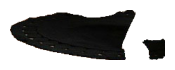

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.07 seconds
Mask labeling completed in 1.39 seconds
Mask labeling completed in 1.12 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.82 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9579


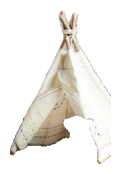

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.93 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 1.08 seconds
Mask labeling completed in 0.41 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9059


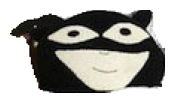

Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.69 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9041


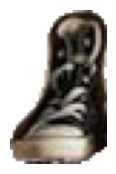

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.61 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 6, participant 40
	Generating general scene description…


Scene description completed in 18.41 seconds
1. **Scene Overview**: 
   - The image depicts a stylish and playful children's bedroom with a modern and monochrome theme, accented with yellow.

2. **Identified Objects**:
   - **Bed**: Located on the left side, featuring a black metal frame and geometric-patterned bedding with black, white, and yellow colors.
   - **Pillows**: On the bed, including a pillow with a masked face design.
   - **Shoes**: A pair of shoes placed on the bed.
   - **Wall Decorations**: 
     - Black bear silhouette on the wall above the bed.
     - Framed picture with a rabbit design.
     - Hanging decor with a cross and a small pouch.
   - **Pendant Light**: Yellow, hanging from the ceiling on the right side.
   - **Locker**: White, positioned next to the bed, with decorative items on top.
   - **Decorative Items on Locker**: 
     - Geometric yellow wireframe object.
     - Small black figurine.
   - **Side Table**: Wooden, to the right of the locker, with a sm

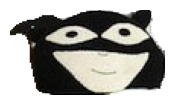

Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.5319


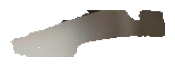

Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.50 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8118


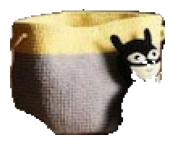

Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 3.07 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 1.06 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.52 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 6, participant 41
	Generating general scene description…


Scene description completed in 15.24 seconds
1. **Scene Overview**: 
   - The image depicts a children's bedroom with a playful and modern design. The room features a mix of monochrome and yellow accents, creating a lively yet stylish atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding in white, black, and yellow.
   - **Pillows**: On the bed, including a pillow with a mask design.
   - **Shoes**: A pair of shoes placed on the bed.
   - **Bean Bag**: Positioned on the floor in front of the bed, black with white crosses.
   - **Rug**: Circular rug on the floor, with concentric patterns in black and beige.
   - **Locker**: White locker to the right of the bed, used as a bedside table.
   - **Decorative Items on Locker**: Includes a yellow geometric wireframe and a small black object.
   - **Wall Decorations**: 
     - Black bear silhouette and other decorative items on the wall above the locker.
     - B

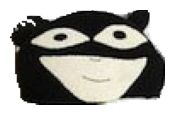

Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8924


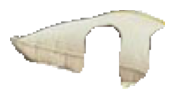

Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 1.04 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.82 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8979


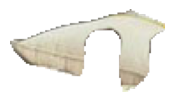

Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.64 seconds
Mask labeling completed in 1.02 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 6, participant 42
	Generating general scene description…


Scene description completed in 15.01 seconds
1. **Scene Overview**: 
   - The image depicts a stylish and playful children's bedroom with a modern and monochromatic theme, accented with yellow.

2. **Identified Objects**:
   - **Bed**: Located on the left side, featuring a black metal frame and geometric-patterned bedding in white, black, and yellow.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Wall Decor**: Includes a black bear silhouette, a framed picture, and a hanging ornament above the bed.
   - **Pendant Light**: Yellow, hanging from the ceiling on the right side.
   - **Locker**: White, positioned to the right of the bed.
   - **Decorative Items on Locker**: A geometric wire sculpture and a small black object.
   - **Side Table**: Wooden, to the right of the locker, with a small plant and a stuffed toy.
   - **Basket**: Next to the side table, containing a stuffed toy.
   - **Bean Bag**: Black with white crosse

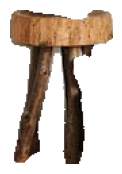

Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8653


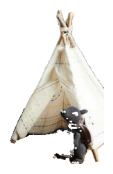

Mask labeling completed in 1.14 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.70 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8482


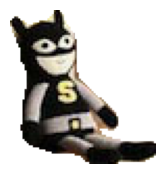

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8226


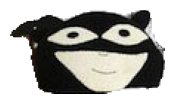

Mask labeling completed in 1.14 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.74 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8116


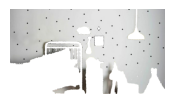

Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.68 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 6, participant 46
	Generating general scene description…


Scene description completed in 10.12 seconds
1. **Scene Overview**:
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow, creating a lively yet stylish atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Bean Bag**: Black with white crosses, positioned on the floor near the bed.
   - **Rug**: Circular, placed centrally on the floor.
   - **Locker**: White, situated to the right of the bed.
   - **Decorative Items on Locker**: Includes a yellow geometric sculpture and a black object.
   - **Wall Decorations**: Include a black bear silhouette, a framed picture, and a hanging ornament.
   - **Pendant Light**: Yellow, hanging from the ceiling on the right.
   - **Side Table**: Wooden, with a small plant 

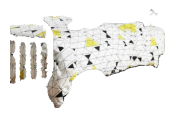

Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.99 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9558


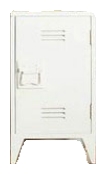

Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 1.08 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.55 seconds
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Processing image 6, participant 47
	Generating general scene description…


Scene description completed in 14.75 seconds
1. **Scene Overview**:
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow, creating a lively yet cohesive look.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding in white, black, and yellow.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair of shoes placed on the bed.
   - **Wall Decorations**: Above the bed, including a black bear silhouette, a framed picture, and a hanging ornament.
   - **Pendant Light**: A yellow light fixture hanging from the ceiling on the right side.
   - **Locker**: A white locker-style cabinet next to the bed.
   - **Decorative Items on Locker**: A geometric wire sculpture and a small black object.
   - **Side Table**: A wooden table with a plant and a basket, located to the right of the locker.
   - **Basket**: A

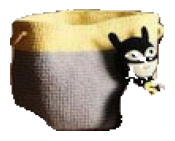

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 3.21 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.77 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9369


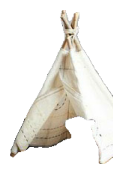

Mask labeling completed in 2.02 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 1.04 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.58 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9452


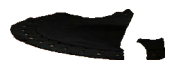

Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 2.57 seconds
Mask labeling completed in 1.32 seconds
Mask labeling completed in 0.73 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9519


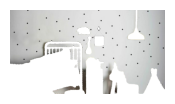

Mask labeling completed in 2.79 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.96 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.6426


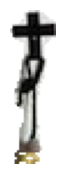

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 1.20 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.42 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8293


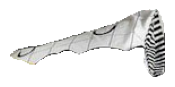

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 1.18 seconds
Mask labeling completed in 0.59 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8955


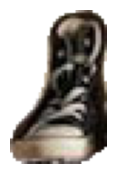

Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 2.34 seconds
Mask labeling completed in 0.61 seconds
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Processing image 6, participant 48
	Generating general scene description…


Scene description completed in 14.01 seconds
1. **Scene Overview**: 
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Wall Decor**: Above the bed, including a bear silhouette, a cross, and a framed picture.
   - **Pendant Light**: Yellow, hanging from the ceiling on the right side.
   - **Locker**: White, positioned next to the bed.
   - **Decorative Items on Locker**: Includes a geometric wire sculpture and a small plant.
   - **Side Table**: Wooden, to the right of the locker, with a plant and a basket.
   - **Basket**: Next to the side table, containing toys.
   - **Bean Bag**: Black with white crosses, in front of the bed.
   - **Rug**: Circular, place

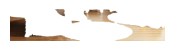

Mask labeling completed in 1.04 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 1.23 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9454


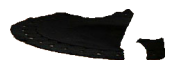

Mask labeling completed in 0.78 seconds
Mask labeling completed in 1.03 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.56 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8347


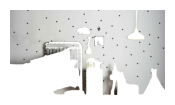

Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 1.09 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 1.54 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8772


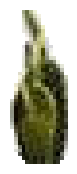

Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.7040


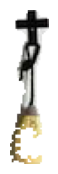

Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9180


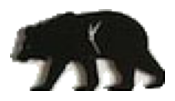

Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.66 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8686


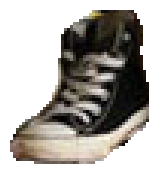

Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 1.02 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 6, participant 52
	Generating general scene description…


Scene description completed in 13.27 seconds
1. **Scene Overview**:
   - The image depicts a stylish and playful children's bedroom. The room has a modern and cozy atmosphere with a monochrome color scheme accented by yellow.

2. **Identified Objects**:
   - **Bed**: Located on the left side, featuring a black metal frame with patterned bedding in white, black, and yellow.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Wall Decorations**: Above the bed, including a bear silhouette, a framed picture, and a hanging ornament.
   - **Pendant Light**: A yellow light fixture hanging from the ceiling on the right.
   - **Locker**: A white locker-style cabinet next to the bed.
   - **Decorative Items on Locker**: A geometric wire sculpture and a small black object.
   - **Side Table**: A wooden table with a plant and a basket.
   - **Basket**: Next to the side table, containing a stuffed toy.
   - **Bean Bag**: Black with white 

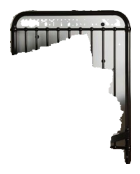

Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 1.31 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.15 seconds
Mask labeling completed in 0.88 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.6384


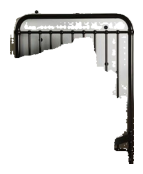

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 1.88 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 1.01 seconds
Mask labeling completed in 3.59 seconds
Mask labeling completed in 0.51 seconds
Participant data before center bias removal:  7
Participant data after center bias removal:  6
Processing image 6, participant 53
	Generating general scene description…


Scene description completed in 16.97 seconds
1. **Scene Overview**:
   - The image depicts a stylish and playful children's bedroom. The room has a modern and cozy design with a monochrome color scheme accented by yellow.

2. **Identified Objects**:
   - **Bed**: Located on the left side, featuring a black metal frame with patterned bedding in white, black, and yellow.
   - **Pillows**: On the bed, including a pillow with a mask design.
   - **Shoes**: A pair of shoes placed on the bed.
   - **Wall Decor**: Includes a black bear silhouette, a framed picture, and a hanging light bulb on the wall.
   - **Yellow Pendant Light**: Hanging from the ceiling on the right side.
   - **Locker**: A white locker is positioned next to the bed.
   - **Decorative Items on Locker**: A geometric wire sculpture and a small black object.
   - **Side Table**: A wooden side table with a small plant and a stuffed toy.
   - **Basket**: A woven basket with a stuffed toy inside, located near the side table.
  

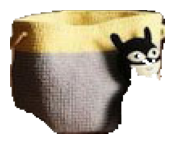

Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9508


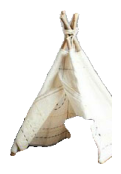

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 1.16 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.67 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9174


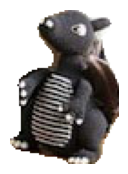

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 3.62 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.59 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9226


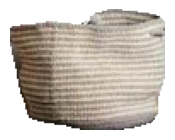

Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.7687


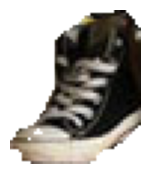

Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 0.45 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8959


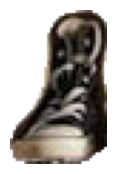

Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 1.74 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.38 seconds
Participant data before center bias removal:  6
Participant data after center bias removal:  5
Processing image 6, participant 54
	Generating general scene description…


Scene description completed in 8.54 seconds
1. **Scene Overview**:
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow and geometric patterns.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Wall Decorations**: Above the bed, including a bear silhouette, a framed picture, and a hanging ornament.
   - **Yellow Pendant Light**: Hanging from the ceiling on the right side.
   - **Locker**: White, positioned next to the bed.
   - **Decorative Items on Locker**: Includes a geometric wire sculpture and a small plant.
   - **Side Table**: Wooden, to the right of the locker, with a plant and a basket.
   - **Bean Bag**: Black with white crosses, in front of the bed.
   - **Rug**: Circular, with a spiral pattern, on 

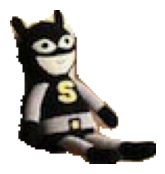

Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.80 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9437


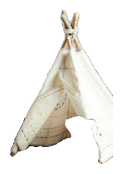

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.94 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.51 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.6583


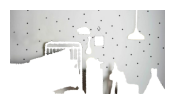

Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.95 seconds
Mask labeling completed in 2.52 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.81 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9323


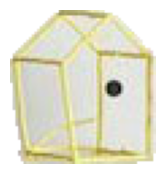

Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 1.21 seconds
Mask labeling completed in 1.06 seconds
Mask labeling completed in 1.23 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.03 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7450


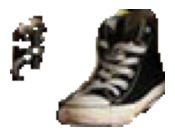

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.74 seconds
Participant data before center bias removal:  5
Participant data after center bias removal:  4
Processing image 6, participant 58
	Generating general scene description…


Scene description completed in 15.74 seconds
1. **Scene Overview**: 
   - The image depicts a stylish and playful children's bedroom with a modern and monochromatic theme, accented with yellow. The room is designed with a mix of functional and decorative elements, creating a cozy and inviting atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side, featuring a black metal frame with patterned bedding in white, black, and yellow.
   - **Pillows**: On the bed, including a pillow with a mask design.
   - **Shoes**: A pair of shoes placed on the bed.
   - **Bean Bag**: Positioned on the floor in front of the bed, black with white crosses.
   - **Rug**: Circular, placed on the floor in front of the bed and bean bag, with concentric patterns.
   - **Locker**: White, situated to the right of the bed, used as a bedside table.
   - **Decorative Items on Locker**: Includes a geometric yellow wireframe and a black object.
   - **Wall Decorations**: Above the locker, includi

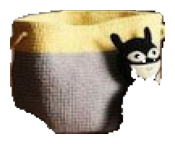

Mask labeling completed in 1.21 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 1.42 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.64 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8837


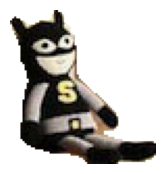

Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 1.35 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: circle, score: 0.6742


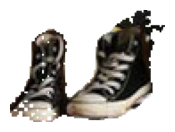

Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 1.57 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.48 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9063


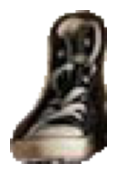

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.60 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 6, participant 59
	Generating general scene description…


Scene description completed in 13.80 seconds
1. **Scene Overview**: 
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow, creating a lively yet cohesive look.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding in white, black, and yellow.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Bean Bag**: Black with white crosses, positioned on the floor near the bed.
   - **Rug**: Circular, placed centrally on the floor with a spiral pattern.
   - **Locker**: White, situated to the right of the bed.
   - **Decorative Items on Locker**: Includes a yellow geometric wireframe and a black object.
   - **Wall Decorations**: Black bear silhouette, a framed picture, and a hanging ornament above the locker.
   - **Pendant Light**: Yellow, hanging from the ceiling on the ri

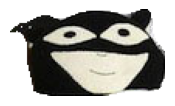

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8298


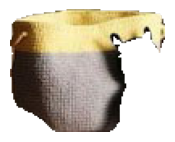

Mask labeling completed in 1.26 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.71 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8774


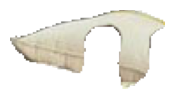

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 1.34 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 0.74 seconds
Participant data before center bias removal:  12
Participant data after center bias removal:  11
Processing image 6, participant 60
	Generating general scene description…


Scene description completed in 17.12 seconds
1. **Scene Overview**:
   - The image depicts a stylish and playful children's bedroom. The decor is modern with a monochrome color scheme accented by yellow highlights.

2. **Identified Objects**:
   - **Bed**: Located on the left side, featuring a black metal frame with patterned bedding.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Wall Decor**: Above the bed, including a bear silhouette, a framed picture, and a hanging ornament.
   - **Pendant Light**: Yellow, hanging from the ceiling on the right side.
   - **Locker**: White, positioned next to the bed.
   - **Decorative Items on Locker**: Includes a geometric wire sculpture and a small plant.
   - **Side Table**: Wooden, to the right of the locker, with a plant and a basket.
   - **Basket**: Next to the side table, containing a stuffed toy.
   - **Bean Bag**: Black with white crosses, in front of the bed.
   - **Rug**:

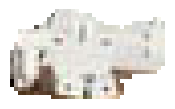

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9533


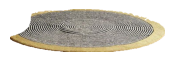

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.98 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8833


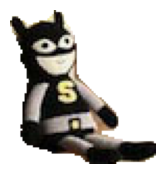

Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.79 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.7528


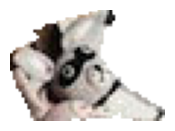

Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8396


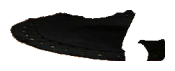

Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 1.07 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9165


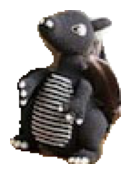

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.73 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.9345


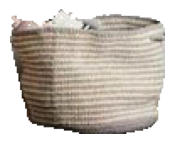

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 1.16 seconds
Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.60 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.6472


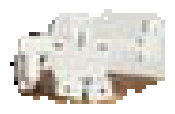

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 1.23 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.44 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8953


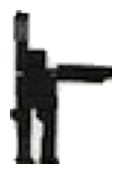

Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.79 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.50 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.8111


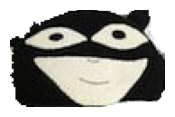

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.55 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9181


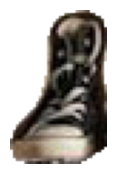

Mask labeling completed in 0.49 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.44 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 6, participant 64
	Generating general scene description…


Scene description completed in 15.07 seconds
1. **Scene Overview**:
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow, creating a lively yet cozy atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding in white, black, and yellow.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair of shoes placed on the bed.
   - **Bean Bag**: In front of the bed, black with white crosses.
   - **Rug**: Circular, placed on the floor in front of the bed, with concentric patterns.
   - **Locker**: White, positioned to the right of the bed.
   - **Decorative Objects on Locker**: Includes a yellow geometric wireframe and a black object.
   - **Wall Decorations**: Above the locker, including a black bear silhouette, a framed picture, and a hanging ornament.
   - **Pendant Light**: Yellow, hanging fr

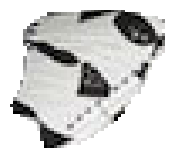

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.66 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8903


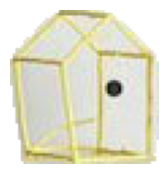

Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.82 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8775


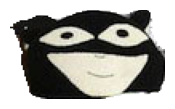

Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 1.09 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.77 seconds
Participant data before center bias removal:  9
Participant data after center bias removal:  8
Processing image 6, participant 67
	Generating general scene description…


Scene description completed in 13.39 seconds
1. **Scene Overview**:
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow, creating a lively yet cozy atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side, featuring a black metal frame with patterned bedding in white, black, and yellow.
   - **Pillows**: On the bed, including a pillow with a mask design.
   - **Shoes**: A pair of shoes placed on the bed.
   - **Wall Decor**: Above the bed, there are black polka dots, a bear silhouette, and other decorative items.
   - **Pendant Light**: A yellow light fixture hanging from the ceiling on the right side.
   - **Locker**: A white locker-style cabinet next to the bed.
   - **Decorative Items**: On top of the locker, including a geometric wire sculpture and a small plant.
   - **Side Table**: A wooden table with a plant and a basket, located to the right of the locker.
   - **B

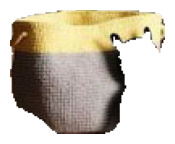

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 1.21 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9348


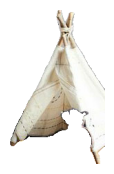

Mask labeling completed in 0.60 seconds
Mask labeling completed in 1.04 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 1.33 seconds
Mask labeling completed in 0.61 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9519


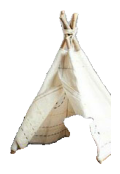

Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.82 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9271


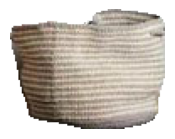

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.72 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8580


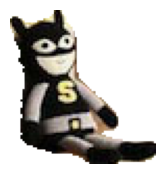

Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.56 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9755


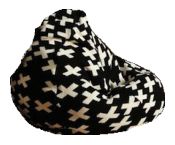

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.8106


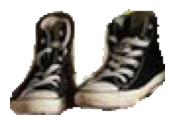

Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8933


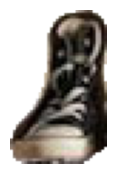

Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.71 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 6, participant 69
	Generating general scene description…


Scene description completed in 13.06 seconds
1. **Scene Overview**: 
   - The image depicts a stylish and playful children's bedroom with a modern and monochromatic theme, accented with yellow.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Wall Decorations**: Above the bed, including a bear silhouette, a cross, and a framed picture.
   - **Pendant Light**: Yellow, hanging from the ceiling on the right side.
   - **Locker**: White, positioned next to the bed.
   - **Decorative Items on Locker**: A geometric wire sculpture and a small black object.
   - **Side Table**: Wooden, to the right of the locker.
   - **Plant**: On the side table, in a striped pot.
   - **Basket**: Next to the side table, containing a stuffed toy.
   - **Bean Bag**: Black with white crosses, in front of the bed.
   - **Rug*

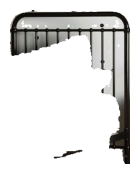

Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 1.65 seconds
Mask labeling completed in 0.87 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 1.90 seconds
Mask labeling completed in 0.86 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.60 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8988


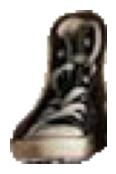

Mask labeling completed in 1.22 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.88 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.63 seconds
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Processing image 6, participant 73
	Generating general scene description…


Scene description completed in 10.11 seconds
1. **Scene Overview**:
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow, creating a lively yet cohesive look.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Bean Bag**: Positioned on the floor in front of the bed, black with white crosses.
   - **Rug**: Circular, placed on the floor in front of the bean bag.
   - **Locker**: White, situated to the right of the bed.
   - **Decorative Items on Locker**: Includes a yellow geometric shape and a black object.
   - **Wall Decorations**: Above the locker, including a bear silhouette, a framed picture, and a hanging ornament.
   - **Yellow Pendant Light**: Hanging from the ceiling on the right side.
   - **Side Table

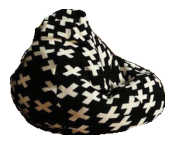

Mask labeling completed in 1.83 seconds
Mask labeling completed in 0.84 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.63 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8008


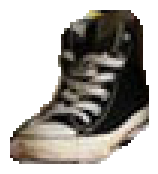

Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.77 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8890


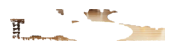

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 1.43 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 1.36 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.62 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9521


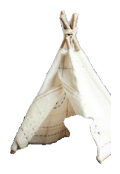

Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.91 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9278


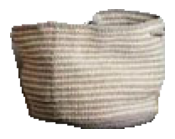

Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.36 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8376


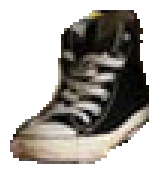

Mask labeling completed in 0.90 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.89 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.65 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8986


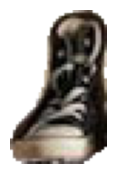

Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.50 seconds
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Processing image 6, participant 83
	Generating general scene description…


Scene description completed in 18.08 seconds
1. **Scene Overview**:
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow, creating a lively yet cozy atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding in white, black, and yellow.
   - **Pillows**: On the bed, including a pillow with a masked face design.
   - **Shoes**: A pair of shoes is placed on the bed.
   - **Bean Bag**: Positioned on the floor in front of the bed, black with white crosses.
   - **Rug**: Circular, placed on the floor in front of the bed and bean bag, with concentric patterns.
   - **Locker**: White, located to the right of the bed, serving as a bedside table.
   - **Decorative Items on Locker**: Includes a yellow geometric wireframe and a small black object.
   - **Wall Decorations**: Above the bed, including a black bear silhouette, a fram

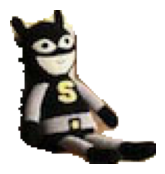

Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.45 seconds
Mask labeling completed in 0.59 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9426


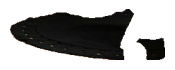

Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8650


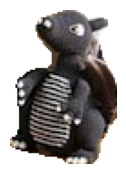

Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.41 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 1.06 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.32 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.44 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.9087


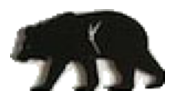

Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.57 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.5556


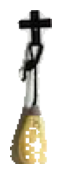

Mask labeling completed in 0.34 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 2.38 seconds
Mask labeling completed in 1.11 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.92 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.8331


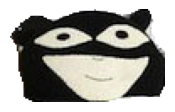

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8394


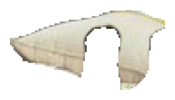

Mask labeling completed in 0.57 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.53 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 6, participant 85
	Generating general scene description…


Scene description completed in 11.70 seconds
1. **Scene Overview**:
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow, creating a lively yet cozy atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Bean Bag**: Black with white crosses, positioned on the floor near the bed.
   - **Rug**: Circular, placed on the floor in front of the bed.
   - **Locker**: White, situated to the right of the bed.
   - **Decorative Items on Locker**: Includes a yellow geometric shape and a small black figure.
   - **Wall Decorations**: Black bear silhouette, a framed picture, and a hanging ornament above the locker.
   - **Pendant Light**: Yellow, hanging from the ceiling on the right side.
   - **Side Table**: Wooden

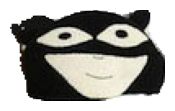

Mask labeling completed in 0.66 seconds
Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.47 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.60 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.8661


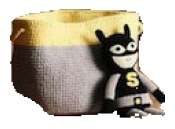

Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.69 seconds
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Processing image 6, participant 87
	Generating general scene description…


Scene description completed in 10.31 seconds
1. **Scene Overview**:
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow, creating a lively yet cohesive look.

2. **Identified Objects**:
   - **Bed**: Located on the left side, featuring a black metal frame with patterned bedding in white, black, and yellow.
   - **Pillows**: On the bed, including a pillow with a mask design.
   - **Shoes**: A pair of shoes placed on the bed.
   - **Wall Decorations**: Above the bed, including a bear silhouette, a framed picture, and a hanging ornament.
   - **Pendant Light**: A yellow light fixture hanging from the ceiling on the right side.
   - **Locker**: A white locker-style cabinet next to the bed.
   - **Decorative Items**: On top of the locker, including a geometric wire sculpture and a small plant.
   - **Side Table**: A wooden table with a plant and a basket, located to the right of the locker.
   - **B

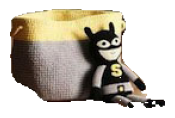

Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 1.29 seconds
Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.53 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8865


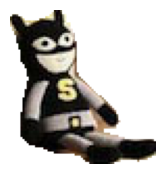

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.38 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.65 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8809


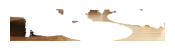

Mask labeling completed in 0.74 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.97 seconds
Mask labeling completed in 1.13 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.46 seconds
Mask labeling completed in 3.78 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.52 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: cross, score: 0.4267


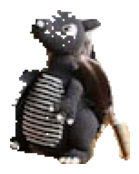

Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.68 seconds
Mask labeling completed in 0.54 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: triangle, score: 0.7116


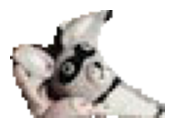

Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.67 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8796


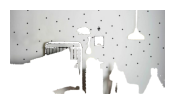

Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 1.00 seconds
Mask labeling completed in 1.19 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 2.15 seconds
Mask labeling completed in 0.85 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 1.02 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8492


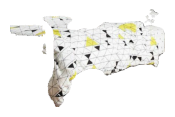

Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.60 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 6, participant 89
	Generating general scene description…


Scene description completed in 11.75 seconds
1. **Scene Overview**: 
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Wall Decorations**: Above the bed, including a bear silhouette, a framed picture, and a hanging ornament.
   - **Pendant Light**: Yellow, hanging from the ceiling on the right side.
   - **Locker**: White, positioned next to the bed.
   - **Decorative Items on Locker**: A geometric wire sculpture and a small black object.
   - **Side Table**: Wooden, to the right of the locker.
   - **Plant**: On the side table, in a black and white pot.
   - **Basket**: Next to the side table, containing a stuffed toy.
   - **Bean Bag**: Black with white c

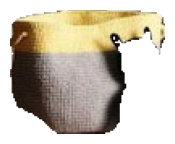

Mask labeling completed in 0.56 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 1.08 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.69 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.54 seconds
Mask labeling completed in 1.09 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8350


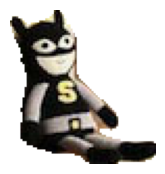

Mask labeling completed in 0.86 seconds
Mask labeling completed in 1.74 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.42 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.52 seconds
Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.67 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8943


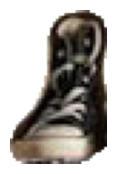

Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.48 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.61 seconds
Mask labeling completed in 0.33 seconds
Mask labeling completed in 0.57 seconds
Participant data before center bias removal:  3
Participant data after center bias removal:  2
Processing image 6, participant 93
	Generating general scene description…


Scene description completed in 13.82 seconds
1. **Scene Overview**: 
   - The image depicts a children's bedroom with a playful and modern design. The room features a combination of black, white, and yellow colors, creating a vibrant yet cozy atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Wall Decor**: Above the bed, including a bear silhouette, a framed picture, and a hanging ornament.
   - **Pendant Light**: A yellow light fixture hanging from the ceiling on the right side.
   - **Locker**: A white locker-style cabinet next to the bed.
   - **Decorative Items on Locker**: Includes a geometric wireframe and a small black object.
   - **Side Table**: A wooden table with a plant and a basket.
   - **Basket**: Next to the side table, containing a stuffed toy.
   - **Bean Bag**: Black wit

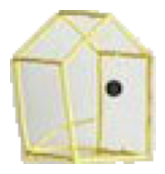

Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.60 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.92 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.43 seconds
Mask labeling completed in 0.82 seconds
Mask labeling completed in 0.55 seconds
Mask labeling completed in 0.71 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7369


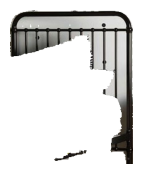

Mask labeling completed in 0.83 seconds
Mask labeling completed in 0.51 seconds
Mask labeling completed in 0.39 seconds
Mask labeling completed in 0.65 seconds
Mask labeling completed in 0.40 seconds
Mask labeling completed in 0.80 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.72 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.79 seconds
Participant data before center bias removal:  4
Participant data after center bias removal:  3
Processing image 6, participant 99
	Generating general scene description…


Scene description completed in 11.13 seconds
1. **Scene Overview**:
   - The image depicts a children's bedroom with a playful and modern design. The room features a monochrome color scheme with accents of yellow, creating a lively and inviting atmosphere.

2. **Identified Objects**:
   - **Bed**: Located on the left side, with a black metal frame and geometric-patterned bedding.
   - **Pillows**: On the bed, including one with a mask design.
   - **Shoes**: A pair placed on the bed.
   - **Wall Decor**: Above the bed, including a bear silhouette, a cross, and a framed picture.
   - **Pendant Light**: A yellow light fixture hanging from the ceiling on the right.
   - **Locker**: A white locker positioned next to the bed.
   - **Decorative Items on Locker**: A geometric wire sculpture and a small black object.
   - **Side Table**: A wooden table with a plant and a basket underneath.
   - **Basket**: Next to the side table, containing a stuffed toy.
   - **Bean Bag**: Black with white cr

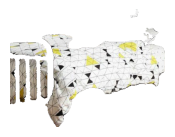

Mask labeling completed in 0.75 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.50 seconds
Mask labeling completed in 0.70 seconds
Mask labeling completed in 0.73 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.75 seconds
Mask labeling completed in 1.02 seconds
Mask labeling completed in 0.67 seconds
Mask labeling completed in 0.71 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.8726


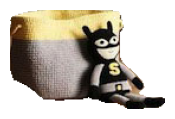

Mask labeling completed in 0.77 seconds
Mask labeling completed in 0.59 seconds
Mask labeling completed in 0.53 seconds
Mask labeling completed in 0.58 seconds
Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.78 seconds
Mask labeling completed in 0.37 seconds
Mask labeling completed in 0.49 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.46 seconds
Processing prompt type: point
Processing prompt type: circle
Processing prompt type: triangle
Processing prompt type: cross
Best mask found with prompt type: point, score: 0.7956


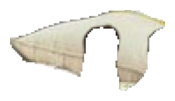

Mask labeling completed in 0.62 seconds
Mask labeling completed in 0.76 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.71 seconds
Mask labeling completed in 0.44 seconds
Mask labeling completed in 0.35 seconds
Mask labeling completed in 0.63 seconds
Mask labeling completed in 0.64 seconds
Mask labeling completed in 0.81 seconds
Mask labeling completed in 0.89 seconds
Participant data before center bias removal:  8
Participant data after center bias removal:  7
Processing image 6, participant 101
	Generating general scene description…


Exception: Failed to initialize OpenAI client: [X509: NO_CERTIFICATE_OR_CRL_FOUND] no certificate or crl found (_ssl.c:4096)

In [ ]:
import os
import glob                    # ← new
import pandas as pd

from src.core.Participant import Participant
from src.core.ImageData   import ImageData
from src.core.FixationTask  import FixationTask
from src.models.MaskGenerator import SAM2
from src.prompts.gaze_prompts import *  

# load the experiment data
datapath = os.path.join("data", "experiments", "XSQ_Expt1_Data_All.csv")
data     = pd.read_csv(datapath)
CONDITION_ID = 3
GROUP_ID     = 2
EXP_TYPE     = "unexp"

# 1) subset to Group 2 & Condition 3
subset = data[
    (data["Condition"] == CONDITION_ID) &
    (data["Group"]     == GROUP_ID)
]

# 2) pick the first 30 image IDs from that subset
first_30_images = sorted(subset["ItemNum"].unique())[:30]
print("Will process images:", first_30_images)

# 3) loop over those 30 images
for img_id in first_30_images:
    imgpath = os.path.join(IMAGE_DIR, f"{img_id}{EXP_TYPE}.jpg")
    if not os.path.isfile(imgpath):
        print(f"Warning: {imgpath} not found, skipping image {img_id}.")
        continue

    imageData = ImageData(imgpath, img_type=EXP_TYPE)

    # 4) loop over every participant who saw this image
    participants = subset.loc[subset.ItemNum == img_id, "ParticipantID"].unique()
    for part_ID in participants:
        participant = Participant(int(part_ID))

        task = FixationTask(
            participant,
            imageData,
            data,                # full data; will be re-filtered inside
            condition=CONDITION_ID,
            group=GROUP_ID,
            rows_per_second=1
        )

        task_data = task.data

        print(f"Processing image {img_id}, participant {part_ID}")
        print("\tGenerating general scene description…")
        llm = create_llm_instance("openai", "gpt-4o", temperature=0.1)
        scene_description = llm.describe_scene(imageData)
        print(scene_description)

        mask_gen = SAM2(
            sam_model_path   = SAM_MODEL,
            sam_model_config = SAM_CONFIG,
            task             = task
        )

        # unchanged: loop over each fixation
        for fix_indx in task_data.index:

            # ←––––– INSERTED block starts here –––––→
            # skip if this fixation’s best-mask PNG already exists anywhere under Masks/
            pattern = os.path.join(
                RESULTS_DIR, "Masks", "**",
                f"IMG_{img_id}_type_{EXP_TYPE}_Part_{part_ID}_MASK_{fix_indx}_best_*_mask_*.png"
            )
            if glob.glob(pattern, recursive=True):
                print(f"  ↳ Skipping fixation {fix_indx} (already done)")
                continue
            # ←––––– INSERTED block ends here –––––→

            fix_prompt = task_data.iloc[fix_indx]

            mask = mask_gen.compute_masks_with_prompt(
                fix_indx,
                fix_prompt,
                output_path=os.path.join(RESULTS_DIR, "Masks"),
                DEBUG=True,
                save_mask=True
            )
            mask.plot()

            mask_labels = [
                llm.label_mask(mask, imageData, use_context=True, context=scene_description)
                for _ in range(10)
            ]
            mask.labels = mask_labels

            mask_gen.save_mask_object(
                mask,
                mask.path.replace(".png", "")
            )


In [ ]:
mask.path

In [ ]:
os.path.exists(".\\outputs\\Masks\\BestMask\\IMG_1_type_exp_Part_2_MASK_2_best_cross_mask_0.8931.png")

In [ ]:
import pickle
with open(mask.path.replace(".png", ".pkl"), 'rb') as f:
    new_mask = pickle.load(f)


In [ ]:
new_mask.labels

In [ ]:

# get the directory path from the mask_filename_path
directory_path = os.path.dirname(mask.path)
if not os.path.exists(directory_path):
    os.makedirs(directory_path)

# Save the complete Mask object as pickle
with open(mask.path + ".pkl", 'wb') as f:
    pickle.dump(mask_object, f)

# Save the cropped image with alpha as PNG
Image.fromarray(mask_object.cropped_image_with_alpha).save(mask_filename_path+".png")


In [ ]:
mask.labels

In [ ]:
mask = mask_gen.compute_masks_with_prompt(1,prompt_1, output_path = os.path.join(RESULTS_DIR, "Masks"), DEBUG = True, save_mask = True)
mask.plot()

# generate label candidates for the mask
mask_labels = []
for i in range(0, 10):  # asking the LLM to label the image 10x so we can get a distribution of labels
    mask_label = llm.label_mask(mask, imageData, use_context = True, context = scene_description) 
    mask_labels.append(mask_label)
mask_labels


Cheking another participant doing a fixation task on IMG 1

In [ ]:
mask = mask_gen.compute_masks_with_prompt(2,prompt_2, output_path = os.path.join(RESULTS_DIR, "Masks"), DEBUG = True, save_mask = True)
mask.plot()

# generate label candidates for the mask
mask_labels = []
for i in range(0, 10):  # asking the LLM to label the image 10x so we can get a distribution of labels
    mask_label = llm.label_mask(mask, imageData, use_context = True, context = scene_description) 
    mask_labels.append(mask_label)
mask_labels

In [ ]:
IMG_ID = 1
part_ID = int(data[data.ItemNum == IMG_ID].ParticipantID.unique()[1])
participant =  Participant(part_ID)
print("Participant ID:", part_ID)

task2 = FixationTask(participant, imageData, data, condition = CONDITION_ID, group = GROUP_ID, rows_per_second=1)

In [ ]:
task2_data = task2.data.copy()

In [ ]:
prompt_0 = task2_data.iloc[0]
prompt_1 = task2_data.iloc[1]
prompt_2 = task2_data.iloc[2]

In [ ]:
mask_gen2 = SAM2(sam_model_path = SAM_MODEL, sam_model_config = SAM_CONFIG, task = task2)

In [ ]:
mask2 = mask_gen2.compute_masks_with_prompt(0,prompt_0, output_path = os.path.join(RESULTS_DIR, "Masks"), DEBUG = True, save_mask = True)
mask2.plot()
mask_gen2.task.masks

In [ ]:
mask2 = mask_gen2.compute_masks_with_prompt(1,prompt_1, output_path = os.path.join(RESULTS_DIR, "Masks"), DEBUG = True, save_mask = True)
mask2.plot()
mask_gen2.task.masks

In [ ]:
mask2 = mask_gen2.compute_masks_with_prompt(2,prompt_2, output_path = os.path.join(RESULTS_DIR, "Masks"), DEBUG = True, save_mask = True)
mask2.plot()
mask_gen2.task.masks

putting everything into a single dict

In [ ]:
merged = {}
merged[IMG_ID] = {**mask_gen.task.masks, **mask_gen2.task.masks}
merged

## Mask Labeller Test

In [ ]:
import pickle

mask_path = "outputs\Masks\BestMask\IMG_1_type_exp_Part_2_MASK_0_best_point_mask_0.8917.pkl"

with open(mask_path, 'rb') as mask_file:
    best_mask = pickle.load(mask_file)

best_mask

In [ ]:
best_mask.path

In [ ]:
best_mask.labels